# Analisis Data Kesehatan Masyarakat Provinsi Jawa Barat

Tanggal Pembuatan Awal : 02 Oktober 2024

Tanggal Perbaikan : 1 Oktober 2023

### Kelompok 1
Alifa Salsabila (2308138)
Muhammad Bintang Eighista (2304137)
Nina Wulandari (2312091)
Putra Aditya Simbolon (2305839)
Yahyo Abdullozoda (2313368)

### Pendahuluan
Dalam rangka memaksimalkan penggunaan fasilitas kesehatan dalam melayani pasien di provinsi Jawa Barat kita menganalisis data dari beberapa kasus penyakit dengan ketersediaan fasilitas kesehatan di provinsi Jawa Barat. Untuk mengetahui hal-hal tersebut, analisis ini menggunakan data dari Dinas Kesehatan untuk mengeksplorasi jumlah fasilitas kesehatan dan hubungannya dengan beberapa penyakit. Dalam tulisan ini dipilih beberapa datset penyakit yaitu, campak, demam, pneumonia, tetanus, tuberkulosis, diare, malaria, HIV, dan AIDS. Dengan analisis ini, kita bisa mengetahui wilayah-wilayah yang harus diprioritaskan dalam pembangunan fasilitas kesehatan.

### Pertanyaan
1. Bagaimana tren penyakit tertentu di Provinsi Jawa Barat?
2. Bagaimana perbandingan ketersedian fasilitas Kesehatan dengan jumlah penduduk di kabupaten/kota di Provinsi Jawa Barat?
3. Apakah terdapat wilayah yang memiliki tren penyakit tinggi, tetapi memiliki pebandingan ketersedian fasilitas Kesehatan dengan jumlah penduduk yang rendah?


# LIBRARY

In [1]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from adjustText import adjust_text

# DATASET YANG DIGUNAKAN

## Dataset Populasi di Provinsi Jawa Barat

tautan dataset = https://bandungkab.bps.go.id/id/statistics-table/2/MjgwIzI%253D/jumlah-penduduk-menurut-kabupaten-kota-di-provinsi-jawa-barat.html

In [2]:
populasi = pd.read_csv("content/Datasets/populasi_jabar_2019_2023.csv")

In [3]:
populasi.rename(columns = {'Kabupaten/Kota' : 'nama_kabupaten_kota'}, inplace = True)

# Ubah kolom nama_kabupaten_kota menjadi huruf kapital pada dataset populasi
populasi['nama_kabupaten_kota'] = populasi['nama_kabupaten_kota'].str.upper()

# Ubah dataset populasi ke dalam long format
populasi_long = populasi.melt(id_vars=['nama_kabupaten_kota'], 
                              var_name='tahun', 
                              value_name='populasi')

# Ubah kolom 'tahun' pada populasi_long menjadi tipe data integer
populasi_long['tahun'] = populasi_long['tahun'].astype(int)

In [4]:
populasi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27 entries, 0 to 26
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   nama_kabupaten_kota  27 non-null     object 
 1   2019                 27 non-null     float64
 2   2020                 27 non-null     float64
 3   2021                 27 non-null     float64
 4   2022                 27 non-null     float64
 5   2023                 27 non-null     float64
dtypes: float64(5), object(1)
memory usage: 1.4+ KB


In [5]:
populasi.head()

,nama_kabupaten_kota,2019,2020,2021,2022,2023
0,KABUPATEN BANDUNG,3775.28,3623.79,3652.40,3687.25,3721.11
1,KABUPATEN BANDUNG BARAT,1699.90,1788.34,1808.42,1834.23,1859.64
2,KABUPATEN BEKASI,3763.89,3113.02,3148.74,3193.84,3237.42
3,KABUPATEN BOGOR,5965.41,5427.07,5484.15,5556.31,5627.02
4,KABUPATEN CIAMIS,1195.18,1229.07,1234.83,1243.32,1251.54


In [6]:
populasi.describe()

,2019,2020,2021,2022,2023
count,27.000000,27.000000,27.000000,27.000000,27.000000
mean,1826.544815,1787.932593,1805.141852,1826.177778,1846.678889
std,1296.820115,1174.387459,1186.527538,1201.509593,1216.139254
min,183.110000,200.970000,202.720000,205.140000,207.510000
25%,1021.845000,1020.470000,1029.925000,1042.060000,1053.895000
50%,1699.900000,1788.340000,1808.420000,1834.230000,1859.640000
75%,2436.550000,2460.860000,2483.105000,2513.000000,2542.070000
max,5965.410000,5427.070000,5484.150000,5556.310000,5627.020000


## Jumlah Fasilitas Kesehatan Berdasarkan Jenis di Jawa Barat

tautan dataset : https://opendata.jabarprov.go.id/id/dataset/jumlah-fasilitas-kesehatan-berdasarkan-jenis-di-jawa-barat

In [7]:
faskes = pd.read_csv("content/Datasets/jumlah_fasilitas_kesehatan.csv")

In [8]:
faskes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 810 entries, 0 to 809
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   id                   810 non-null    int64 
 1   kode_provinsi        810 non-null    int64 
 2   nama_provinsi        810 non-null    object
 3   kode_kabupaten_kota  810 non-null    int64 
 4   nama_kabupaten_kota  810 non-null    object
 5   jenis_faskes         810 non-null    object
 6   jumlah_faskes        810 non-null    int64 
 7   satuan               810 non-null    object
 8   tahun                810 non-null    int64 
dtypes: int64(5), object(4)
memory usage: 57.1+ KB


In [9]:
faskes.head(10)

,id,kode_provinsi,nama_provinsi,kode_kabupaten_kota,nama_kabupaten_kota,jenis_faskes,jumlah_faskes,satuan,tahun
0,1,32,JAWA BARAT,3201,KABUPATEN BOGOR,RUMAH SAKIT UMUM,9,UNIT,2018
1,2,32,JAWA BARAT,3201,KABUPATEN BOGOR,RUMAH SAKIT KHUSUS,0,UNIT,2018
2,3,32,JAWA BARAT,3201,KABUPATEN BOGOR,RUMAH SAKIT BERSALIN,0,UNIT,2018
3,4,32,JAWA BARAT,3201,KABUPATEN BOGOR,PUSKESMAS,62,UNIT,2018
4,5,32,JAWA BARAT,3201,KABUPATEN BOGOR,POSYANDU,4927,UNIT,2018
5,6,32,JAWA BARAT,3202,KABUPATEN SUKABUMI,RUMAH SAKIT UMUM,7,UNIT,2018
6,7,32,JAWA BARAT,3202,KABUPATEN SUKABUMI,RUMAH SAKIT KHUSUS,0,UNIT,2018
7,8,32,JAWA BARAT,3202,KABUPATEN SUKABUMI,RUMAH SAKIT BERSALIN,0,UNIT,2018
8,9,32,JAWA BARAT,3202,KABUPATEN SUKABUMI,PUSKESMAS,32,UNIT,2018
9,10,32,JAWA BARAT,3202,KABUPATEN SUKABUMI,POSYANDU,3551,UNIT,2018


### Jumlah Kasus Campak di Jawa Barat

tautan dataset : https://opendata.jabarprov.go.id/id/dataset/jumlah-kasus-penyakit-campak-berdasarkan-kabupatenkota-di-jawa-barat

In [10]:
campak = pd.read_csv('content/Datasets/jml_kasus_penyakit_campak.csv')

In [11]:
# ringkasan isi dari dataframe campak
campak.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 162 entries, 0 to 161
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   id                   162 non-null    int64 
 1   kode_provinsi        162 non-null    int64 
 2   nama_provinsi        162 non-null    object
 3   kode_kabupaten_kota  162 non-null    int64 
 4   nama_kabupaten_kota  162 non-null    object
 5   jumlah_kasus         162 non-null    int64 
 6   satuan               162 non-null    object
 7   tahun                162 non-null    int64 
dtypes: int64(5), object(3)
memory usage: 10.2+ KB


In [12]:
# 10 baris pertama dari dataFrame campak
campak.head(10)

,id,kode_provinsi,nama_provinsi,kode_kabupaten_kota,nama_kabupaten_kota,jumlah_kasus,satuan,tahun
0,1,32,JAWA BARAT,3201,KABUPATEN BOGOR,9,ORANG,2018
1,2,32,JAWA BARAT,3202,KABUPATEN SUKABUMI,0,ORANG,2018
2,3,32,JAWA BARAT,3203,KABUPATEN CIANJUR,153,ORANG,2018
3,4,32,JAWA BARAT,3204,KABUPATEN BANDUNG,0,ORANG,2018
4,5,32,JAWA BARAT,3205,KABUPATEN GARUT,1,ORANG,2018
5,6,32,JAWA BARAT,3206,KABUPATEN TASIKMALAYA,2,ORANG,2018
6,7,32,JAWA BARAT,3207,KABUPATEN CIAMIS,2,ORANG,2018
7,8,32,JAWA BARAT,3208,KABUPATEN KUNINGAN,18,ORANG,2018
8,9,32,JAWA BARAT,3209,KABUPATEN CIREBON,92,ORANG,2018
9,10,32,JAWA BARAT,3210,KABUPATEN MAJALENGKA,2,ORANG,2018


### Jumlah Kasus HIV di Jawa Barat


tautan dataset : https://opendata.jabarprov.go.id/id/dataset/jumlah-kasus-hiv-berdasarkan-kabupatenkota-di-jawa-barat

In [13]:
#jumlah kasus penyakit hiv
hiv = pd.read_csv('content/Datasets/jml_kasus_hiv.csv')

In [14]:
# ringkasan isi dari dataframe hiv
hiv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 162 entries, 0 to 161
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   id                   162 non-null    int64 
 1   kode_provinsi        162 non-null    int64 
 2   nama_provinsi        162 non-null    object
 3   kode_kabupaten_kota  162 non-null    int64 
 4   nama_kabupaten_kota  162 non-null    object
 5   jumlah_kasus         162 non-null    int64 
 6   satuan               162 non-null    object
 7   tahun                162 non-null    int64 
dtypes: int64(5), object(3)
memory usage: 10.2+ KB


In [15]:
# 10 baris pertama dari dataFrame hiv
hiv.head(10)

,id,kode_provinsi,nama_provinsi,kode_kabupaten_kota,nama_kabupaten_kota,jumlah_kasus,satuan,tahun
0,1,32,JAWA BARAT,3201,KABUPATEN BOGOR,318,ORANG,2018
1,2,32,JAWA BARAT,3202,KABUPATEN SUKABUMI,112,ORANG,2018
2,3,32,JAWA BARAT,3203,KABUPATEN CIANJUR,124,ORANG,2018
3,4,32,JAWA BARAT,3204,KABUPATEN BANDUNG,219,ORANG,2018
4,5,32,JAWA BARAT,3205,KABUPATEN GARUT,107,ORANG,2018
5,6,32,JAWA BARAT,3206,KABUPATEN TASIKMALAYA,40,ORANG,2018
6,7,32,JAWA BARAT,3207,KABUPATEN CIAMIS,66,ORANG,2018
7,8,32,JAWA BARAT,3208,KABUPATEN KUNINGAN,78,ORANG,2018
8,9,32,JAWA BARAT,3209,KABUPATEN CIREBON,278,ORANG,2018
9,10,32,JAWA BARAT,3210,KABUPATEN MAJALENGKA,92,ORANG,2018


### Jumlah Kasus Diabetes di Jawa Barat


tautan dataset : https://opendata.jabarprov.go.id/id/dataset/jumlah-penderita-diabetes-melitus-berdasarkan-kabupatenkota-di-jawa-barat

In [16]:
#jumlah kasus penyakit diabetes
diabetes = pd.read_csv('content/Datasets/jml_penderita_diabetes_melitus.csv')

In [17]:
# ringkasan isi dari dataframe Diabetes
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216 entries, 0 to 215
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   id                   216 non-null    int64 
 1   kode_provinsi        216 non-null    int64 
 2   nama_provinsi        216 non-null    object
 3   kode_kabupaten_kota  216 non-null    int64 
 4   nama_kabupaten_kota  216 non-null    object
 5   jumlah_kasus         216 non-null    int64 
 6   satuan               216 non-null    object
 7   tahun                216 non-null    int64 
dtypes: int64(5), object(3)
memory usage: 13.6+ KB


In [18]:
# 10 baris pertama dari dataFrame Diabetes
diabetes.head(10)

,id,kode_provinsi,nama_provinsi,kode_kabupaten_kota,nama_kabupaten_kota,jumlah_kasus,satuan,tahun
0,1,32,JAWA BARAT,3201,KABUPATEN BOGOR,159405,ORANG,2016
1,2,32,JAWA BARAT,3202,KABUPATEN SUKABUMI,37369,ORANG,2016
2,3,32,JAWA BARAT,3203,KABUPATEN CIANJUR,41709,ORANG,2016
3,4,32,JAWA BARAT,3204,KABUPATEN BANDUNG,90337,ORANG,2016
4,5,32,JAWA BARAT,3205,KABUPATEN GARUT,96111,ORANG,2016
5,6,32,JAWA BARAT,3206,KABUPATEN TASIKMALAYA,25629,ORANG,2016
6,7,32,JAWA BARAT,3207,KABUPATEN CIAMIS,31254,ORANG,2016
7,8,32,JAWA BARAT,3208,KABUPATEN KUNINGAN,26554,ORANG,2016
8,9,32,JAWA BARAT,3209,KABUPATEN CIREBON,74674,ORANG,2016
9,10,32,JAWA BARAT,3210,KABUPATEN MAJALENGKA,19976,ORANG,2016


### Jumlah Kasus Tuberkulosis di Jawa Barat

tautan dataset : https://opendata.jabarprov.go.id/id/dataset/jumlah-kasus-penyakit-tuberkulosis-berdasarkan-kabupatenkota-di-jawa-barat

In [19]:
#jumlah kasus penyakit tuberkulosis
tuberkulosis = pd.read_csv('content/Datasets/jml_kasus_penyakit_tuberkulosis.csv')

In [20]:
# ringkasan isi dari dataframe Tuberkulosis
tuberkulosis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216 entries, 0 to 215
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   id                   216 non-null    int64 
 1   kode_provinsi        216 non-null    int64 
 2   nama_provinsi        216 non-null    object
 3   kode_kabupaten_kota  216 non-null    int64 
 4   nama_kabupaten_kota  216 non-null    object
 5   jumlah_kasus         216 non-null    int64 
 6   satuan               216 non-null    object
 7   tahun                216 non-null    int64 
dtypes: int64(5), object(3)
memory usage: 13.6+ KB


In [21]:
# 10 baris pertama dari dataFrame Tuberkulosis
tuberkulosis.head(10)

,id,kode_provinsi,nama_provinsi,kode_kabupaten_kota,nama_kabupaten_kota,jumlah_kasus,satuan,tahun
0,1,32,JAWA BARAT,3201,KABUPATEN BOGOR,8444,ORANG,2016
1,2,32,JAWA BARAT,3202,KABUPATEN SUKABUMI,3191,ORANG,2016
2,3,32,JAWA BARAT,3203,KABUPATEN CIANJUR,3010,ORANG,2016
3,4,32,JAWA BARAT,3204,KABUPATEN BANDUNG,5202,ORANG,2016
4,5,32,JAWA BARAT,3205,KABUPATEN GARUT,2711,ORANG,2016
5,6,32,JAWA BARAT,3206,KABUPATEN TASIKMALAYA,1683,ORANG,2016
6,7,32,JAWA BARAT,3207,KABUPATEN CIAMIS,1354,ORANG,2016
7,8,32,JAWA BARAT,3208,KABUPATEN KUNINGAN,2060,ORANG,2016
8,9,32,JAWA BARAT,3209,KABUPATEN CIREBON,3172,ORANG,2016
9,10,32,JAWA BARAT,3210,KABUPATEN MAJALENGKA,1583,ORANG,2016


## Jumlah Kasus Diare di Jawa Barat

tautan dataset : https://opendata.jabarprov.go.id/id/dataset/jumlah-kasus-penyakit-diare-berdasarkan-kabupatenkota-di-jawa-barat

In [22]:
diare = pd.read_csv("content/Datasets/jml_kasus_penyakit_diare.csv")

In [23]:
diare.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216 entries, 0 to 215
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   id                   216 non-null    int64 
 1   kode_provinsi        216 non-null    int64 
 2   nama_provinsi        216 non-null    object
 3   kode_kabupaten_kota  216 non-null    int64 
 4   nama_kabupaten_kota  216 non-null    object
 5   jumlah_kasus         216 non-null    int64 
 6   satuan               216 non-null    object
 7   tahun                216 non-null    int64 
dtypes: int64(5), object(3)
memory usage: 13.6+ KB


In [24]:
diare.head(10)

,id,kode_provinsi,nama_provinsi,kode_kabupaten_kota,nama_kabupaten_kota,jumlah_kasus,satuan,tahun
0,1,32,JAWA BARAT,3201,KABUPATEN BOGOR,159405,ORANG,2016
1,2,32,JAWA BARAT,3202,KABUPATEN SUKABUMI,37369,ORANG,2016
2,3,32,JAWA BARAT,3203,KABUPATEN CIANJUR,41709,ORANG,2016
3,4,32,JAWA BARAT,3204,KABUPATEN BANDUNG,90337,ORANG,2016
4,5,32,JAWA BARAT,3205,KABUPATEN GARUT,96111,ORANG,2016
5,6,32,JAWA BARAT,3206,KABUPATEN TASIKMALAYA,25629,ORANG,2016
6,7,32,JAWA BARAT,3207,KABUPATEN CIAMIS,31254,ORANG,2016
7,8,32,JAWA BARAT,3208,KABUPATEN KUNINGAN,26554,ORANG,2016
8,9,32,JAWA BARAT,3209,KABUPATEN CIREBON,74674,ORANG,2016
9,10,32,JAWA BARAT,3210,KABUPATEN MAJALENGKA,19976,ORANG,2016


### Jumlah Kasus Pneumonia di Jawa Barat

tautan dataset : https://opendata.jabarprov.go.id/id/dataset/jumlah-kasus-penyakit-pneumonia-berdasarkan-kabupatenkota-di-jawa-barat

In [25]:
#jumlah kasus penyakit pneumonia
pneumonia = pd.read_csv('content/Datasets/jml_kasus_penyakit_pneumonia.csv')

In [26]:
# ringkasan isi dari dataframe Pneumonia
pneumonia.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 135 entries, 0 to 134
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   id                   135 non-null    int64 
 1   kode_provinsi        135 non-null    int64 
 2   nama_provinsi        135 non-null    object
 3   kode_kabupaten_kota  135 non-null    int64 
 4   nama_kabupaten_kota  135 non-null    object
 5   jumlah_kasus         135 non-null    int64 
 6   satuan               135 non-null    object
 7   tahun                135 non-null    int64 
dtypes: int64(5), object(3)
memory usage: 8.6+ KB


In [27]:
# 10 baris pertama dari dataFrame Pneumonia
pneumonia.head(10)

,id,kode_provinsi,nama_provinsi,kode_kabupaten_kota,nama_kabupaten_kota,jumlah_kasus,satuan,tahun
0,1,32,JAWA BARAT,3201,KABUPATEN BOGOR,7325,ORANG,2019
1,2,32,JAWA BARAT,3202,KABUPATEN SUKABUMI,4906,ORANG,2019
2,3,32,JAWA BARAT,3203,KABUPATEN CIANJUR,4290,ORANG,2019
3,4,32,JAWA BARAT,3204,KABUPATEN BANDUNG,8349,ORANG,2019
4,5,32,JAWA BARAT,3205,KABUPATEN GARUT,8374,ORANG,2019
5,6,32,JAWA BARAT,3206,KABUPATEN TASIKMALAYA,3902,ORANG,2019
6,7,32,JAWA BARAT,3207,KABUPATEN CIAMIS,5072,ORANG,2019
7,8,32,JAWA BARAT,3208,KABUPATEN KUNINGAN,2277,ORANG,2019
8,9,32,JAWA BARAT,3209,KABUPATEN CIREBON,10818,ORANG,2019
9,10,32,JAWA BARAT,3210,KABUPATEN MAJALENGKA,4677,ORANG,2019


### Jumlah Kasus Tetanus di Jawa Barat

tautan dataset : https://opendata.jabarprov.go.id/id/dataset/jumlah-kasus-penyakit-tetanus-berdasarkan-kabupatenkota-di-jawa-barat

In [28]:
#jumlah kasus penyakit tetanus
tetanus = pd.read_csv('content/Datasets/jml_kasus_penyakit_tetanus.csv')

In [29]:
# ringkasan isi dari dataframe Tetanus
tetanus.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216 entries, 0 to 215
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   id                   216 non-null    int64 
 1   kode_provinsi        216 non-null    int64 
 2   nama_provinsi        216 non-null    object
 3   kode_kabupaten_kota  216 non-null    int64 
 4   nama_kabupaten_kota  216 non-null    object
 5   jumlah_kasus         216 non-null    int64 
 6   satuan               216 non-null    object
 7   tahun                216 non-null    int64 
dtypes: int64(5), object(3)
memory usage: 13.6+ KB


In [30]:
# 10 baris pertama dari dataFrame Tetanus
tetanus.head(10)

,id,kode_provinsi,nama_provinsi,kode_kabupaten_kota,nama_kabupaten_kota,jumlah_kasus,satuan,tahun
0,1,32,JAWA BARAT,3201,KABUPATEN BOGOR,2,ORANG,2016
1,2,32,JAWA BARAT,3202,KABUPATEN SUKABUMI,0,ORANG,2016
2,3,32,JAWA BARAT,3203,KABUPATEN CIANJUR,2,ORANG,2016
3,4,32,JAWA BARAT,3204,KABUPATEN BANDUNG,2,ORANG,2016
4,5,32,JAWA BARAT,3205,KABUPATEN GARUT,4,ORANG,2016
5,6,32,JAWA BARAT,3206,KABUPATEN TASIKMALAYA,1,ORANG,2016
6,7,32,JAWA BARAT,3207,KABUPATEN CIAMIS,0,ORANG,2016
7,8,32,JAWA BARAT,3208,KABUPATEN KUNINGAN,0,ORANG,2016
8,9,32,JAWA BARAT,3209,KABUPATEN CIREBON,1,ORANG,2016
9,10,32,JAWA BARAT,3210,KABUPATEN MAJALENGKA,0,ORANG,2016


### Jumlah Kasus Malaria di Jawa Barat

tautan dataset : https://opendata.jabarprov.go.id/id/dataset/jumlah-kasus-penyakit-malaria-berdasarkan-kabupatenkota-di-jawa-barat

In [31]:
#jumlah kasus penyakit malaria
malaria = pd.read_csv('content/Datasets/jml_kasus_penyakit_malaria.csv')

In [32]:
# ringkasan isi dari dataframe Malaria
malaria.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216 entries, 0 to 215
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   id                   216 non-null    int64 
 1   kode_provinsi        216 non-null    int64 
 2   nama_provinsi        216 non-null    object
 3   kode_kabupaten_kota  216 non-null    int64 
 4   nama_kabupaten_kota  216 non-null    object
 5   jumlah_kasus         216 non-null    int64 
 6   satuan               216 non-null    object
 7   tahun                216 non-null    int64 
dtypes: int64(5), object(3)
memory usage: 13.6+ KB


In [33]:
# 10 baris pertama dari dataFrame Malaria
malaria.head(10)

,id,kode_provinsi,nama_provinsi,kode_kabupaten_kota,nama_kabupaten_kota,jumlah_kasus,satuan,tahun
0,1,32,JAWA BARAT,3201,KABUPATEN BOGOR,0,ORANG,2016
1,2,32,JAWA BARAT,3202,KABUPATEN SUKABUMI,66,ORANG,2016
2,3,32,JAWA BARAT,3203,KABUPATEN CIANJUR,0,ORANG,2016
3,4,32,JAWA BARAT,3204,KABUPATEN BANDUNG,1,ORANG,2016
4,5,32,JAWA BARAT,3205,KABUPATEN GARUT,5,ORANG,2016
5,6,32,JAWA BARAT,3206,KABUPATEN TASIKMALAYA,59,ORANG,2016
6,7,32,JAWA BARAT,3207,KABUPATEN CIAMIS,0,ORANG,2016
7,8,32,JAWA BARAT,3208,KABUPATEN KUNINGAN,0,ORANG,2016
8,9,32,JAWA BARAT,3209,KABUPATEN CIREBON,11,ORANG,2016
9,10,32,JAWA BARAT,3210,KABUPATEN MAJALENGKA,0,ORANG,2016


### Jumlah Kasus Demam Berdarah di Jawa Barat

tautan dataset : https://opendata.jabarprov.go.id/id/dataset/jumlah-kasus-penyakit-demam-berdarah-dengue-dbd-berdasarkan-kabupatenkota-di-jawa-barat

In [34]:
#jumlah kasus penyakit Demam berdarah
demam_berdarah = pd.read_csv('content/Datasets/jml_kasus_penyakit_demam_berdarah.csv')

In [35]:
# ringkasan isi dari dataframe Demam Berdarah
demam_berdarah.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 216 entries, 0 to 215
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   id                   216 non-null    int64 
 1   kode_provinsi        216 non-null    int64 
 2   nama_provinsi        216 non-null    object
 3   kode_kabupaten_kota  216 non-null    int64 
 4   nama_kabupaten_kota  216 non-null    object
 5   jumlah_kasus         216 non-null    int64 
 6   satuan               216 non-null    object
 7   tahun                216 non-null    int64 
dtypes: int64(5), object(3)
memory usage: 13.6+ KB


In [36]:
# 10 baris pertama dari dataFrame Demam Berdarah
demam_berdarah.head(10)

,id,kode_provinsi,nama_provinsi,kode_kabupaten_kota,nama_kabupaten_kota,jumlah_kasus,satuan,tahun
0,1,32,JAWA BARAT,3201,KABUPATEN BOGOR,3477,ORANG,2016
1,2,32,JAWA BARAT,3202,KABUPATEN SUKABUMI,854,ORANG,2016
2,3,32,JAWA BARAT,3203,KABUPATEN CIANJUR,799,ORANG,2016
3,4,32,JAWA BARAT,3204,KABUPATEN BANDUNG,3466,ORANG,2016
4,5,32,JAWA BARAT,3205,KABUPATEN GARUT,561,ORANG,2016
5,6,32,JAWA BARAT,3206,KABUPATEN TASIKMALAYA,478,ORANG,2016
6,7,32,JAWA BARAT,3207,KABUPATEN CIAMIS,748,ORANG,2016
7,8,32,JAWA BARAT,3208,KABUPATEN KUNINGAN,1720,ORANG,2016
8,9,32,JAWA BARAT,3209,KABUPATEN CIREBON,1877,ORANG,2016
9,10,32,JAWA BARAT,3210,KABUPATEN MAJALENGKA,322,ORANG,2016


# PRA-PROSES

#### Hapus kolom yang tidak diperlukan

Beberapa kolom yang tidak diperlukan dari dataset kami hapus untuk membuat data yang bersih. Dalam hal ini, kami menghapus kolom id, kode_provinsi, nama_provinsi, kode_kabupaten_kota, dan satuan dalam dataset fasilitas kesehatan maupun dataset jumlah kasus penyakit yang mana tidak dibutuhkan untuk proses selanjutnya.

In [37]:
faskes = faskes.drop(columns = ['id','kode_provinsi', 'nama_provinsi', 'kode_kabupaten_kota', 'satuan'])
campak = campak.drop(columns = ['kode_provinsi', 'nama_provinsi', 'satuan', 'kode_kabupaten_kota'])
pneumonia = pneumonia.drop(columns = ['kode_provinsi', 'nama_provinsi', 'satuan', 'kode_kabupaten_kota', 'id'])
diare = diare.drop(columns = ['kode_provinsi', 'nama_provinsi', 'satuan', 'kode_kabupaten_kota', 'id'])
hiv = hiv.drop(columns = ['kode_provinsi', 'nama_provinsi', 'satuan', 'kode_kabupaten_kota', 'id'])
demam_berdarah = demam_berdarah.drop(columns = ['kode_provinsi', 'nama_provinsi', 'satuan', 'kode_kabupaten_kota', 'id'])
malaria = malaria.drop(columns = ['kode_provinsi', 'nama_provinsi', 'satuan', 'kode_kabupaten_kota', 'id'])
diabetes = diabetes.drop(columns = ['kode_provinsi', 'nama_provinsi', 'satuan', 'kode_kabupaten_kota', 'id'])
tetanus = tetanus.drop(columns = ['kode_provinsi', 'nama_provinsi', 'satuan', 'kode_kabupaten_kota', 'id'])
tuberkulosis = tuberkulosis.drop(columns = ['kode_provinsi', 'nama_provinsi', 'satuan', 'kode_kabupaten_kota', 'id'])

#### Filter dataset dari tahun 2019 - 2023

Memfilter data berdasarkan rentang tahun, yaitu dari tahun 2019 hingga 2023 atau melakukan operasi pada beberapa Dataset di mana setiap dataset dipotong (subset) agar hanya berisi data dari tahun 2019 hingga 2023. Filter dataset ini dilakukan pada dataset fasilitas kesehatan maupun dataset tiap kasus penyakit.

In [38]:
faskes = faskes[(faskes['tahun'] >= 2019) & (faskes['tahun'] <= 2023)]
campak = campak[(campak['tahun'] >= 2019) & (campak['tahun'] <= 2023)]
diare = diare[(diare['tahun'] >= 2019) & (diare['tahun'] <= 2023)]
pneumonia = pneumonia[(pneumonia['tahun'] >= 2019) & (pneumonia['tahun'] <= 2023)]
hiv = hiv[(hiv['tahun'] >= 2019) & (hiv['tahun'] <= 2023)]
malaria = malaria[(malaria['tahun'] >= 2019) & (malaria['tahun'] <= 2023)]
demam_berdarah = demam_berdarah[(demam_berdarah['tahun'] >= 2019) & (demam_berdarah['tahun'] <= 2023)]
diabetes = diabetes[(diabetes['tahun'] >= 2019) & (diabetes['tahun'] <= 2023)]
tetanus = tetanus[(tetanus['tahun'] >= 2019) & (tetanus['tahun'] <= 2023)]
tuberkulosis = tuberkulosis[(tuberkulosis['tahun'] >= 2019) & (tuberkulosis['tahun'] <= 2023)]

#### Cek nilai kosong

Memeriksa apakah terdapat nilai kosong di dalam setiap dataset, baik dataset fasilitas kesehatan dan dataset tiap penyakit untuk melakukan pembersihan data.

In [39]:
print("Jumlah nilai kosong dataset faskes:")
print(faskes.isnull().sum())

print('-------------------------------------')

print("Jumlah nilai kosong dataset campak:")
print(campak.isnull().sum())

print('-------------------------------------')

print("Jumlah nilai kosong dataset diabetes:")
print(diabetes.isnull().sum())

print('-------------------------------------')

print("Jumlah nilai kosong dataset diare:")
print(diare.isnull().sum())

print('-------------------------------------')

print("Jumlah nilai kosong dataset pneumonia:")
print(pneumonia.isnull().sum())

print('-------------------------------------')

print("Jumlah nilai kosong dataset malaria:")
print(malaria.isnull().sum())

print('-------------------------------------')

print("Jumlah nilai kosong dataset hiv:")
print(hiv.isnull().sum())

print('-------------------------------------')

print("Jumlah nilai kosong dataset tetanus:")
print(tetanus.isnull().sum())

print('-------------------------------------')

print("Jumlah nilai kosong dataset tuberkulosis:")
print(tuberkulosis.isnull().sum())

print('-------------------------------------')

print("Jumlah nilai kosong dataset demam berdarah:")
print(demam_berdarah.isnull().sum())


Jumlah nilai kosong dataset faskes:
nama_kabupaten_kota    0
jenis_faskes           0
jumlah_faskes          0
tahun                  0
dtype: int64
-------------------------------------
Jumlah nilai kosong dataset campak:
id                     0
nama_kabupaten_kota    0
jumlah_kasus           0
tahun                  0
dtype: int64
-------------------------------------
Jumlah nilai kosong dataset diabetes:
nama_kabupaten_kota    0
jumlah_kasus           0
tahun                  0
dtype: int64
-------------------------------------
Jumlah nilai kosong dataset diare:
nama_kabupaten_kota    0
jumlah_kasus           0
tahun                  0
dtype: int64
-------------------------------------
Jumlah nilai kosong dataset pneumonia:
nama_kabupaten_kota    0
jumlah_kasus           0
tahun                  0
dtype: int64
-------------------------------------
Jumlah nilai kosong dataset malaria:
nama_kabupaten_kota    0
jumlah_kasus           0
tahun                  0
dtype: int64
-----------

#### Cek nilai rata-rata, min, max untuk setiap kasus penyakit

#### Campak

In [40]:
campak['jumlah_kasus'].describe()

count     135.000000
mean       83.614815
std       165.326181
min         0.000000
25%         0.000000
50%        15.000000
75%        75.000000
max      1093.000000
Name: jumlah_kasus, dtype: float64

#### Pneumonia

In [41]:
pneumonia['jumlah_kasus'].describe()

count      135.000000
mean      3463.274074
std       2255.695661
min        160.000000
25%       1687.000000
50%       3152.000000
75%       4836.000000
max      11779.000000
Name: jumlah_kasus, dtype: float64

#### Diare

In [42]:
diare['jumlah_kasus'].describe()

count       135.000000
mean      49656.429630
std       34490.992549
min        4944.000000
25%       26120.000000
50%       45897.000000
75%       67695.500000
max      166464.000000
Name: jumlah_kasus, dtype: float64

#### HIV

In [43]:
hiv['jumlah_kasus'].describe()

count     135.000000
mean      239.614815
std       210.163972
min         0.000000
25%        98.000000
50%       186.000000
75%       327.500000
max      1135.000000
Name: jumlah_kasus, dtype: float64

In [44]:
hiv[hiv['nama_kabupaten_kota'] == 'KOTA BANDUNG']

,nama_kabupaten_kota,jumlah_kasus,tahun
47,KOTA BANDUNG,357,2019
74,KOTA BANDUNG,82,2020
101,KOTA BANDUNG,43,2021
128,KOTA BANDUNG,1135,2022
155,KOTA BANDUNG,1059,2023


#### Demam Berdarah

In [45]:
demam_berdarah['jumlah_kasus'].describe()


count     135.000000
mean      956.614815
std       940.632186
min        29.000000
25%       334.500000
50%       651.000000
75%      1283.500000
max      5205.000000
Name: jumlah_kasus, dtype: float64

#### Malaria

In [46]:
malaria['jumlah_kasus'].describe()

count    135.000000
mean      13.111111
std       29.035405
min        0.000000
25%        1.000000
50%        4.000000
75%       11.500000
max      209.000000
Name: jumlah_kasus, dtype: float64

#### Diabetes

In [47]:
diabetes['jumlah_kasus'].describe()

count       135.000000
mean      49656.429630
std       34490.992549
min        4944.000000
25%       26120.000000
50%       45897.000000
75%       67695.500000
max      166464.000000
Name: jumlah_kasus, dtype: float64

#### Tetanus

In [48]:
tetanus['jumlah_kasus'].describe()

count    135.000000
mean       0.103704
std        0.536351
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        5.000000
Name: jumlah_kasus, dtype: float64

#### Tuberkulosis

In [49]:
tuberkulosis['jumlah_kasus'].describe()

count      135.000000
mean      4823.540741
std       4356.988507
min        269.000000
25%       1790.500000
50%       3446.000000
75%       6058.000000
max      27690.000000
Name: jumlah_kasus, dtype: float64

Setelah melakukan pengecekan terhadap nilai mean, min dan max untuk setiap jumlah kasus penyakit tidak ditemukan nilai yang janggal

### Normalisasi terhadap jumlah penduduk

In [50]:
campak = pd.merge(campak, populasi_long, on=['nama_kabupaten_kota', 'tahun'], how='inner')
campak["jumlah_kasus_per_100000_penduduk"] = (campak['jumlah_kasus'] / (campak['populasi'] * 1000)) *100000

In [51]:
campak

,id,nama_kabupaten_kota,jumlah_kasus,tahun,populasi,jumlah_kasus_per_100000_penduduk
0,28,KABUPATEN BOGOR,5,2019,5965.41,0.083817
1,29,KABUPATEN SUKABUMI,0,2019,2466.27,0.000000
2,30,KABUPATEN CIANJUR,0,2019,2263.07,0.000000
3,31,KABUPATEN BANDUNG,0,2019,3775.28,0.000000
4,32,KABUPATEN GARUT,0,2019,2622.43,0.000000
...,...,...,...,...,...,...
130,158,KOTA BEKASI,331,2023,2627.21,12.598917
131,159,KOTA DEPOK,653,2023,2145.40,30.437215
132,160,KOTA CIMAHI,147,2023,590.78,24.882359
133,161,KOTA TASIKMALAYA,352,2023,741.76,47.454702


In [52]:
pneumonia = pd.merge(pneumonia, populasi_long, on=['nama_kabupaten_kota', 'tahun'], how='inner')
pneumonia["jumlah_kasus_per_100000_penduduk"] = (pneumonia['jumlah_kasus'] / (pneumonia['populasi'] * 1000)) * 100000

In [53]:
pneumonia

,nama_kabupaten_kota,jumlah_kasus,tahun,populasi,jumlah_kasus_per_100000_penduduk
0,KABUPATEN BOGOR,7325,2019,5965.41,122.791225
1,KABUPATEN SUKABUMI,4906,2019,2466.27,198.923881
2,KABUPATEN CIANJUR,4290,2019,2263.07,189.565502
3,KABUPATEN BANDUNG,8349,2019,3775.28,221.149160
4,KABUPATEN GARUT,8374,2019,2622.43,319.322155
...,...,...,...,...,...
130,KOTA BEKASI,2187,2023,2627.21,83.244202
131,KOTA DEPOK,2173,2023,2145.40,101.286473
132,KOTA CIMAHI,4994,2023,590.78,845.323132
133,KOTA TASIKMALAYA,1711,2023,741.76,230.667601


In [54]:
diare = pd.merge(diare, populasi_long, on=['nama_kabupaten_kota', 'tahun'], how='inner')
diare["jumlah_kasus_per_100000_penduduk"] = (diare['jumlah_kasus'] / (diare['populasi'] * 1000)) * 100000

In [55]:
diare

,nama_kabupaten_kota,jumlah_kasus,tahun,populasi,jumlah_kasus_per_100000_penduduk
0,KABUPATEN BOGOR,161066,2019,5965.41,2699.998827
1,KABUPATEN SUKABUMI,66589,2019,2466.27,2699.988241
2,KABUPATEN CIANJUR,61103,2019,2263.07,2700.004861
3,KABUPATEN BANDUNG,101933,2019,3775.28,2700.011655
4,KABUPATEN GARUT,70805,2019,2622.43,2699.976739
...,...,...,...,...,...
130,KOTA BEKASI,70935,2023,2627.21,2700.012561
131,KOTA DEPOK,57926,2023,2145.40,2700.009322
132,KOTA CIMAHI,15951,2023,590.78,2699.989844
133,KOTA TASIKMALAYA,20028,2023,741.76,2700.064711


In [56]:
hiv = pd.merge(hiv, populasi_long, on=['nama_kabupaten_kota', 'tahun'], how='inner')
hiv["jumlah_kasus_per_100000_penduduk"] = (hiv['jumlah_kasus'] / (hiv['populasi'] * 1000)) * 100000

In [57]:
hiv

,nama_kabupaten_kota,jumlah_kasus,tahun,populasi,jumlah_kasus_per_100000_penduduk
0,KABUPATEN BOGOR,475,2019,5965.41,7.962571
1,KABUPATEN SUKABUMI,112,2019,2466.27,4.541271
2,KABUPATEN CIANJUR,0,2019,2263.07,0.000000
3,KABUPATEN BANDUNG,179,2019,3775.28,4.741370
4,KABUPATEN GARUT,0,2019,2622.43,0.000000
...,...,...,...,...,...
130,KOTA BEKASI,857,2023,2627.21,32.620156
131,KOTA DEPOK,467,2023,2145.40,21.767503
132,KOTA CIMAHI,183,2023,590.78,30.975998
133,KOTA TASIKMALAYA,173,2023,741.76,23.322908


In [58]:
demam_berdarah = pd.merge(demam_berdarah, populasi_long, on=['nama_kabupaten_kota', 'tahun'], how='inner')
demam_berdarah["jumlah_kasus_per_100000_penduduk"] = (demam_berdarah['jumlah_kasus'] / (demam_berdarah['populasi'] * 1000)) * 100000

In [59]:
demam_berdarah

,nama_kabupaten_kota,jumlah_kasus,tahun,populasi,jumlah_kasus_per_100000_penduduk
0,KABUPATEN BOGOR,1210,2019,5965.41,20.283602
1,KABUPATEN SUKABUMI,616,2019,2466.27,24.976990
2,KABUPATEN CIANJUR,643,2019,2263.07,28.412731
3,KABUPATEN BANDUNG,2635,2019,3775.28,69.796148
4,KABUPATEN GARUT,769,2019,2622.43,29.323948
...,...,...,...,...,...
130,KOTA BEKASI,1220,2023,2627.21,46.437095
131,KOTA DEPOK,1031,2023,2145.40,48.056307
132,KOTA CIMAHI,350,2023,590.78,59.243712
133,KOTA TASIKMALAYA,353,2023,741.76,47.589517


In [60]:
malaria = pd.merge(malaria, populasi_long, on=['nama_kabupaten_kota', 'tahun'], how='inner')
malaria["jumlah_kasus_per_100000_penduduk"] = (malaria['jumlah_kasus'] / (malaria['populasi'] * 1000)) * 100000

In [61]:
malaria

,nama_kabupaten_kota,jumlah_kasus,tahun,populasi,jumlah_kasus_per_100000_penduduk
0,KABUPATEN BOGOR,9,2019,5965.41,0.150870
1,KABUPATEN SUKABUMI,43,2019,2466.27,1.743524
2,KABUPATEN CIANJUR,0,2019,2263.07,0.000000
3,KABUPATEN BANDUNG,0,2019,3775.28,0.000000
4,KABUPATEN GARUT,5,2019,2622.43,0.190663
...,...,...,...,...,...
130,KOTA BEKASI,28,2023,2627.21,1.065769
131,KOTA DEPOK,157,2023,2145.40,7.317983
132,KOTA CIMAHI,51,2023,590.78,8.632655
133,KOTA TASIKMALAYA,9,2023,741.76,1.213330


In [62]:
diabetes = pd.merge(diabetes, populasi_long, on=['nama_kabupaten_kota', 'tahun'], how='inner')
diabetes["jumlah_kasus_per_100000_penduduk"] = (diabetes['jumlah_kasus'] / (diabetes['populasi'] * 1000)) * 100000

In [63]:
diabetes

,nama_kabupaten_kota,jumlah_kasus,tahun,populasi,jumlah_kasus_per_100000_penduduk
0,KABUPATEN BOGOR,161066,2019,5965.41,2699.998827
1,KABUPATEN SUKABUMI,66589,2019,2466.27,2699.988241
2,KABUPATEN CIANJUR,61103,2019,2263.07,2700.004861
3,KABUPATEN BANDUNG,101933,2019,3775.28,2700.011655
4,KABUPATEN GARUT,70805,2019,2622.43,2699.976739
...,...,...,...,...,...
130,KOTA BEKASI,70935,2023,2627.21,2700.012561
131,KOTA DEPOK,57926,2023,2145.40,2700.009322
132,KOTA CIMAHI,15951,2023,590.78,2699.989844
133,KOTA TASIKMALAYA,20028,2023,741.76,2700.064711


In [64]:
tetanus = pd.merge(tetanus, populasi_long, on=['nama_kabupaten_kota', 'tahun'], how='inner')
tetanus["jumlah_kasus_per_100000_penduduk"] = (tetanus['jumlah_kasus'] / (tetanus['populasi'] * 1000)) * 100000

In [65]:
tetanus

,nama_kabupaten_kota,jumlah_kasus,tahun,populasi,jumlah_kasus_per_100000_penduduk
0,KABUPATEN BOGOR,0,2019,5965.41,0.000000
1,KABUPATEN SUKABUMI,0,2019,2466.27,0.000000
2,KABUPATEN CIANJUR,0,2019,2263.07,0.000000
3,KABUPATEN BANDUNG,0,2019,3775.28,0.000000
4,KABUPATEN GARUT,0,2019,2622.43,0.000000
...,...,...,...,...,...
130,KOTA BEKASI,1,2023,2627.21,0.038063
131,KOTA DEPOK,0,2023,2145.40,0.000000
132,KOTA CIMAHI,0,2023,590.78,0.000000
133,KOTA TASIKMALAYA,0,2023,741.76,0.000000


In [66]:
tuberkulosis = pd.merge(tuberkulosis, populasi_long, on=['nama_kabupaten_kota', 'tahun'], how='inner')
tuberkulosis["jumlah_kasus_per_100000_penduduk"] = (tuberkulosis['jumlah_kasus'] / (tuberkulosis['populasi'] * 1000)) * 100000

In [67]:
tuberkulosis

,nama_kabupaten_kota,jumlah_kasus,tahun,populasi,jumlah_kasus_per_100000_penduduk
0,KABUPATEN BOGOR,15566,2019,5965.41,260.937639
1,KABUPATEN SUKABUMI,6065,2019,2466.27,245.917925
2,KABUPATEN CIANJUR,5075,2019,2263.07,224.252895
3,KABUPATEN BANDUNG,7571,2019,3775.28,200.541417
4,KABUPATEN GARUT,3566,2019,2622.43,135.980751
...,...,...,...,...,...
130,KOTA BEKASI,14279,2023,2627.21,543.504326
131,KOTA DEPOK,7849,2023,2145.40,365.852522
132,KOTA CIMAHI,4602,2023,590.78,778.970175
133,KOTA TASIKMALAYA,4749,2023,741.76,640.234038


# Pembersihan Dataset Fasilitas Kesehatan

#### RS UMUM

In [68]:
filter_RS_umum = faskes[faskes['jenis_faskes'] == 'RUMAH SAKIT UMUM']
filter_RS_umum['jumlah_faskes'].describe()

count    135.000000
mean      12.029630
std       11.464377
min        0.000000
25%        5.000000
50%        8.000000
75%       16.000000
max       50.000000
Name: jumlah_faskes, dtype: float64

Nilai minimal jumlah RS Umum bernilai 0, hal ini patut untuk diselidiki apakah benar ada daerah yang tidak memiliki RS Umum

In [69]:
filter_RS_umum[filter_RS_umum['jumlah_faskes'] == 0]

,nama_kabupaten_kota,jenis_faskes,jumlah_faskes,tahun
220,KABUPATEN PANGANDARAN,RUMAH SAKIT UMUM,0,2019


In [70]:
filter_RS_umum[filter_RS_umum['nama_kabupaten_kota'] == 'KABUPATEN PANGANDARAN']

,nama_kabupaten_kota,jenis_faskes,jumlah_faskes,tahun
220,KABUPATEN PANGANDARAN,RUMAH SAKIT UMUM,0,2019
355,KABUPATEN PANGANDARAN,RUMAH SAKIT UMUM,1,2020
490,KABUPATEN PANGANDARAN,RUMAH SAKIT UMUM,1,2021
625,KABUPATEN PANGANDARAN,RUMAH SAKIT UMUM,1,2022
760,KABUPATEN PANGANDARAN,RUMAH SAKIT UMUM,1,2023


Data menunjukan pada tahun 2019 Kabupaten Pangandaran tidak memiliki RS Umum. Pada tahun-tahun berikutnya Kabupaten Pangandaran baru memiliki RS Umum. Hal ini dirasa wajar mengingat Kabupaten Pangandara baru terbentuk pada tahun 2012, sehingga fasilitas kesehatan di sana masih tertinggal dengan wilayah lainnya

#### PUSKESMAS

In [71]:
filter_puskesmas = faskes[faskes['jenis_faskes'] == 'PUSKESMAS']
filter_puskesmas['jumlah_faskes'].describe()

count    135.000000
mean      40.637037
std       21.063730
min       10.000000
25%       22.000000
50%       38.000000
75%       50.000000
max      101.000000
Name: jumlah_faskes, dtype: float64

#### POSYANDU

In [72]:
filter_posyandu = faskes[faskes['jenis_faskes'] == 'POSYANDU']
filter_posyandu['jumlah_faskes'].describe()

count     135.000000
mean     1557.881481
std      1379.007717
min         0.000000
25%       373.000000
50%      1436.000000
75%      2369.500000
max      5141.000000
Name: jumlah_faskes, dtype: float64

In [73]:
filter_posyandu[filter_posyandu['jumlah_faskes'] == 0]

,nama_kabupaten_kota,jenis_faskes,jumlah_faskes,tahun
139,KABUPATEN BOGOR,POSYANDU,0,2019
144,KABUPATEN SUKABUMI,POSYANDU,0,2019
149,KABUPATEN CIANJUR,POSYANDU,0,2019
154,KABUPATEN BANDUNG,POSYANDU,0,2019
159,KABUPATEN GARUT,POSYANDU,0,2019
164,KABUPATEN TASIKMALAYA,POSYANDU,0,2019
169,KABUPATEN CIAMIS,POSYANDU,0,2019
174,KABUPATEN KUNINGAN,POSYANDU,0,2019
179,KABUPATEN CIREBON,POSYANDU,0,2019
184,KABUPATEN MAJALENGKA,POSYANDU,0,2019


Terdapat beberapa kota yang tidak memiliki posyandu, hal ini tentunya tidak logis karena posyandu merupakan salah satu fasilitas yang umum dijumpai. Oleh karena itu, dataset tersebut harus diganti.

dataset untuk posyandu diganti dengan dataset baru (https://opendata.jabarprov.go.id/id/dataset/jumlah-pos-pelayanan-terpadu-posyandu-berdasarkan-kabupatenkota-di-jawa-barat)

In [74]:
filter_posyandu = pd.read_csv("content/Datasets/jml_posyandu.csv")

In [75]:
filter_posyandu.head()

,id,kode_provinsi,nama_provinsi,kode_kabupaten_kota,nama_kabupaten_kota,jumlah_posyandu,satuan,tahun
0,82,32,JAWA BARAT,3201,KABUPATEN BOGOR,4997,UNIT,2019
1,83,32,JAWA BARAT,3202,KABUPATEN SUKABUMI,3493,UNIT,2019
2,84,32,JAWA BARAT,3203,KABUPATEN CIANJUR,2908,UNIT,2019
3,85,32,JAWA BARAT,3204,KABUPATEN BANDUNG,4299,UNIT,2019
4,86,32,JAWA BARAT,3205,KABUPATEN GARUT,4223,UNIT,2019


In [76]:
filter_posyandu['jumlah_posyandu'].describe()

count     135.000000
mean     1944.703704
std      1266.087764
min       199.000000
25%       981.000000
50%      1698.000000
75%      2556.000000
max      5141.000000
Name: jumlah_posyandu, dtype: float64

sesuaikan format dataset dengan format dataset faskes lainnya

In [77]:
# Drop columns 'id', 'kode_provinsi', and 'satuan'
filter_posyandu.drop(columns=['id','nama_provinsi','kode_kabupaten_kota', 'kode_provinsi', 'satuan'], inplace=True)

# Rename 'jumlah_posyandu' to 'jumlah_faskes'
filter_posyandu.rename(columns={'jumlah_posyandu': 'jumlah_faskes'}, inplace=True)

filter_posyandu['jenis_faskes'] = "POSYANDU"

In [78]:
filter_posyandu.head()

,nama_kabupaten_kota,jumlah_faskes,tahun,jenis_faskes
0,KABUPATEN BOGOR,4997,2019,POSYANDU
1,KABUPATEN SUKABUMI,3493,2019,POSYANDU
2,KABUPATEN CIANJUR,2908,2019,POSYANDU
3,KABUPATEN BANDUNG,4299,2019,POSYANDU
4,KABUPATEN GARUT,4223,2019,POSYANDU


#### RUMAH SAKIT KHUSUS

In [79]:
filter_RS_khusus = faskes[faskes['jenis_faskes'] == 'RUMAH SAKIT KHUSUS']
filter_RS_khusus['jumlah_faskes'].describe()

count    135.000000
mean       2.251852
std        3.048656
min        0.000000
25%        0.000000
50%        1.000000
75%        3.000000
max       15.000000
Name: jumlah_faskes, dtype: float64

Dengan meihat nilai max terlihat bahwa terdapat wilayah dengan jumlah RS Khusus yang jauh lebih banyak dari rata-rata jumlah RS Khusus di Jawa Barat. Hal tersebut tentunya harus diselidiki lebih lanjut.

In [80]:
filter_RS_khusus[filter_RS_khusus['jumlah_faskes'] == 15]

,nama_kabupaten_kota,jenis_faskes,jumlah_faskes,tahun
236,KOTA BANDUNG,RUMAH SAKIT KHUSUS,15,2019
371,KOTA BANDUNG,RUMAH SAKIT KHUSUS,15,2020
506,KOTA BANDUNG,RUMAH SAKIT KHUSUS,15,2021
641,KOTA BANDUNG,RUMAH SAKIT KHUSUS,15,2022
776,KOTA BANDUNG,RUMAH SAKIT KHUSUS,15,2023


Terlihat bahwa jumlah rumah sakit khusus di Kota Bandung tidak bertambah maupun berkurang untuk tahun 2019-2023. Jumlah RS Khusus di Kota Bandung yang jauh lebih banyak dari wilayah lain dirasa wajar, karena Kota Bandung ibu kota Jawa Barat dan Kota Bandung merupakan salah satu wilayah yang tergolong maju.

#### RUMAH SAKIT BERSALIN

In [81]:
filter_RS_bersalin = faskes[faskes['jenis_faskes'] == 'RUMAH SAKIT BERSALIN']
filter_RS_bersalin['jumlah_faskes'].describe()

count    135.000000
mean       0.162963
std        1.893459
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max       22.000000
Name: jumlah_faskes, dtype: float64

Dengan meihat nilai max terlihat bahwa terdapat wilayah dengan jumlah RS Bersalin yang jauh lebih banyak dari rata-rata jumlah RS Khusus di Jawa Barat. Hal tersebut tentunya harus diselidiki lebih lanjut.

In [82]:
filter_RS_bersalin[filter_RS_bersalin['jumlah_faskes'] == 22]

,nama_kabupaten_kota,jenis_faskes,jumlah_faskes,tahun
322,KABUPATEN SUMEDANG,RUMAH SAKIT BERSALIN,22,2020


In [83]:
filter_RS_bersalin[filter_RS_bersalin['nama_kabupaten_kota'] == 'KABUPATEN SUMEDANG']

,nama_kabupaten_kota,jenis_faskes,jumlah_faskes,tahun
187,KABUPATEN SUMEDANG,RUMAH SAKIT BERSALIN,0,2019
322,KABUPATEN SUMEDANG,RUMAH SAKIT BERSALIN,22,2020
457,KABUPATEN SUMEDANG,RUMAH SAKIT BERSALIN,0,2021
592,KABUPATEN SUMEDANG,RUMAH SAKIT BERSALIN,0,2022
727,KABUPATEN SUMEDANG,RUMAH SAKIT BERSALIN,0,2023


Terdapat data yang tidak logis yang mungkin saja terjadi karena kesalahan input data pada tahun 2020. Kami mengubah jumlah rumah sakit di Kabupaten Sumedang pada tahun 2020 menjadi 0 menyesuaikan dengan nilai jumlah faskes di tahun sebelumnya dan di tahun berikutnya.

In [84]:
filter_RS_bersalin.loc[
    (filter_RS_bersalin['nama_kabupaten_kota'] == 'KABUPATEN SUMEDANG') & (filter_RS_bersalin['tahun'] == 2020),
    'jumlah_faskes'
] = 0

In [85]:
filter_RS_bersalin[filter_RS_bersalin['nama_kabupaten_kota'] == 'KABUPATEN SUMEDANG']

,nama_kabupaten_kota,jenis_faskes,jumlah_faskes,tahun
187,KABUPATEN SUMEDANG,RUMAH SAKIT BERSALIN,0,2019
322,KABUPATEN SUMEDANG,RUMAH SAKIT BERSALIN,0,2020
457,KABUPATEN SUMEDANG,RUMAH SAKIT BERSALIN,0,2021
592,KABUPATEN SUMEDANG,RUMAH SAKIT BERSALIN,0,2022
727,KABUPATEN SUMEDANG,RUMAH SAKIT BERSALIN,0,2023


# Menggabungkan seluruh dataset yang sudah dibersihkan

In [86]:
clean_faskes = pd.concat([filter_RS_umum, filter_RS_khusus, filter_RS_bersalin,filter_posyandu,filter_puskesmas], ignore_index=True)

#### Dataset Jumlah Faskes yang sudah bersih

In [87]:
clean_faskes

,nama_kabupaten_kota,jenis_faskes,jumlah_faskes,tahun
0,KABUPATEN BOGOR,RUMAH SAKIT UMUM,23,2019
1,KABUPATEN SUKABUMI,RUMAH SAKIT UMUM,7,2019
2,KABUPATEN CIANJUR,RUMAH SAKIT UMUM,4,2019
3,KABUPATEN BANDUNG,RUMAH SAKIT UMUM,8,2019
4,KABUPATEN GARUT,RUMAH SAKIT UMUM,6,2019
...,...,...,...,...
670,KOTA BEKASI,PUSKESMAS,48,2023
671,KOTA DEPOK,PUSKESMAS,38,2023
672,KOTA CIMAHI,PUSKESMAS,13,2023
673,KOTA TASIKMALAYA,PUSKESMAS,22,2023


### Normalisasi jumlah faskes dengan jumlah penduduk

In [88]:
populasi

,nama_kabupaten_kota,2019,2020,2021,2022,2023
0,KABUPATEN BANDUNG,3775.28,3623.79,3652.40,3687.25,3721.11
1,KABUPATEN BANDUNG BARAT,1699.90,1788.34,1808.42,1834.23,1859.64
2,KABUPATEN BEKASI,3763.89,3113.02,3148.74,3193.84,3237.42
3,KABUPATEN BOGOR,5965.41,5427.07,5484.15,5556.31,5627.02
4,KABUPATEN CIAMIS,1195.18,1229.07,1234.83,1243.32,1251.54
5,KABUPATEN CIANJUR,2263.07,2477.56,2500.64,2529.81,2558.14
6,KABUPATEN CIREBON,2192.90,2270.62,2301.33,2331.36,2360.44
7,KABUPATEN GARUT,2622.43,2585.61,2613.53,2648.95,2683.67
8,KABUPATEN INDRAMAYU,1728.47,1834.43,1851.73,1873.40,1894.33
9,KABUPATEN KARAWANG,2353.91,2439.09,2465.57,2496.19,2526.00


In [89]:
clean_faskes

,nama_kabupaten_kota,jenis_faskes,jumlah_faskes,tahun
0,KABUPATEN BOGOR,RUMAH SAKIT UMUM,23,2019
1,KABUPATEN SUKABUMI,RUMAH SAKIT UMUM,7,2019
2,KABUPATEN CIANJUR,RUMAH SAKIT UMUM,4,2019
3,KABUPATEN BANDUNG,RUMAH SAKIT UMUM,8,2019
4,KABUPATEN GARUT,RUMAH SAKIT UMUM,6,2019
...,...,...,...,...
670,KOTA BEKASI,PUSKESMAS,48,2023
671,KOTA DEPOK,PUSKESMAS,38,2023
672,KOTA CIMAHI,PUSKESMAS,13,2023
673,KOTA TASIKMALAYA,PUSKESMAS,22,2023


In [90]:
# Gabungkan kedua dataset berdasarkan kolom 'nama_kabupaten_kota' dan 'tahun'
normalisasi_faskes = pd.merge(clean_faskes, populasi_long, on=['nama_kabupaten_kota', 'tahun'], how='inner')

# Tampilkan hasil penggabungan
normalisasi_faskes.head()



,nama_kabupaten_kota,jenis_faskes,jumlah_faskes,tahun,populasi
0,KABUPATEN BOGOR,RUMAH SAKIT UMUM,23,2019,5965.41
1,KABUPATEN BOGOR,RUMAH SAKIT KHUSUS,6,2019,5965.41
2,KABUPATEN BOGOR,RUMAH SAKIT BERSALIN,0,2019,5965.41
3,KABUPATEN BOGOR,POSYANDU,4997,2019,5965.41
4,KABUPATEN BOGOR,PUSKESMAS,101,2019,5965.41


In [91]:
normalisasi_faskes["normalisasi_jumlah_faskes_per_100000_penduduk"] = (normalisasi_faskes['jumlah_faskes'] / (normalisasi_faskes['populasi'] * 1000) * 100000)

In [92]:
normalisasi_faskes

,nama_kabupaten_kota,jenis_faskes,jumlah_faskes,tahun,populasi,normalisasi_jumlah_faskes_per_100000_penduduk
0,KABUPATEN BOGOR,RUMAH SAKIT UMUM,23,2019,5965.41,0.385556
1,KABUPATEN BOGOR,RUMAH SAKIT KHUSUS,6,2019,5965.41,0.100580
2,KABUPATEN BOGOR,RUMAH SAKIT BERSALIN,0,2019,5965.41,0.000000
3,KABUPATEN BOGOR,POSYANDU,4997,2019,5965.41,83.766246
4,KABUPATEN BOGOR,PUSKESMAS,101,2019,5965.41,1.693094
...,...,...,...,...,...,...
670,KOTA BANJAR,RUMAH SAKIT UMUM,2,2023,207.51,0.963809
671,KOTA BANJAR,RUMAH SAKIT KHUSUS,0,2023,207.51,0.000000
672,KOTA BANJAR,RUMAH SAKIT BERSALIN,0,2023,207.51,0.000000
673,KOTA BANJAR,POSYANDU,200,2023,207.51,96.380897


# FUNGSI VISUALISASI DATA

### Fungsi menampilkan bar plot untuk fasilitas kesehatan tertentu di Jawa Barat
Penjelasan :
Fungsi show_plot_faskes berfungsi untuk menampilkan bar plot yang menunjukkan persebaran fasilitas kesehatan di Jawa Barat berdasarkan jenis fasilitas kesehatan, tahun, dan jumlah fasilitas kesehatan per 100.000 penduduk. Bar plot tersebut menggunakan warna yang berbeda untuk setiap tahun, sehingga memudahkan untuk membandingkan data antar tahun.

In [93]:
def show_plot_faskes(jenis_faskes) :
    # Filter dataset untuk jenis faskes Rumah Sakit Umum
    df = normalisasi_faskes[normalisasi_faskes['jenis_faskes'] == jenis_faskes]

    # Membuat plot
    plt.figure(figsize=(20, 10))
    sns.set_style("whitegrid")

    # Membuat barplot dengan warna sesuai tahun
    palette = {
        2019: 'red', 
        2020: 'orange', 
        2021: 'yellow', 
        2022: 'green', 
        2023: 'blue'
    }
    
    sns.barplot(
        
        data=df, 
        x='nama_kabupaten_kota', 
        y= 'normalisasi_jumlah_faskes_per_100000_penduduk', 
        hue='tahun', 
        palette=palette
    )

    # Mempercantik tampilan
    plt.title(f'Persebaran Fasilitas Kesehatan {jenis_faskes} per 100.000 penduduk di Jawa Barat per Tahun (2019-2023)', pad=20)
    plt.xlabel('Kabupaten/Kota')
    plt.ylabel('Jumlah Fasilitas Kesehatan')

    # Merotasi label x agar terbaca
    plt.xticks(rotation=45, ha='right')

    # Mengatur legend
    plt.legend(title='Tahun', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Mengatur layout agar tidak terpotong
    plt.tight_layout()

    # Menampilkan plot
    plt.show()


### Fungsi Visualisasi Jumlah Faskes Tertentu per 100.000 Penduduk pada Tahun Tertentu
Fungsi show_map_faskes bertujuan untuk memvisualisasikan persebaran fasilitas kesehatan di Jawa Barat berdasarkan jenis fasilitas dan tahun tertentu. Pertama, fungsi ini membaca data geospasial dari file shapefile yang berisi informasi wilayah Jawa Barat, lalu mengubah sistem koordinatnya untuk keperluan pemetaan. Setelah itu, data normalisasi fasilitas kesehatan difilter berdasarkan jenis dan tahun yang ditentukan, menghasilkan sebuah dictionary yang memetakan nama kabupaten/kota ke jumlah fasilitas kesehatan yang dinormalisasi per 100.000 penduduk. Kolom baru ditambahkan ke GeoDataFrame untuk mencakup data normalisasi ini. Fungsi kemudian membuat peta choropleth menggunakan matplotlib, dengan warna yang menunjukkan variasi jumlah fasilitas kesehatan. Label yang mencakup nama kabupaten/kota dan nilai normalisasi ditambahkan, dan fungsi adjustText digunakan untuk mencegah tumpang tindih label. Akhirnya, tampilan peta disesuaikan dan ditampilkan, memberikan wawasan yang jelas tentang distribusi fasilitas kesehatan di wilayah tersebut untuk tahun yang diinginkan.

In [94]:
def show_map_faskes(jenis_faskes, tahun):
    """
    Memvisualisasikan persebaran fasilitas kesehatan di Jawa Barat
    
    Parameters:
    -----------
    jenis_faskes : str
        Jenis fasilitas kesehatan (e.g., 'PUSKESMAS', 'RUMAH SAKIT UMUM', etc)
    tahun : int
        Tahun data yang akan divisualisasikan
    """
    # 1. Membaca dan mempersiapkan data
    gdf_jabar = gpd.read_file('RBI_50K_2023_Jawa Barat.x26272\RBI_50K_2023_Jawa Barat.shp')
    gdf_jabar = gdf_jabar.to_crs(epsg=3857)
    
    # 2. Filter data normalisasi berdasarkan jenis faskes dan tahun
    filtered_data = normalisasi_faskes[
        (normalisasi_faskes['jenis_faskes'] == jenis_faskes) & 
        (normalisasi_faskes['tahun'] == tahun)
    ]
    
    # 3. Membuat dictionary untuk mapping nilai
    normalisasi_dict = {}
    for idx, row in filtered_data.iterrows():
        nama = row['nama_kabupaten_kota'].replace('KABUPATEN ', '')
        normalisasi_dict[nama.upper()] = row['normalisasi_jumlah_faskes_per_100000_penduduk']
    
    # 4. Menambahkan kolom normalisasi ke GeoDataFrame
    gdf_jabar['normalisasi'] = gdf_jabar['kabu_kota'].map(normalisasi_dict)
    
    # 5. Membuat plot
    fig, ax = plt.subplots(figsize=(15, 15))
    
    # 6. Plot choropleth
    vmin = gdf_jabar['normalisasi'].min()
    vmax = gdf_jabar['normalisasi'].max()
    cmap = plt.cm.RdYlGn  # Red-Yellow-Green colormap
    
    gdf_jabar.plot(column='normalisasi', 
                   ax=ax,
                   cmap=cmap,
                   legend=True,
                   legend_kwds={'label': f'Jumlah {jenis_faskes} per 100.000 Penduduk',
                               'orientation': 'vertical'},
                   missing_kwds={'color': 'lightgrey'},
                   edgecolor='black',
                   linewidth=0.5)
    
    # 7. Menyiapkan texts untuk adjustText
    texts = []
    for idx, row in gdf_jabar.iterrows():
        if not pd.isna(row['normalisasi']):
            # Membuat text object
            text = plt.text(row.geometry.centroid.x,
                          row.geometry.centroid.y,
                          f"{row['kabu_kota']}\n{row['normalisasi']:.2f}",
                          ha='center',
                          va='center',
                          fontsize=8,
                          bbox=dict(facecolor='white',
                                  alpha=0.7,
                                  edgecolor='none',
                                  boxstyle='round,pad=0.5'))
            texts.append(text)
    
    # 8. Menggunakan adjustText untuk menghindari overlap
    adjust_text(texts,
               expand_points=(1.2, 1.2),
               expand_text=(1.1, 1.1),
               force_points=(0.5, 0.5),
               force_text=(0.5, 0.5),
               arrowprops=dict(arrowstyle='-',
                             color='gray',
                             alpha=0.5,
                             lw=0.5))
    
    # 9. Menyesuaikan tampilan
    plt.title(f'Persebaran {jenis_faskes} per 100.000 Penduduk\ndi Jawa Barat ({tahun})', 
              pad=20, 
              size=14)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Cara penggunaan:
# show_map_faskes('PUSKESMAS', 2019)

#### Fungsi Show Map Penyakit
Fungsi show_map_penyakit dirancang untuk memvisualisasikan persebaran fasilitas kesehatan terkait jenis penyakit tertentu di Jawa Barat, berdasarkan data yang tersedia untuk tahun tertentu. Fungsi ini menerima dua parameter: jenis_penyakit, yang merupakan string untuk menentukan jenis penyakit (seperti campak, pneumonia, atau diabetes), dan tahun, yang menunjukkan tahun data yang akan dianalisis.

Proses dimulai dengan membaca data geografis dari file shapefile, kemudian mengkonversi sistem proyeksinya untuk memudahkan visualisasi. Berdasarkan jenis penyakit yang dipilih, fungsi ini mengambil data kasus yang relevan dan melakukan normalisasi berdasarkan jumlah kasus per 100.000 penduduk. Data tersebut kemudian dipetakan ke dalam kolom baru di GeoDataFrame yang berisi informasi tentang kabupaten/kota di Jawa Barat.

Fungsi ini menggunakan plot choropleth untuk menunjukkan persebaran penyakit, dengan peta yang dihias dengan kolom warna berdasarkan tingkat kejadian penyakit. Untuk meningkatkan keterbacaan, fungsi ini juga menambahkan label yang tidak tumpang tindih menggunakan pustaka adjustText, sehingga informasi mengenai setiap wilayah dapat dengan jelas dibaca. Akhirnya, fungsi ini menampilkan peta dengan judul yang sesuai dan tanpa sumbu, memberikan representasi visual yang informatif mengenai persebaran penyakit di wilayah tersebut.

In [95]:
def show_map_penyakit(jenis_penyakit, tahun):
    """
    Memvisualisasikan persebaran fasilitas kesehatan di Jawa Barat
    dengan label yang tidak tumpang tindih
    
    Parameters:
    -----------
    jenis_faskes : str
        Jenis fasilitas kesehatan (e.g., 'PUSKESMAS', 'RUMAH SAKIT UMUM', etc.)
    tahun : int
        Tahun data yang akan divisualisasikan
    """
    # 1. Membaca dan mempersiapkan data
    gdf_jabar = gpd.read_file('RBI_50K_2023_Jawa Barat.x26272\RBI_50K_2023_Jawa Barat.shp')
    gdf_jabar = gdf_jabar.to_crs(epsg=3857)
    
    if(jenis_penyakit == 'campak'):
        df = campak
        
    elif(jenis_penyakit == 'pneumonia'):
        df = pneumonia
        
    elif(jenis_penyakit == 'diare'):
        df = diare
        
    elif(jenis_penyakit == 'hiv'):
        df = hiv
        
    elif(jenis_penyakit == 'demam_berdarah'):
        df = demam_berdarah
        
    elif(jenis_penyakit == 'malaria'):
        df = malaria
        
    elif(jenis_penyakit == 'diabetes'):
        df = diabetes
        
    elif(jenis_penyakit == 'tetanus'):
        df = tetanus
        
    elif(jenis_penyakit == 'tuberkulosis'):
        df = tuberkulosis
    
    
    # 2. Filter data normalisasi berdasarkan jenis faskes dan tahun
    filtered_data = df[
        (df['tahun'] == tahun)
    ]
    
    # 3. Membuat dictiojenisnary untuk mapping nilai
    normalisasi_dict = {}
    for idx, row in filtered_data.iterrows():
        nama = row['nama_kabupaten_kota'].replace('KABUPATEN ', '')
        normalisasi_dict[nama.upper()] = row['jumlah_kasus_per_100000_penduduk']
    
    # 4. Menambahkan kolom normalisasi ke GeoDataFrame
    gdf_jabar['normalisasi'] = gdf_jabar['kabu_kota'].map(normalisasi_dict)
    
    # 5. Membuat plot
    fig, ax = plt.subplots(figsize=(15, 15))
    
    # 6. Plot choropleth
    vmin = gdf_jabar['normalisasi'].min()
    vmax = gdf_jabar['normalisasi'].max()
    cmap = plt.cm.YlOrRd  # Red-Yellow-Green colormap
    
    gdf_jabar.plot(column='normalisasi', 
                   ax=ax,
                   cmap=cmap,
                   legend=True,
                   legend_kwds={'label': f'Jumlah {jenis_penyakit} per 100.000 Penduduk',
                               'orientation': 'vertical'},
                   missing_kwds={'color': 'lightgrey'},
                   edgecolor='black',
                   linewidth=0.5)
    
    # 7. Menyiapkan texts untuk adjustText
    texts = []
    for idx, row in gdf_jabar.iterrows():
        if not pd.isna(row['normalisasi']):
            # Membuat text object
            text = plt.text(row.geometry.centroid.x,
                          row.geometry.centroid.y,
                          f"{row['kabu_kota']}\n{row['normalisasi']:.2f}",
                          ha='center',
                          va='center',
                          fontsize=8,
                          bbox=dict(facecolor='white',
                                  alpha=0.7,
                                  edgecolor='none',
                                  boxstyle='round,pad=0.5'))
            texts.append(text)
    
    # 8. Menggunakan adjustText untuk menghindari overlap
    adjust_text(texts,
               expand_points=(1.2, 1.2),
               expand_text=(1.1, 1.1),
               force_points=(0.5, 0.5),
               force_text=(0.5, 0.5),
               arrowprops=dict(arrowstyle='-',
                             color='gray',
                             alpha=0.5,
                             lw=0.5))
    
    # 9. Menyesuaikan tampilan
    plt.title(f'Persebaran {jenis_penyakit} per 100.000 Penduduk\ndi Jawa Barat ({tahun})', 
              pad=20, 
              size=14)
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Cara penggunaan:
# show_map_penyakit('hiv', 2022)

#### Fungsi Show Tren Penyakit 2019 - 2023
Fungsi show_tren_penyakit_jawa_barat_2019_2023 bertujuan untuk menganalisis dan memvisualisasikan tren tahunan kasus penyakit tertentu di Jawa Barat dari tahun 2019 hingga 2023. Pengguna cukup memasukkan parameter jenis_penyakit, yang akan menentukan jenis penyakit yang datanya ingin ditampilkan, seperti campak, pneumonia, atau diabetes. Fungsi ini kemudian mengambil dataset yang sesuai berdasarkan jenis penyakit yang dipilih.

Setelah mendapatkan data, fungsi ini membuat grafik garis (line chart) untuk menunjukkan jumlah total kasus per tahun. Grafik ini diwarnai dengan marker untuk memudahkan visualisasi, serta dilengkapi dengan label yang menunjukkan nilai kasus di setiap titik. Selain itu, grid ditambahkan untuk meningkatkan keterbacaan grafik.

Setelah menampilkan grafik, fungsi ini juga memberikan informasi statistik deskriptif berupa jumlah kasus per tahun dalam format teks. Selanjutnya, fungsi menghitung dan menampilkan persentase perubahan jumlah kasus dari tahun ke tahun, memberikan wawasan lebih dalam tentang bagaimana tren penyakit tersebut berkembang selama periode yang dianalisis. Dengan cara ini, fungsi ini tidak hanya menyajikan data visual tetapi juga menyediakan analisis yang mendalam mengenai fluktuasi kasus penyakit di Jawa Barat.

In [96]:
def show_tren_penyakit_jawa_barat_2019_2023(jenis_penyakit):
    if(jenis_penyakit == 'campak'):
        df = campak
    elif(jenis_penyakit == 'pneumonia'):
        df = pneumonia
    elif(jenis_penyakit == 'diare'):
        df = diare
    elif(jenis_penyakit == 'hiv'):
        df = hiv
    elif(jenis_penyakit == 'demam_berdarah'):
        df = demam_berdarah
    elif(jenis_penyakit == 'malaria'):
        df = malaria
    elif(jenis_penyakit == 'diabetes'):
        df = diabetes
    elif(jenis_penyakit == 'tetanus'):
        df = tetanus
    elif(jenis_penyakit == 'tuberkulosis'):
        df = tuberkulosis
    
    # Membuat figure dengan ukuran yang sesuai
    plt.figure(figsize=(10, 6))
    
    # Line Chart tren penyakit per tahun
    yearly_cases = df.groupby('tahun')['jumlah_kasus'].sum()
    yearly_cases.plot(kind='line', marker='o', linewidth=2, markersize=8)
    
    plt.title(f'Tren Total Kasus {jenis_penyakit.title()} di Jawa Barat (2019-2023)', pad=20)
    plt.xlabel('Tahun', labelpad=10)
    plt.ylabel('Total Jumlah Kasus', labelpad=10)
    
    # Menambahkan nilai di setiap titik pada line chart
    for x, y in zip(yearly_cases.index, yearly_cases.values):
        plt.text(x, y, f'{y:.0f}', ha='center', va='bottom', fontsize=10)
    
    # Menambahkan grid
    plt.grid(True, linestyle='--', alpha=0.7)
    
    # Menyesuaikan layout
    plt.tight_layout()
    plt.show()
    
    # Menampilkan statistik deskriptif
    print("\nTren Tahunan:")
    print("Jumlah kasus per tahun:")
    for year, cases in yearly_cases.items():
        print(f"{year}: {cases:.0f} kasus")
    
    # Menghitung persentase perubahan tahun ke tahun
    yearly_pct_change = yearly_cases.pct_change() * 100
    print("\nPersentase perubahan dari tahun sebelumnya:")
    for year, pct in yearly_pct_change.items():
        if not np.isnan(pct):
            print(f"{year}: {pct:+.1f}%")

# Visualisasi Data

### Analisa Tren Penyakit dan Sebaran Penyakit di Provinsi Jawa Barat

#### 1. Campak

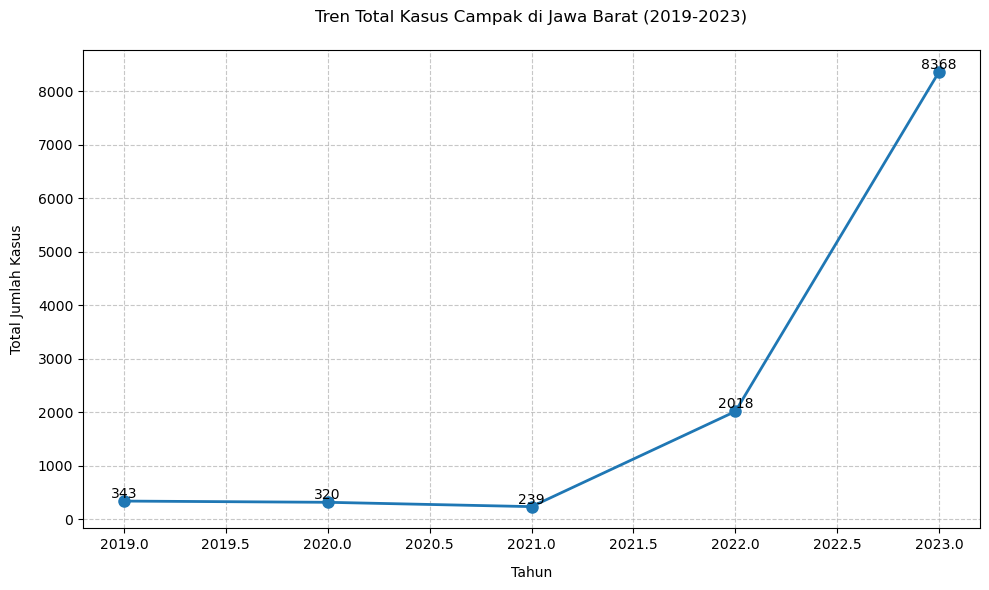


Tren Tahunan:
Jumlah kasus per tahun:
2019: 343 kasus
2020: 320 kasus
2021: 239 kasus
2022: 2018 kasus
2023: 8368 kasus

Persentase perubahan dari tahun sebelumnya:
2020: -6.7%
2021: -25.3%
2022: +744.4%
2023: +314.7%


In [97]:
show_tren_penyakit_jawa_barat_2019_2023('campak')

Hasil analisis kami terhadap grafik tersebut, yaitu:
1. Dari tahun 2020 hingga 2021, jumlah kasus relatif stabil di angka 350 sampai 230 kasus.
2. Pada tahun 2022, jumlah kasus meningkat menjadi 2.018 kasus, yang menunjukkan kenaikan signifikan termasuk di Tahun 2023. Tahun 2023 menunjukkan lonjakan lebih tinggi dengan total 8.368 kasus, yang merupakan jumlah tertinggi dalam lima tahun terakhir.
3. Pada tahun 2021 sempat menunjukkan penurunan kasus dari tahun sebelumnya, sedangkan tahun-tahun setelahnya mengalami kenaikan tajam.
Oleh sebab itu, dari lonjakan kasus di tahun 2022 dan 2023 perlu menjadi perhatian bagi pihak kesehatan. Peningkatan drastis ini bisa disebabkan oleh berkurangnya cakupan imunisasi akibat pandemi COVID-19, bertambahnya orang-orang yang tidak percaya vaksin (anti-vaksin), atau faktor lain seperti laporan pencatatan kasus yang berbeda dari tahun sebelumnya yang memerlukan tindakan lebih lanjut.

Artikel Pendukung : https://kumparan.com/kumparannews/klb-campak-di-jabar-1-943-kasus-ditemukan-sepanjang-2022-1zhRgRy9rM1

Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


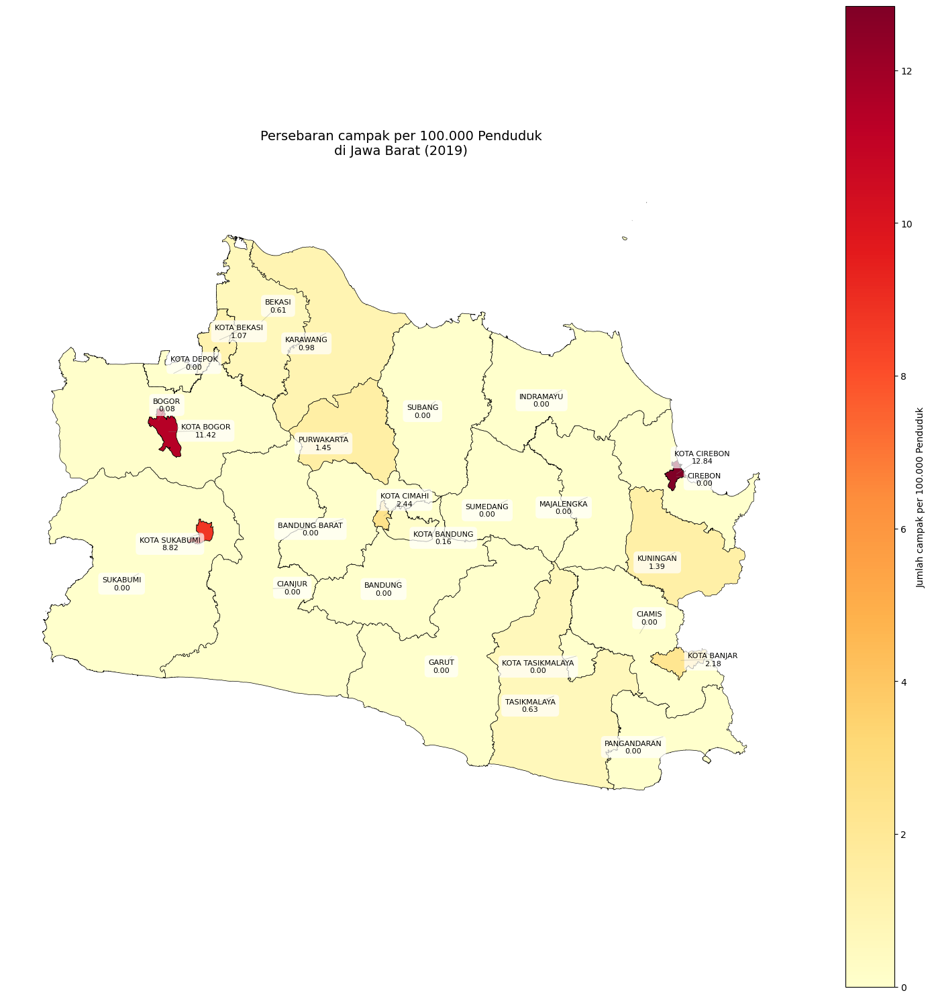

In [98]:
show_map_penyakit('campak', 2019)

Hasil Analisis kami terhadap visualisai tersebut yaitu:
Pada tahun 2019 

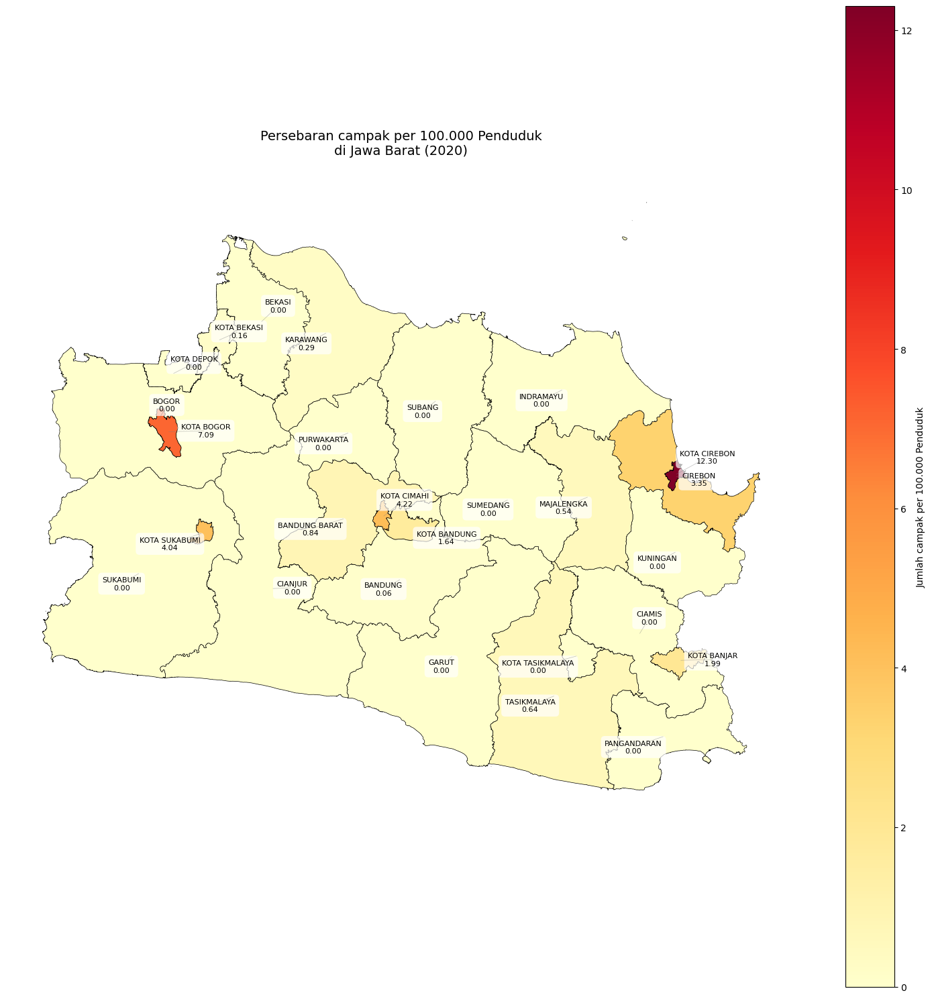

In [99]:
show_map_penyakit('campak', 2020)

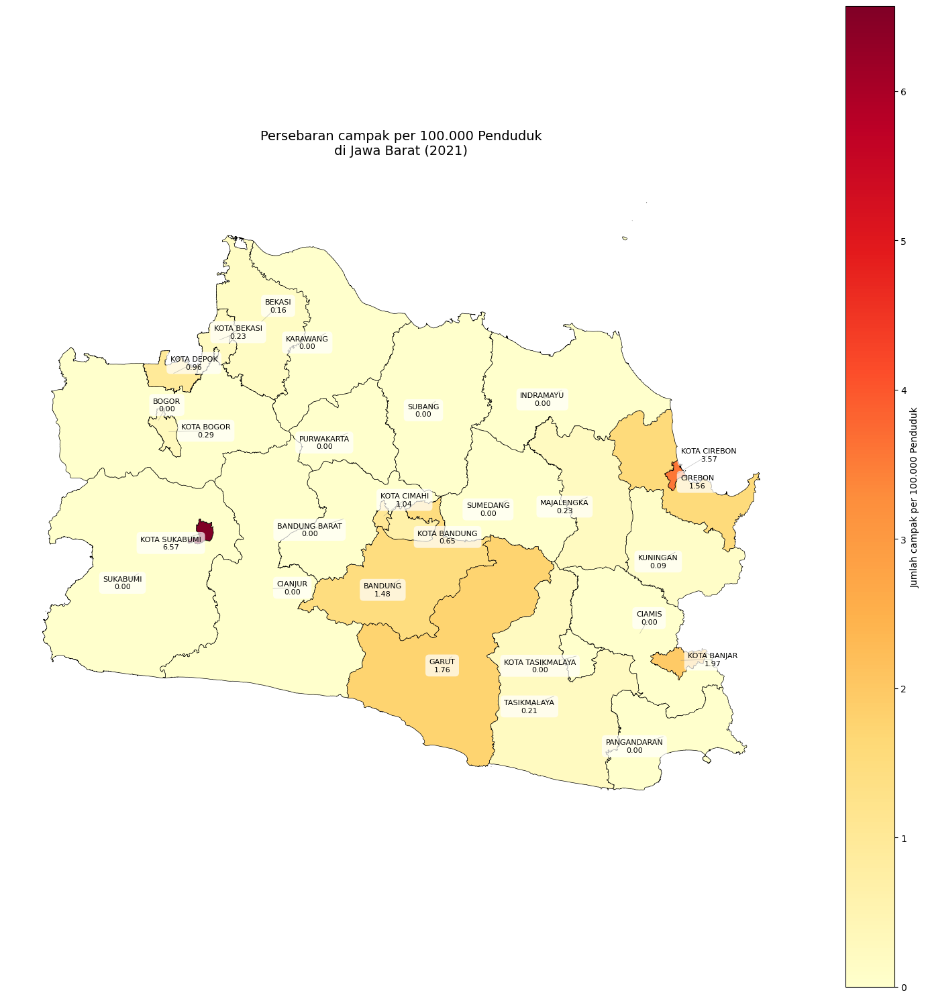

In [100]:
show_map_penyakit('campak', 2021)

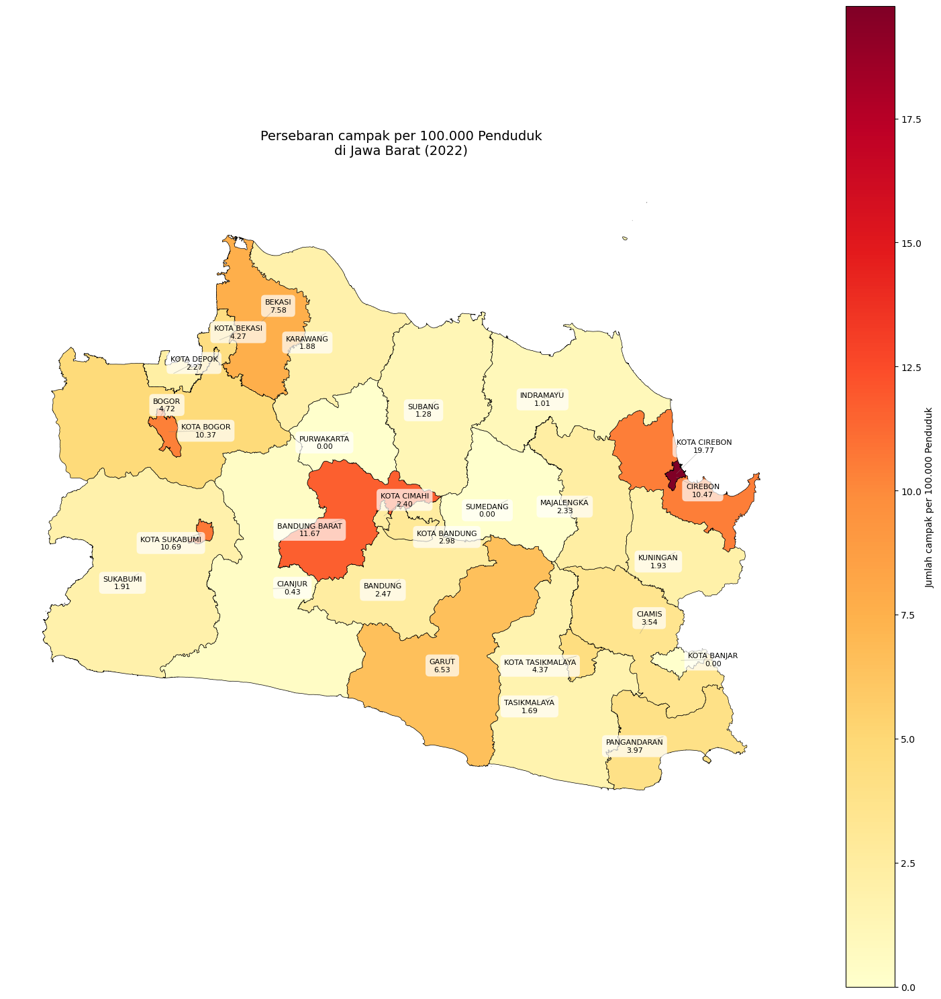

In [101]:
show_map_penyakit('campak', 2022)

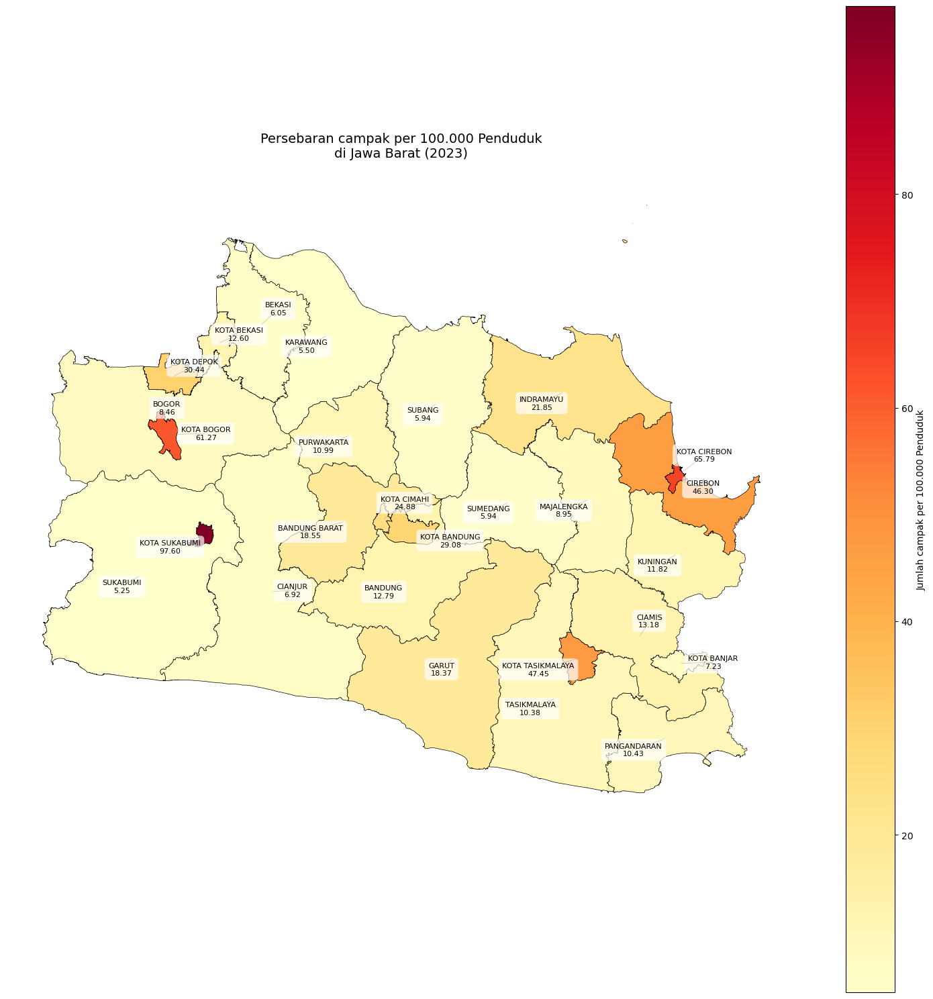

In [102]:
show_map_penyakit('campak', 2023)

Berdasarkan plot tersebut kami mengambil beberapa analisis, yaitu :

1. Daerah-daerah yang berwarna lebih gelap (oranye-merah) menunjukkan tingkat kasus campak yang lebih tinggi per 100.000 penduduk dibandingkan dengan daerah yang berwarna lebih terang (kuning pucat).

2. Terlihat bahwa wilayah di bagian timur Jawa Barat (Kota dan Kabupaten Cirebon) dan Kota Sukabumi memiliki jumlah kasus campak yang tinggi dan stagnan dari tahun 2019-2023 dibanding wilayah lainnya.

3. Mayoritas Kabupaten atau Kota yang bertanda gelap (merah-oranye) dalam plot tersebut, yaitu Kota Sukabumi, Kota Cirebon dan Bogor, memiliki wilayah yang sempit dengan penduduk yang lebih sedikit dibandingkan dengan daerah lainnya sehingga presentase persebaran lebih besar. Selain itu, ada kemungkinan daerah tersebut memang memerlukan perhatian khusus untuk menyadari pentingnya kesehatan dan imunisasi campak.

4. Mayoritas daerah yang stagnan persebaran tinggi adalah perkotaan, ada kemungkinan daerah perkotaan dengan polusi dan imun masyarakatnya lebih rentan terhadap penyakit campak. 
Dari analisis tersebut berarti Kabupaten atau kota dengan warna lebih terang mungkin sudah memiliki cakupan imunisasi yang lebih baik atau lebih sedikit laporan kasus. Plot map ini dapat membantu pemerintah atau dinas kesehatan Jawa Barat untuk melakukan survei lebih lanjut, seperti melihat faktor risiko di daerah tertentu atau meningkatkan kesadaran masyarakat mengenai vaksinasi campak di wilayah dengan angka kasus tinggi sehingga upaya pencegahan lebih terfokus sesuai dengan kebutuhan tiap daerah di Jawa Barat.

#### 2. Pneumonia

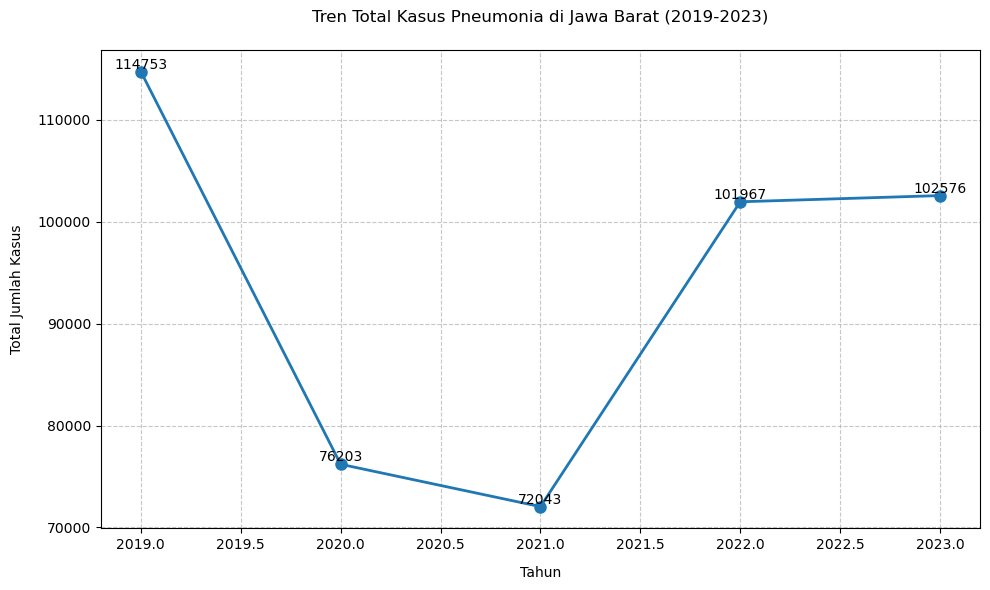


Tren Tahunan:
Jumlah kasus per tahun:
2019: 114753 kasus
2020: 76203 kasus
2021: 72043 kasus
2022: 101967 kasus
2023: 102576 kasus

Persentase perubahan dari tahun sebelumnya:
2020: -33.6%
2021: -5.5%
2022: +41.5%
2023: +0.6%


In [103]:
show_tren_penyakit_jawa_barat_2019_2023('pneumonia')

Berikut analisis terhadap grafik tersebut:

1. Berdasarkan grafik tren total kasus pneumonia di Jawa Barat periode 2019-2023, terlihat adanya fluktuasi yang sangat signifikan. Pada tahun 2019, tercatat angka tertinggi dengan 114.753 kasus, namun kemudian mengalami penurunan drastis hingga mencapai titik terendah di tahun 2021 dengan 72.043 kasus. Setelah itu, terjadi kenaikan tajam kembali pada periode 2022-2023 hingga mencapai 102.576 kasus.

2. Penurunan drastis selama periode pandemi (2020-2021) kemungkinan besar terkait dengan penerapan pembatasan sosial selama pandemi COVID-19, peningkatan kesadaran masyarakat terhadap protokol kesehatan, penggunaan masker yang masif, dan penerapan physical distancing yang ketat di masyarakat.

3. Memasuki periode pasca-pandemi (2022-2023), terjadi kenaikan signifikan yang mungkin disebabkan oleh pelonggaran protokol kesehatan, kembalinya aktivitas normal masyarakat, berkurangnya kebiasaan menggunakan masker, dan peningkatan mobilitas penduduk. Meskipun demikian, data terkini menunjukkan stabilisasi di angka sekitar 102.000 kasus.

4. Menariknya, meski terjadi peningkatan kasus pasca-pandemi, angka ini masih belum kembali ke level pra-pandemi (2019). Hal ini mungkin mengindikasikan bahwa masih ada kesadaran masyarakat terhadap kebersihan dan protokol kesehatan yang tetap bertahan, sebagai warisan positif dari pengalaman selama masa pandemi.

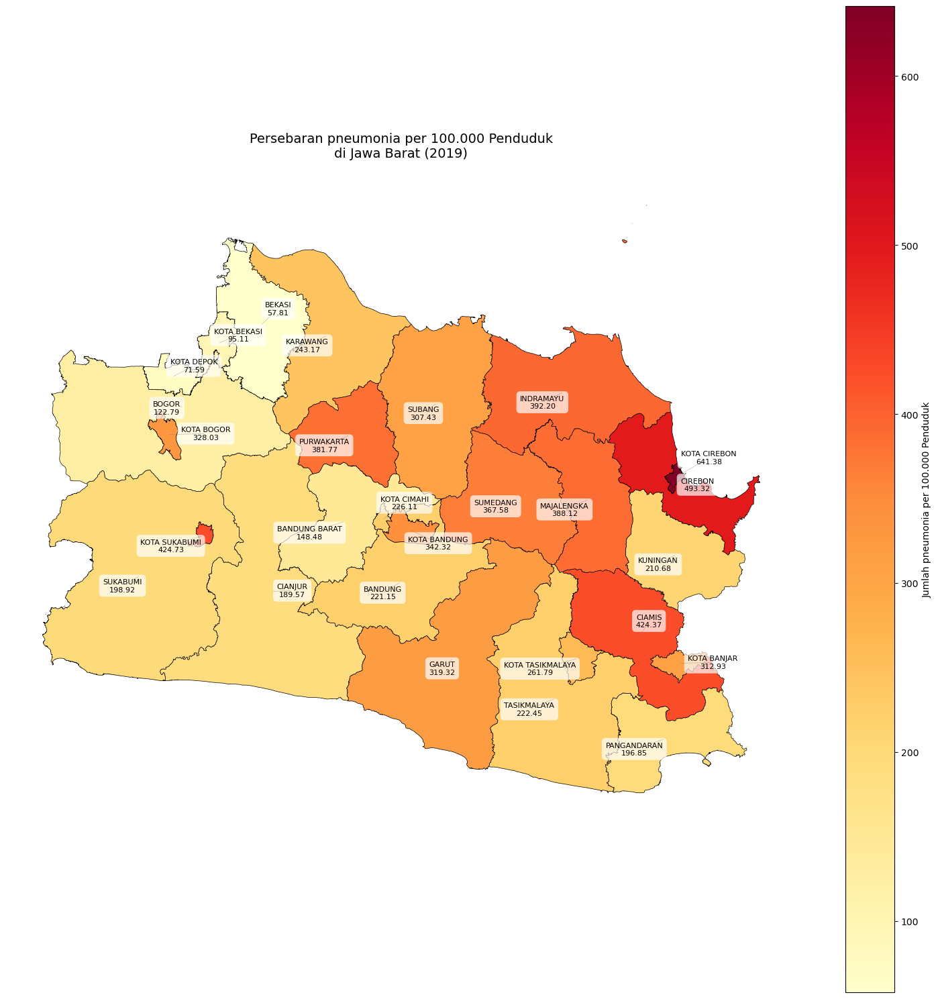

In [104]:
show_map_penyakit('pneumonia',2019)

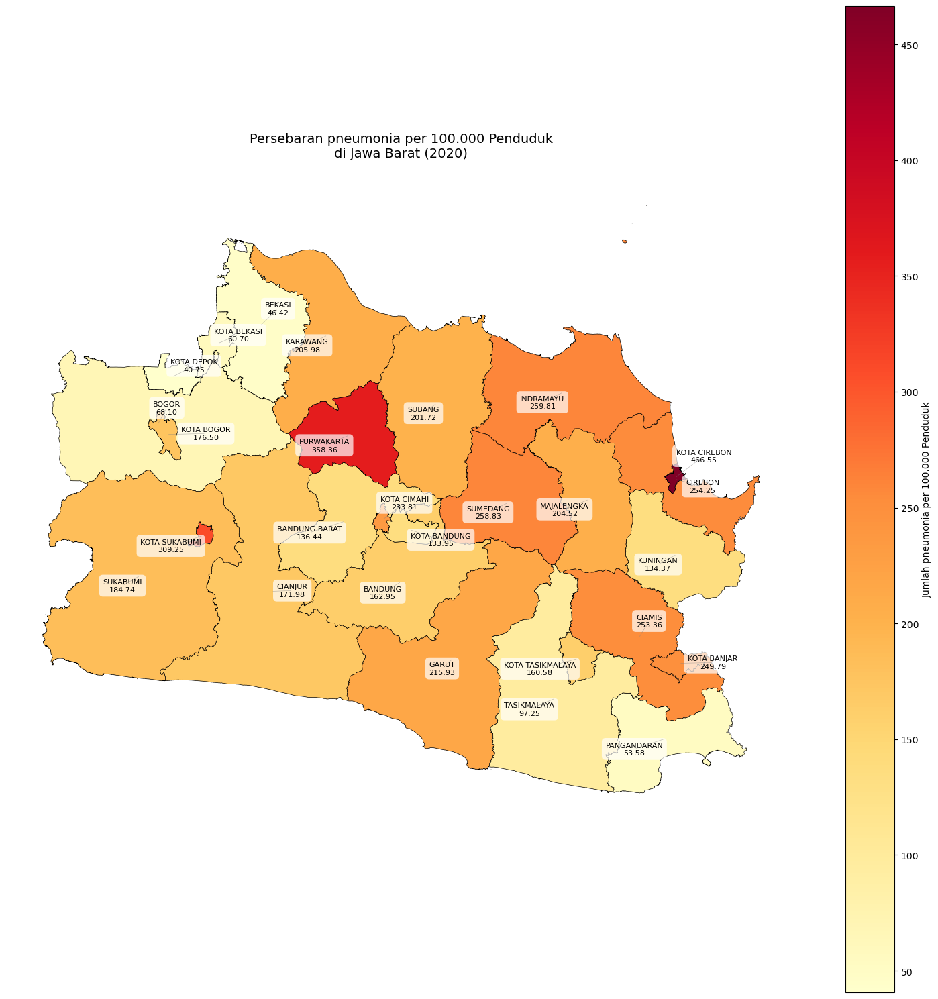

In [105]:
show_map_penyakit('pneumonia',2020)

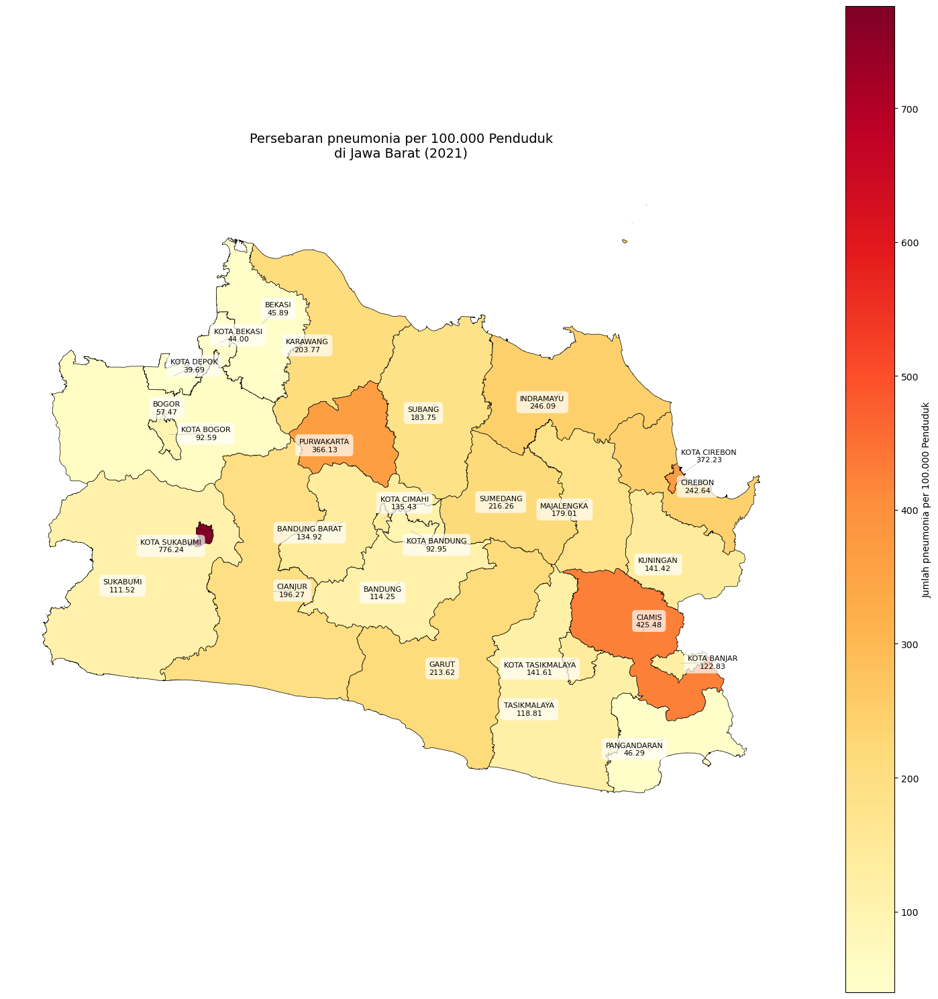

In [106]:
show_map_penyakit('pneumonia',2021)

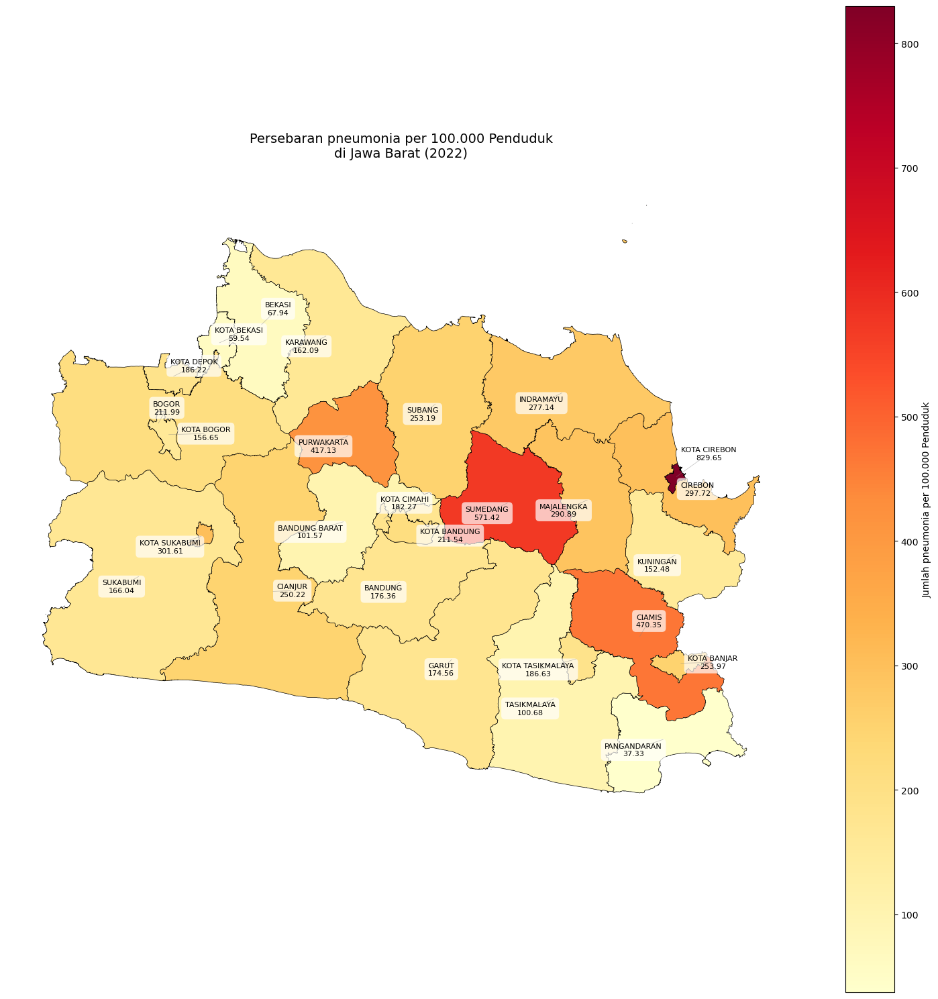

In [107]:
show_map_penyakit('pneumonia',2022)

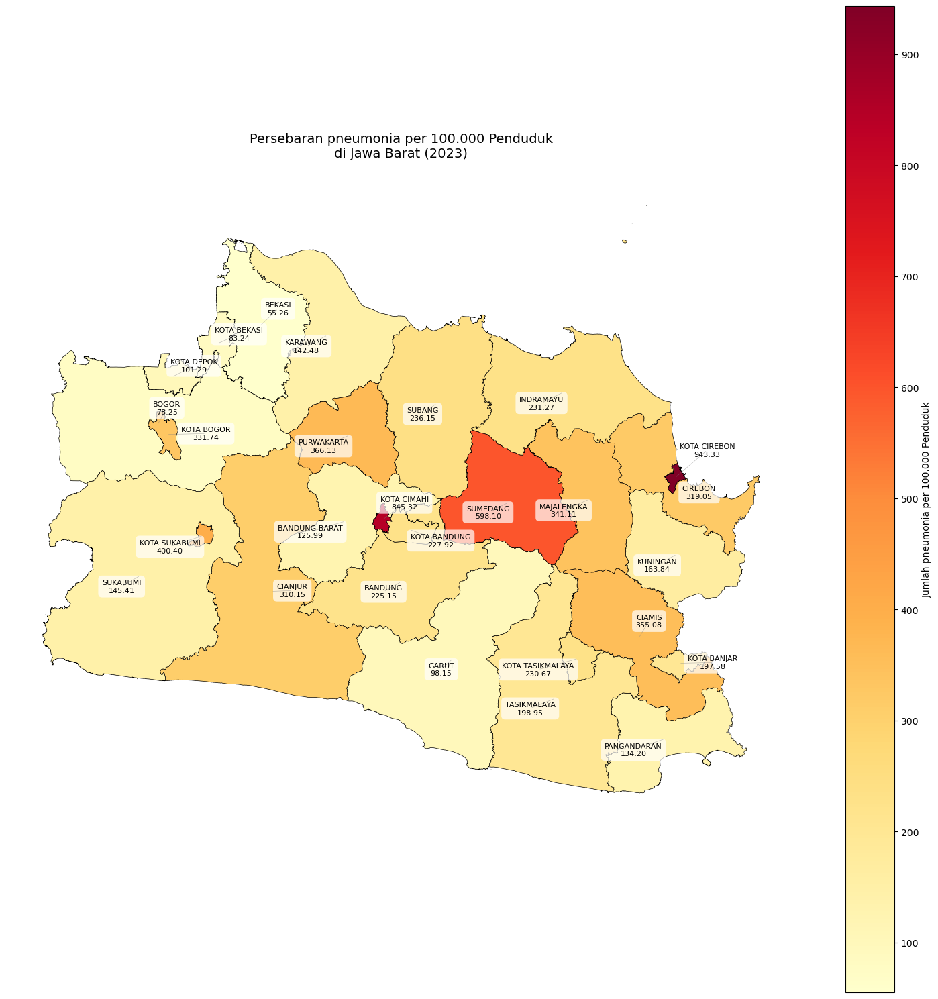

In [108]:
show_map_penyakit('pneumonia',2023)

Berdasarkan plot tersebut kami mengambil beberapa analisis, yaitu :

1. Daerah-daerah yang berwarna lebih gelap (oranye-merah) menunjukkan tingkat kasus pneumonia yang lebih tinggi per 100.000 penduduk dibandingkan dengan daerah yang berwarna lebih terang (kuning pucat).

2. Terlihat bahwa wilayah di bagian timur Jawa Barat (Kota dan Kabupaten Cirebon) dan Kota Sukabumi memiliki jumlah kasus pneumonia yang tinggi dan stagnan dari tahun 2019-2020 dibanding wilayah lainnya. Namun pada tahun 2021 terjadi penurunan kasus dan Kota Suka Bumi yang pada saat itu tercatat kasus pneumonia tertinggi. Namun pada tahun 2022-2023 Kembali kota dan kabupaten Cirebon yang mencatat kasus pneumonia tertinggi.

3. Mayoritas Kabupaten atau Kota yang bertanda gelap (merah-oranye) dalam plot tersebut, yaitu Kota Sukabumi, Kota Cirebon dan Cimahi, memiliki wilayah yang sempit dengan penduduk yang lebih sedikit dibandingkan dengan daerah lainnya sehingga presentase persebaran lebih besar. Selain itu, ada kemungkinan daerah tersebut memang memerlukan perhatian khusus untuk menyadari pentingnya Kesehatan.

4. Mayoritas daerah yang stagnan persebaran tinggi adalah perkotaan, ada kemungkinan daerah perkotaan dengan polusi dan imun masyarakatnya lebih rentan terhadap penyakit pneumonia. 

Dari analisis tersebut berarti Kabupaten atau kota dengan warna lebih terang mungkin sudah memiliki cakupan imunisasi yang lebih baik atau lebih sedikit laporan kasus. Plot map ini dapat membantu pemerintah atau dinas kesehatan Jawa Barat untuk melakukan survei lebih lanjut, seperti melihat faktor risiko di daerah tertentu atau meningkatkan kesadaran masyarakat mengenai vaksinasi pneumonia di wilayah dengan angka kasus tinggi sehingga upaya pencegahan lebih terfokus sesuai dengan kebutuhan tiap daerah di Jawa Barat.


#### 3. Diare

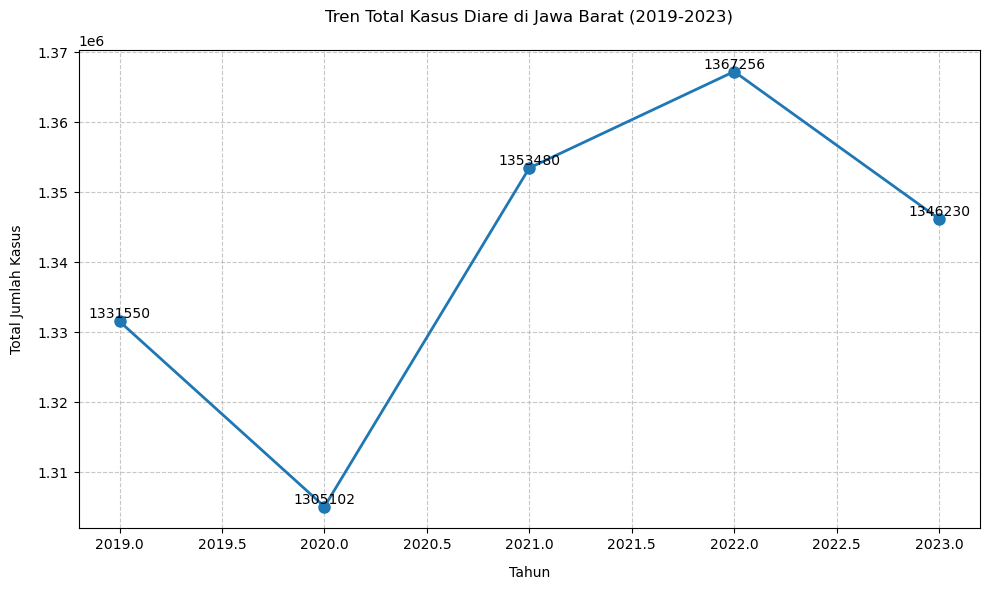


Tren Tahunan:
Jumlah kasus per tahun:
2019: 1331550 kasus
2020: 1305102 kasus
2021: 1353480 kasus
2022: 1367256 kasus
2023: 1346230 kasus

Persentase perubahan dari tahun sebelumnya:
2020: -2.0%
2021: +3.7%
2022: +1.0%
2023: -1.5%


In [109]:
show_tren_penyakit_jawa_barat_2019_2023('diare')


Berikut analisis terhadap grafik tersebut:

1. Kasus diare pada tahun 2019, jumlah kasus tercatat sekitar 1.331.550, kemudian menurun pada tahun 2020 menjadi sekitar 1.305.102. Pada tahun 2021, jumlah kasus kembali meningkat cukup signifikan hingga mencapai 1.353.480, dan puncaknya pada tahun 2022 dengan jumlah kasus tertinggi, yaitu 1.367.256. Namun, pada tahun 2023, jumlah kasus mengalami penurunan menjadi 1.346.230.

2. Peningkatan kasus pada tahun 2021 dan 2022 mungkin dipengaruhi oleh beberapa faktor, seperti kondisi lingkungan, perubahan cuaca, atau peningkatan dalam pelaporan dan pencatatan kasus. Penurunan pada tahun 2020 bisa jadi terkait dengan perubahan perilaku masyarakat yang lebih memperhatikan kebersihan karena pandemi COVID-19, yang bisa menurunkan risiko penularan penyakit seperti diare.

Dari hasil tersebut dapat kita simpulkan meskipun jumlah kasus menurun pada 2023 dibandingkan dengan 2022, angkanya masih cukup tinggi. Hal ini menunjukkan bahwa diare tetap menjadi masalah kesehatan yang perlu perhatian khusus. Dinas kesehatan di Jawa Barat bisa  melakukan intervensi, seperti meningkatkan akses terhadap air bersih, penyuluhan kebersihan, dan edukasi mengenai sanitasi yang lebih baik.

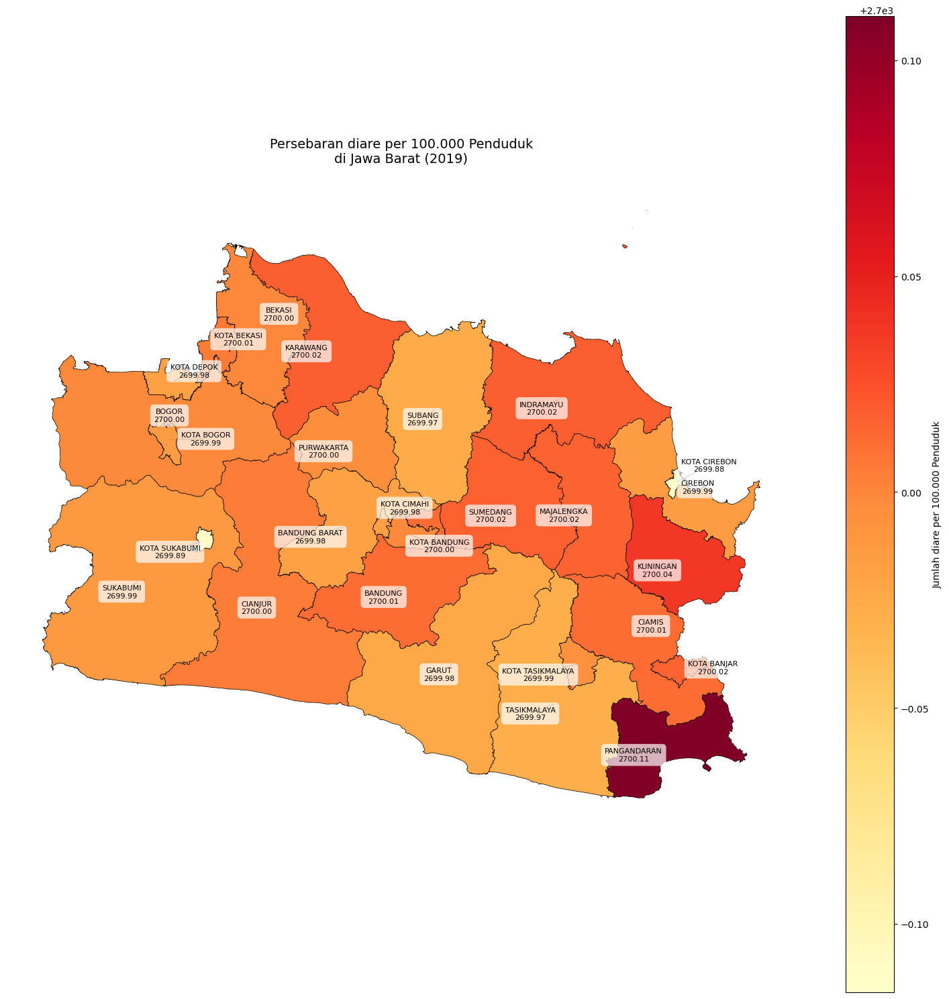

In [110]:
show_map_penyakit('diare',2019)

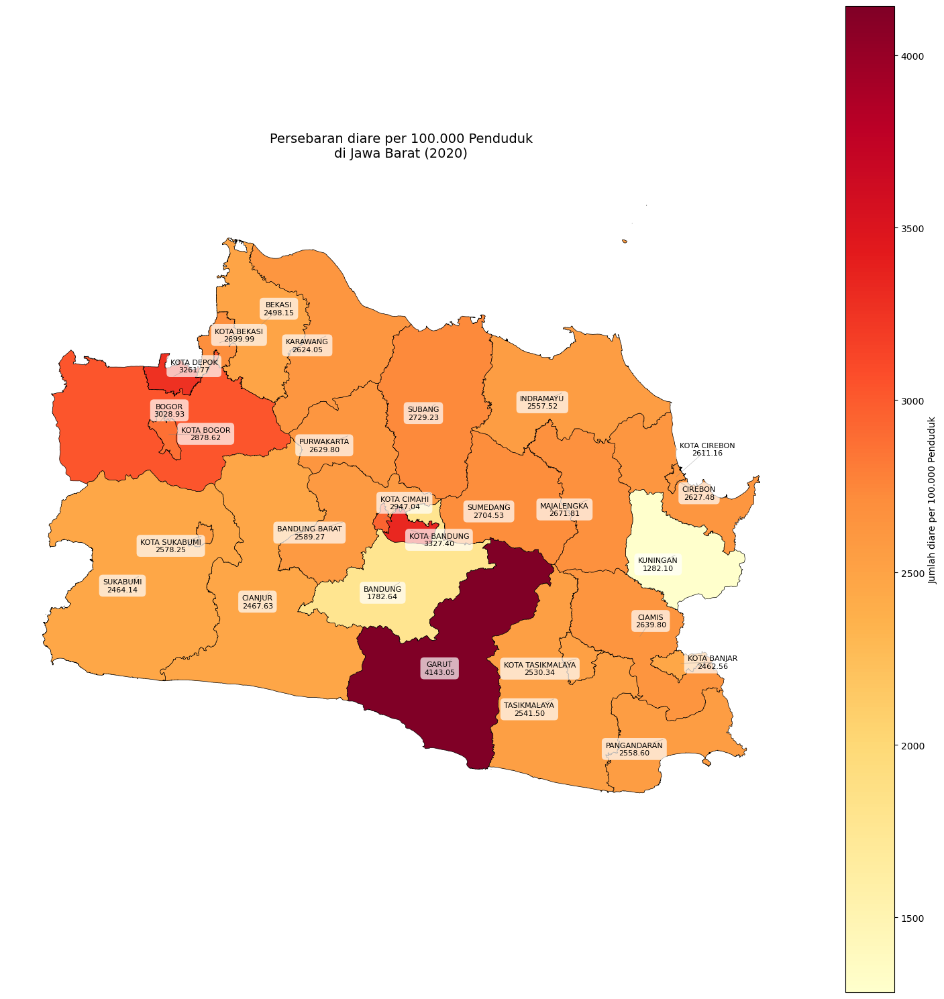

In [111]:
show_map_penyakit('diare',2020)

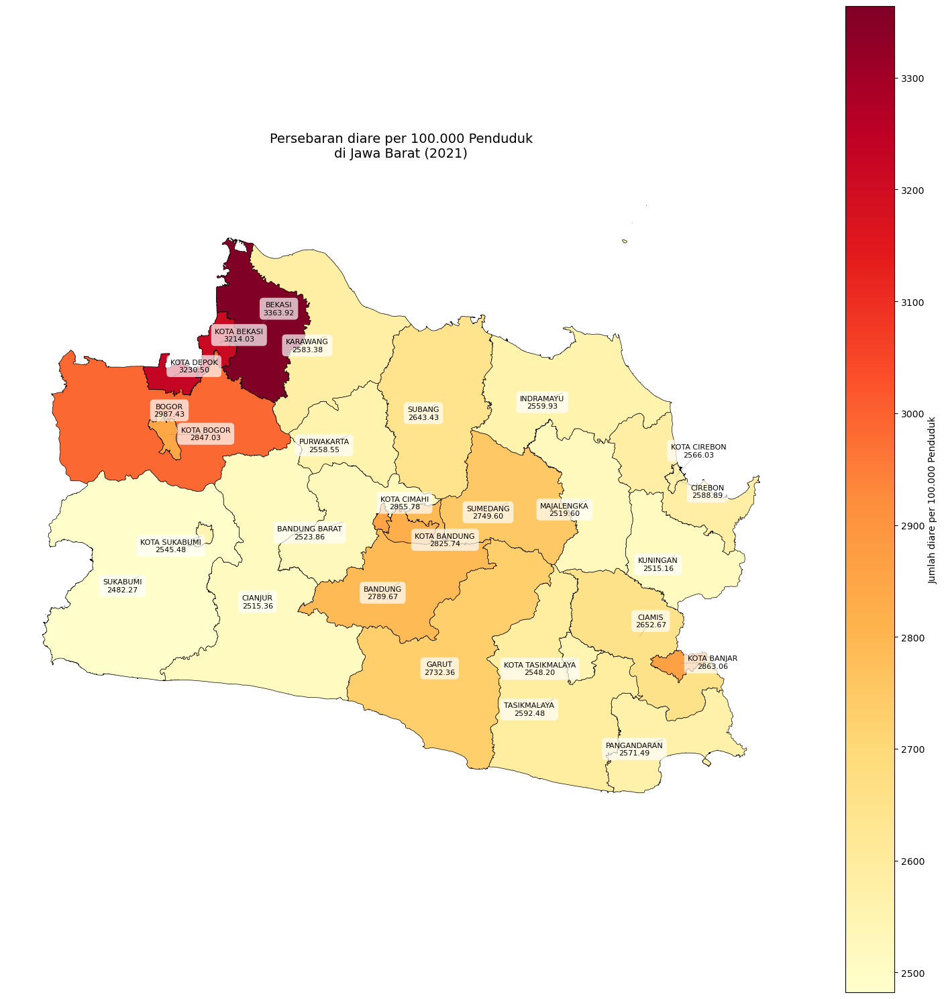

In [112]:
show_map_penyakit('diare',2021)

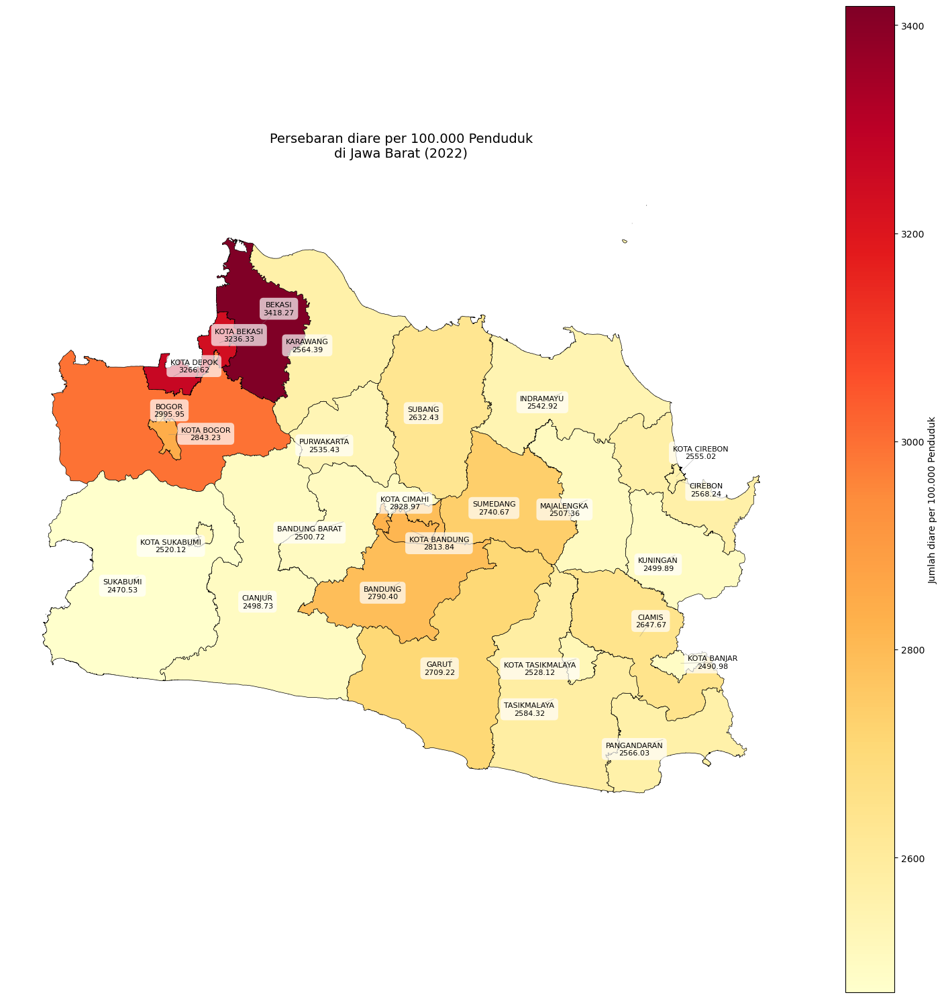

In [113]:
show_map_penyakit('diare',2022)

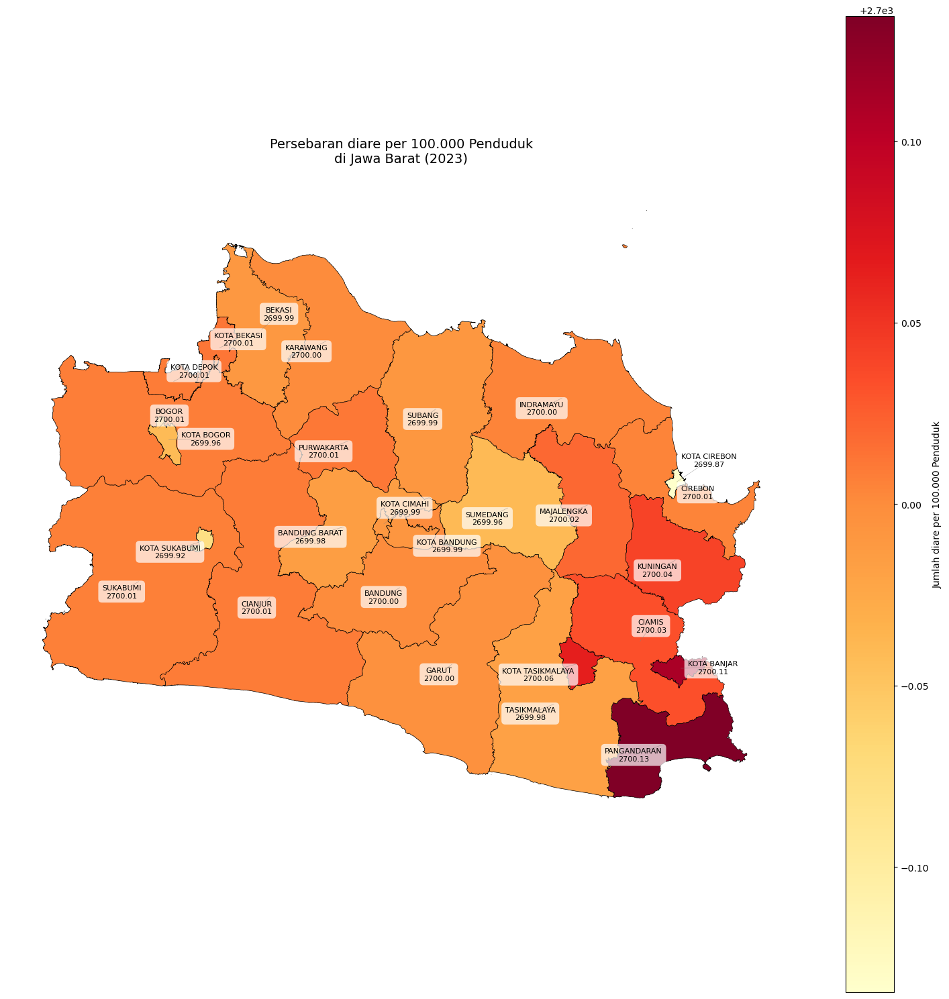

In [114]:
show_map_penyakit('diare',2023)

Berdasarkan plot tersebut kami mengambil beberapa analisis, yaitu :

1. Kuningan dan Pangandaran mengalami fluktuasi yang sama. Ketika tahun 2019 sempat tinggi kemudian turun signifikan dan kembali melonjak di tahun 2023.
2. Garut di tahun 2020 sempat mengalami lonjakan yang signifikan namun tahun setelahnya berangsur turun. Ini berarti kasus per 100.000 orang semakin menurun yang artinya mungkin ada perbaikan kesehatan dan kebersihan yang bagus. 
3. Tahun 2019 dan 2023 mengalami persebaran yang hampir sama yaitu hampir seluruh kabupaten atau kota di Jawa Barat berada di tingkat tinggi. Artinya mungkin ketika masa Pandemi di tahun 2020-2022 masyarakat cukup menjaga kebersihan namun kembali berangsur berkurang kesadarannya akan kebersihan dan kesehatan sehingga naik kembali di tahun 2023.

#### 4. HIV

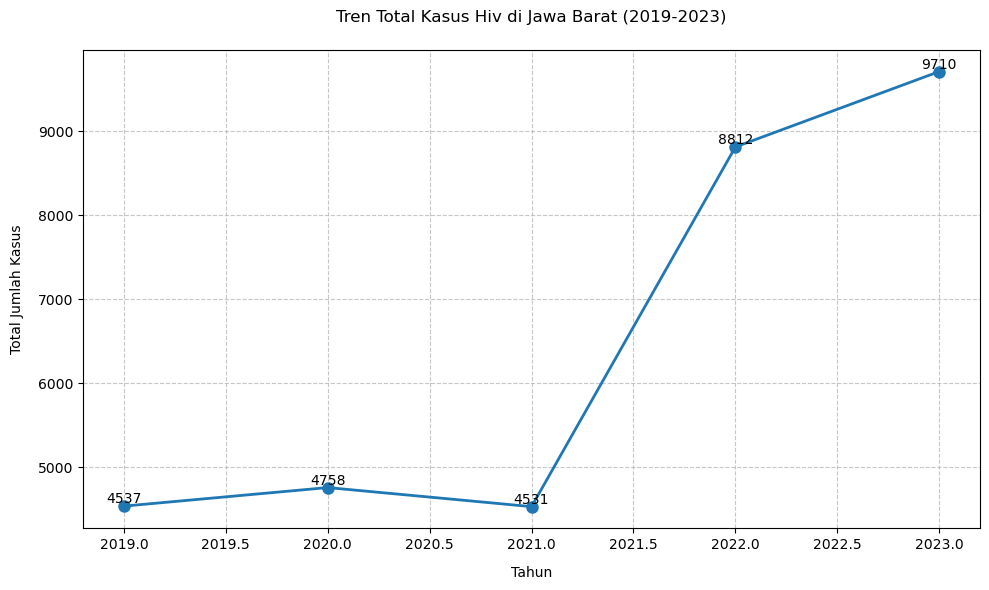


Tren Tahunan:
Jumlah kasus per tahun:
2019: 4537 kasus
2020: 4758 kasus
2021: 4531 kasus
2022: 8812 kasus
2023: 9710 kasus

Persentase perubahan dari tahun sebelumnya:
2020: +4.9%
2021: -4.8%
2022: +94.5%
2023: +10.2%


In [115]:
show_tren_penyakit_jawa_barat_2019_2023('hiv')

Berikut analisis dari grafik tersebut:

1. Berdasarkan grafik tren total kasus HIV di Jawa Barat periode 2019-2023, terlihat pola yang relatif stabil di awal periode namun mengalami lonjakan drastis setelah tahun 2021. Dari tahun 2019 hingga 2021, jumlah kasus berfluktuasi di kisaran 4.500 - 4.760 kasus, dengan perubahan yang tidak terlalu signifikan (peningkatan 4.9% di 2020 dan penurunan 4.8% di 2021).

2. Perubahan yang sangat dramatis terjadi pada tahun 2022, di mana jumlah kasus melonjak tajam sebesar 94.5% menjadi 8.812 kasus dari sebelumnya 4.531 kasus di tahun 2021. Tren kenaikan ini berlanjut di tahun 2023 dengan peningkatan 10.2% mencapai 9.710 kasus, yang merupakan angka tertinggi dalam periode lima tahun tersebut.

3. Lonjakan signifikan pasca-2021 ini mungkin disebabkan oleh beberapa faktor seperti meningkatnya kesadaran untuk melakukan tes HIV, membaiknya sistem pelaporan dan pendataan kasus, serta kemungkinan meningkatnya perilaku berisiko di masyarakat setelah periode pembatasan sosial. Selain itu, peningkatan akses ke layanan kesehatan pasca-pandemi juga mungkin berkontribusi pada terdeteksinya lebih banyak kasus yang sebelumnya tidak teridentifikasi.

4. Fakta bahwa kasus HIV di tahun 2023 mencapai lebih dari dua kali lipat dibandingkan tahun 2019 menunjukkan perlunya penguatan program pencegahan dan pengendalian HIV/AIDS di Jawa Barat, termasuk edukasi masyarakat, peningkatan akses ke layanan testing dan konseling, serta penanganan yang komprehensif bagi penderita HIV.

Artikel Pendukung : https://news.republika.co.id/berita/rullza484/kemenkes-kasus-penularan-hiv-pada-2023-melonjak-didominasi-ibu-rumah-tangga

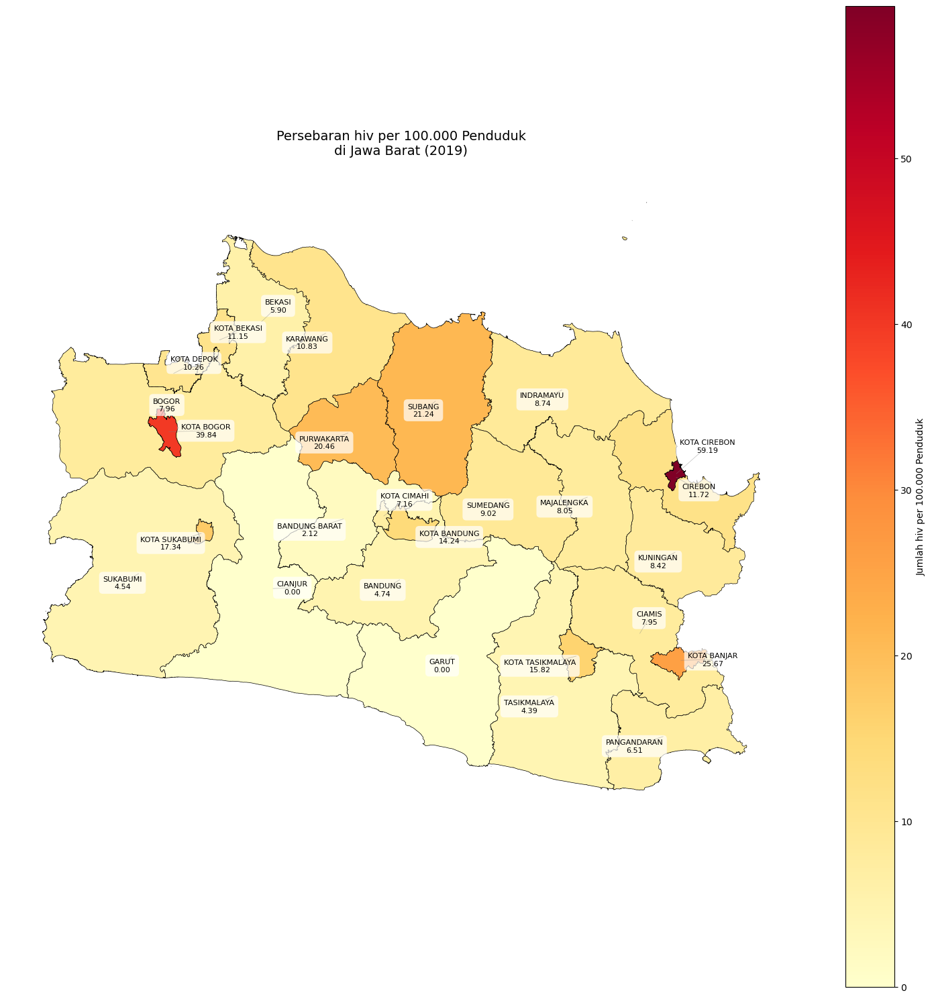

In [116]:
show_map_penyakit('hiv',2019)

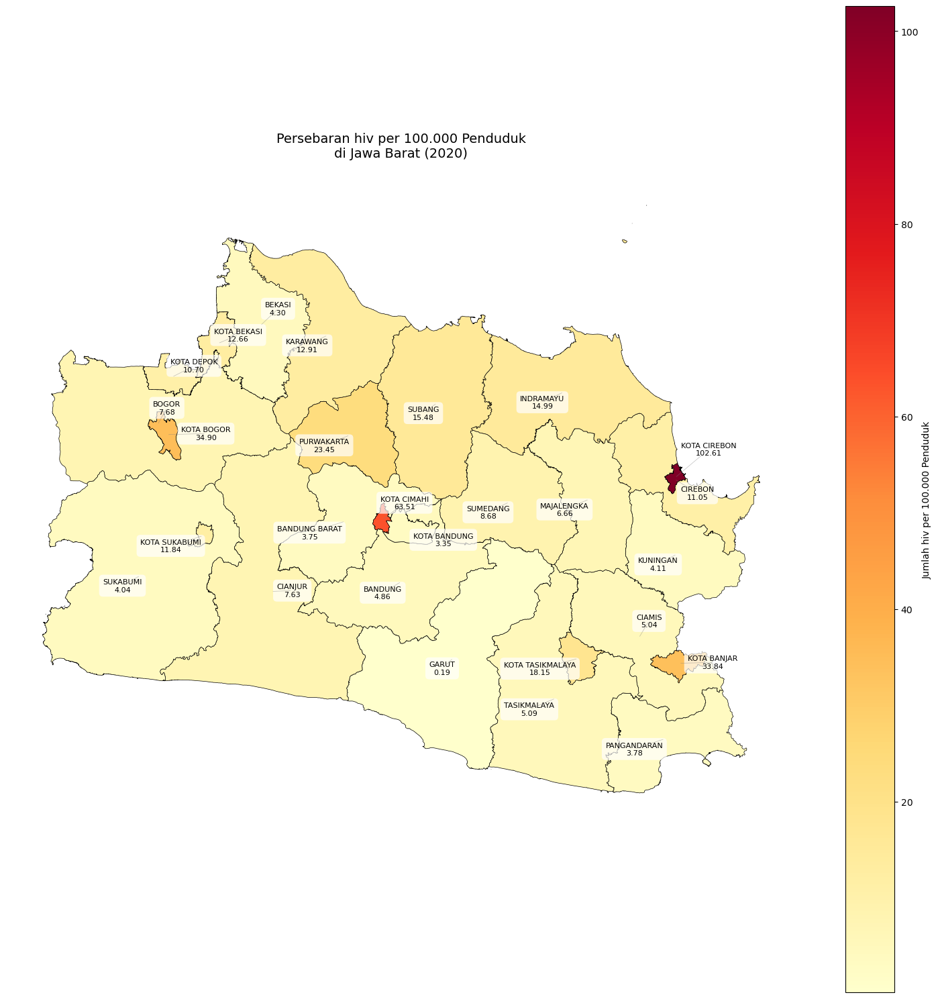

In [117]:
show_map_penyakit('hiv',2020)

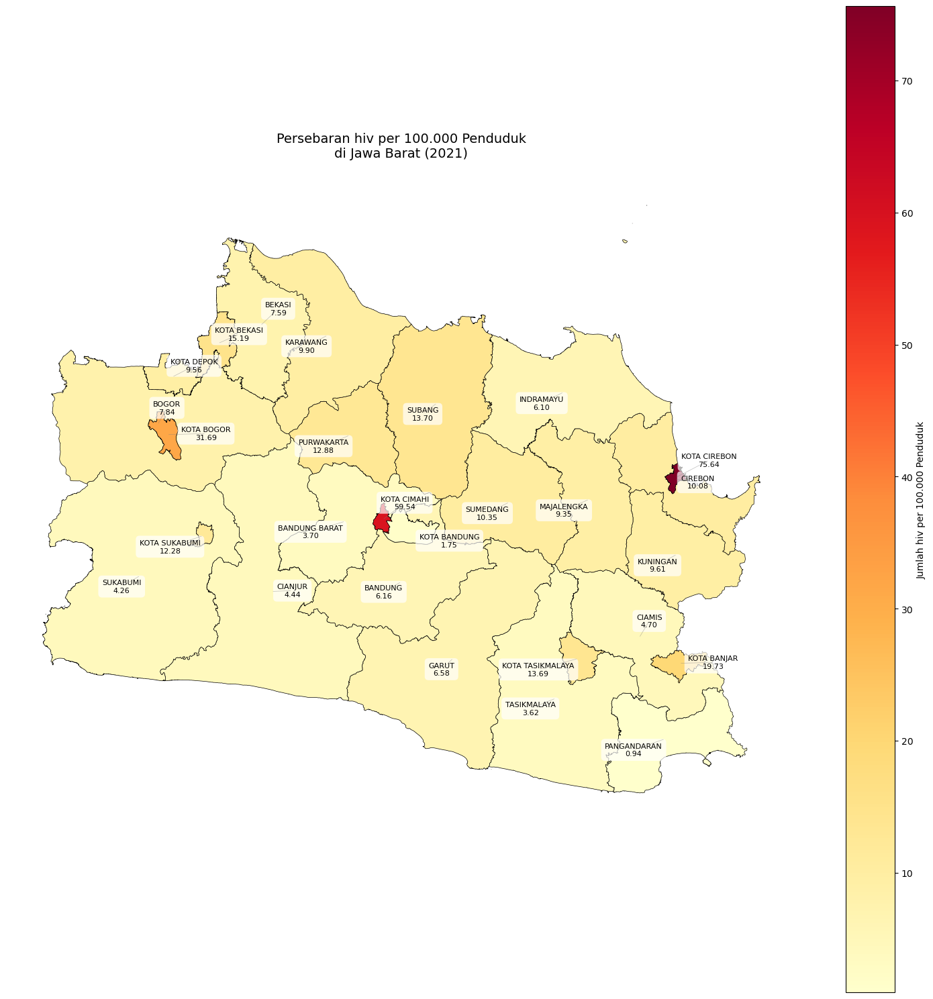

In [118]:
show_map_penyakit('hiv',2021)

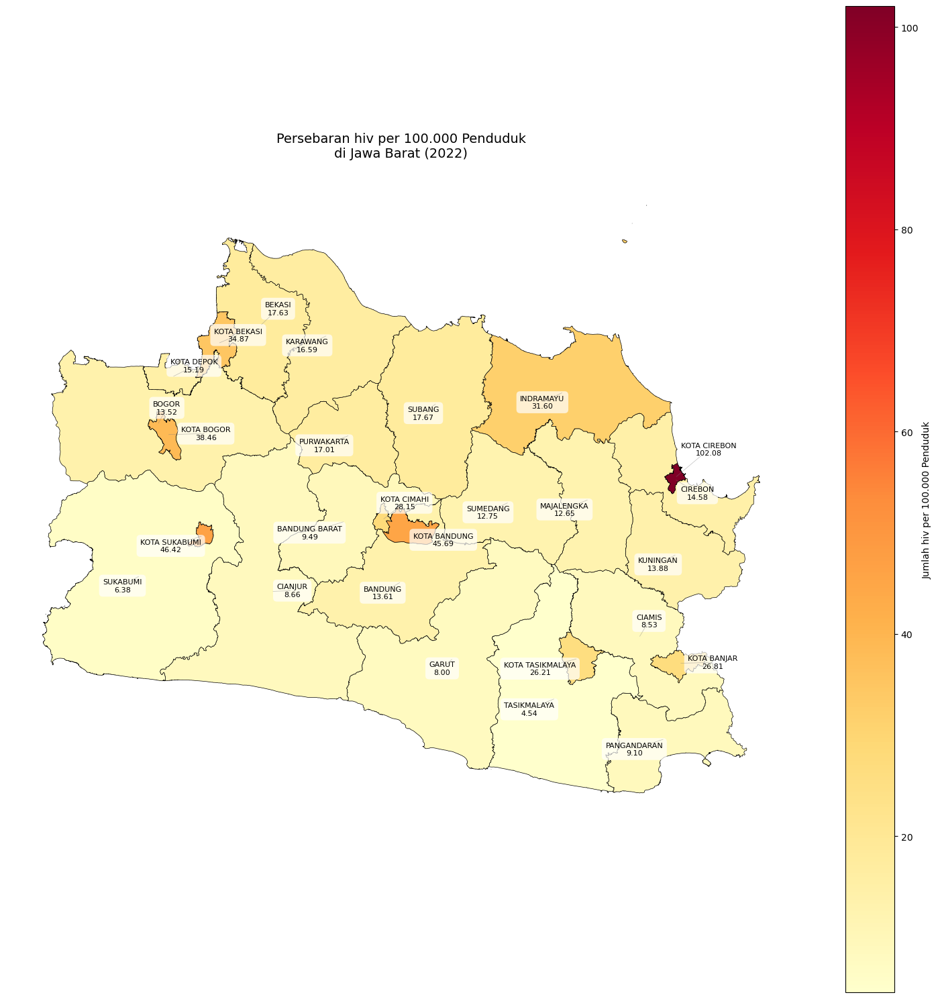

In [119]:
show_map_penyakit('hiv',2022)

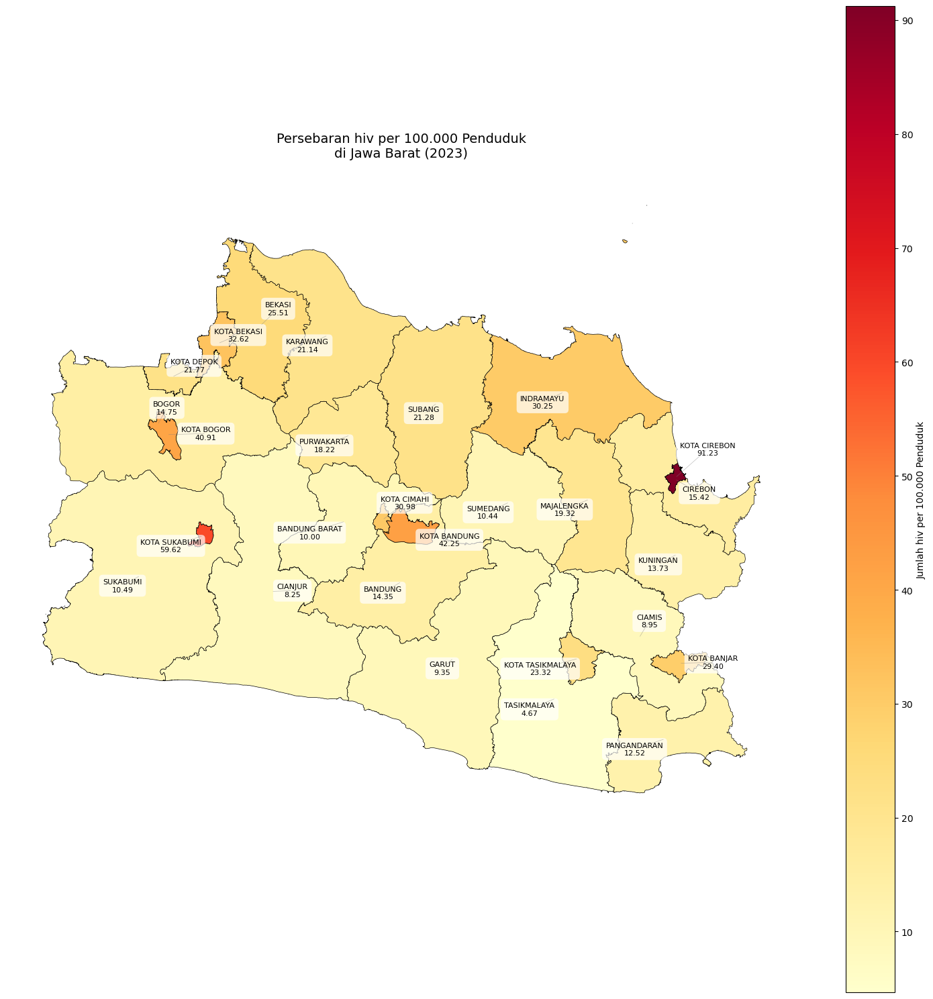

In [120]:
show_map_penyakit('hiv',2023)

Berdasarkan plot tersebut kami mengambil beberapa analisis, yaitu :

1. Kota Cirebon 5 tahun berturut berada di posisi persentase kasus tinggi. Ini mungkin karena tidak ada perubahan jumlah penduduk dan kasus HIV tidak berkurang. Ini mungkin karena belum ada perbaikan layanan kesehatan atau kesadaran masyarakatnya terkait HIV. 
2. Kabupaten Bogor sempat memiliki persentase tinggi di 2019 namun setelahnya stagnan di posisi yang aman. Ini mungkin berarti penanganan HIV yang baik. 
3. Kota Cimahi sempat naik di tahun 2020-2021 yang mana ketika masa pandemi COVID-19 kemudian mengalami penurunan kembali.

#### 5. Demam Berdarah

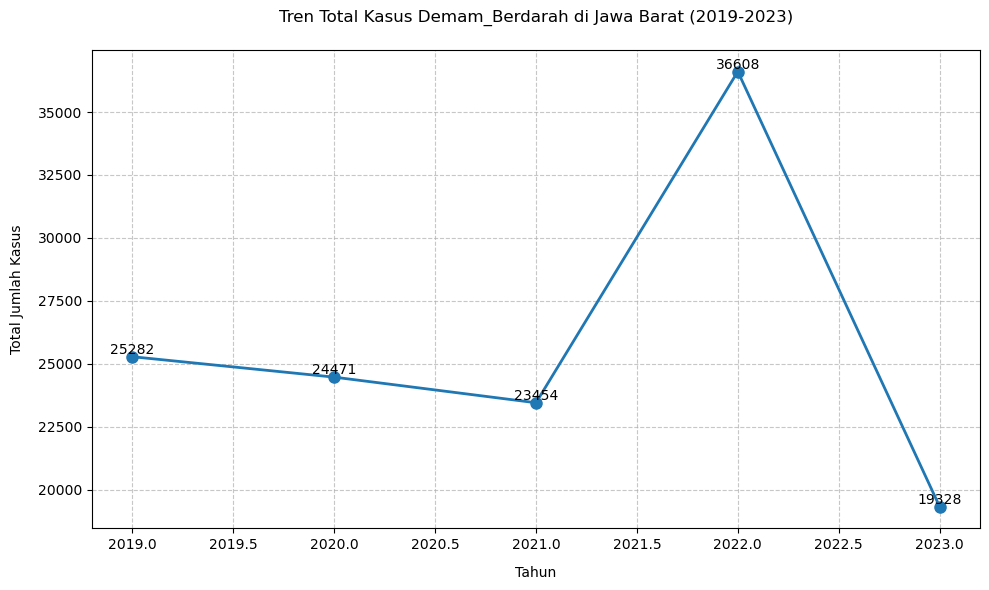


Tren Tahunan:
Jumlah kasus per tahun:
2019: 25282 kasus
2020: 24471 kasus
2021: 23454 kasus
2022: 36608 kasus
2023: 19328 kasus

Persentase perubahan dari tahun sebelumnya:
2020: -3.2%
2021: -4.2%
2022: +56.1%
2023: -47.2%


In [121]:
show_tren_penyakit_jawa_barat_2019_2023('demam_berdarah')

Berikut analisis tren dari grafik tersebut:

1. Total kasus demam berdarah sempat mengalami penurunan dari tahun 2019 ke tahun 2021 namun melonjak secara signifikan di tahun 2022 pasca pandemi COVID-19. 
2. Di tahun 2023 kasus menurun yang artinya sudah ada penanganan yang cekatan dari pemerintah maupun kesadaran masyarakat terhadap kebersihan dan kesehatan sehingga kasus penyakit berkurang.

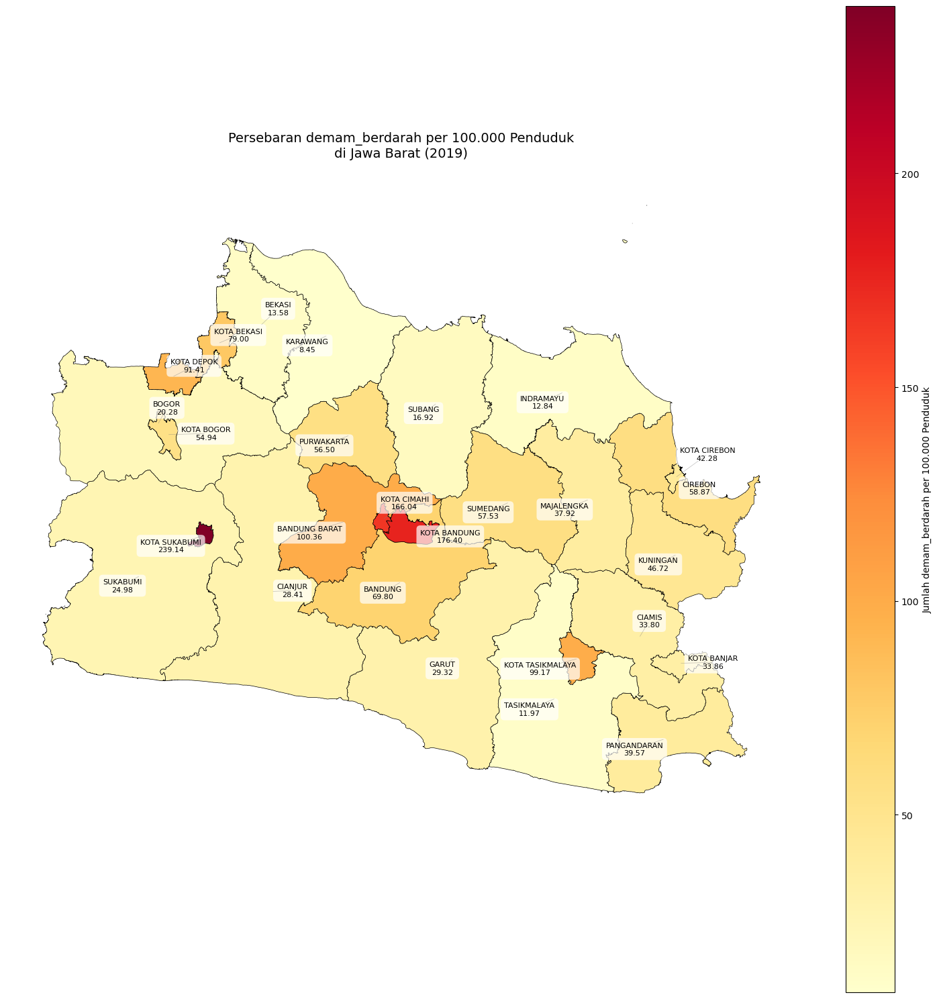

In [122]:
show_map_penyakit('demam_berdarah',2019)

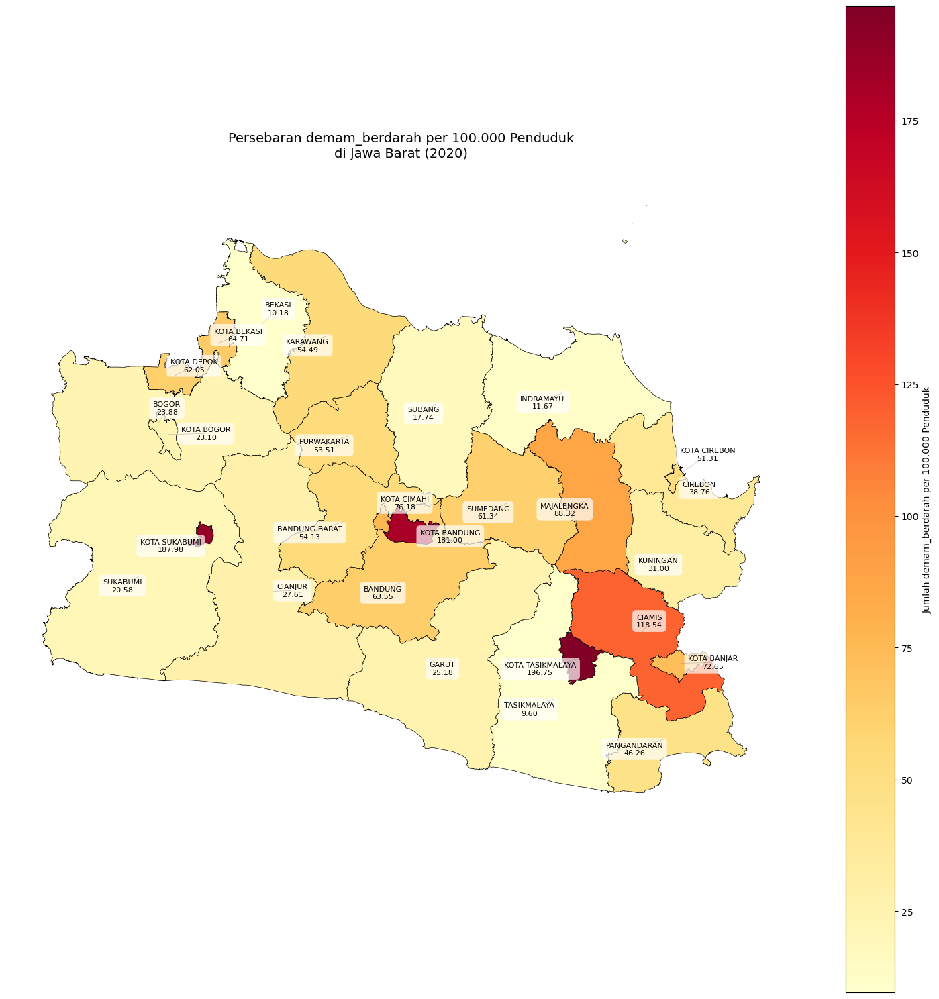

In [123]:
show_map_penyakit('demam_berdarah',2020)

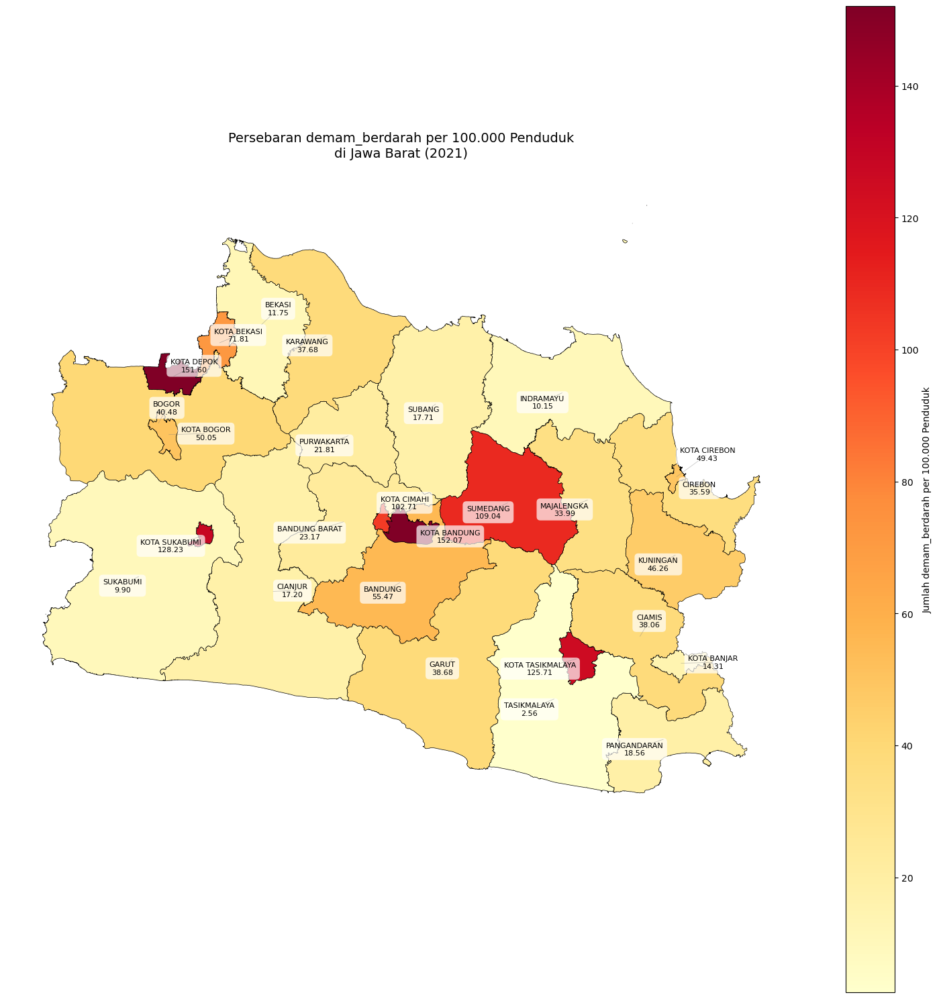

In [124]:
show_map_penyakit('demam_berdarah',2021)

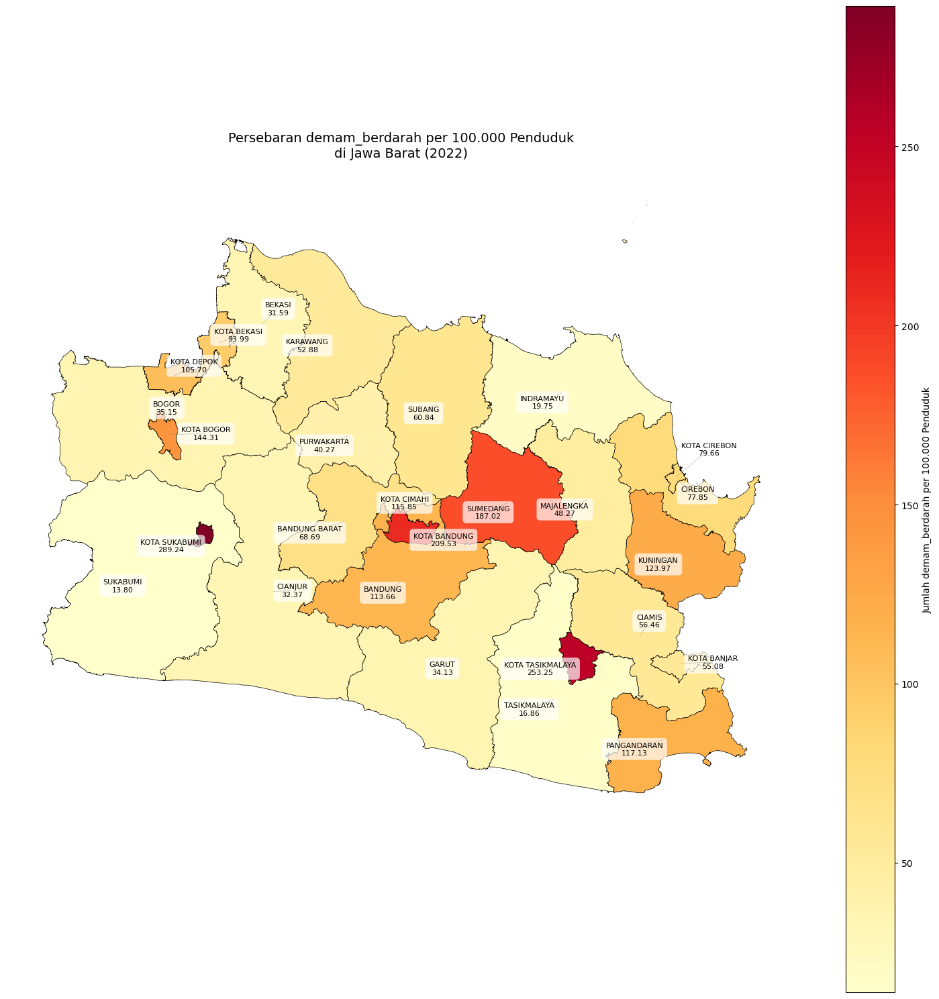

In [125]:
show_map_penyakit('demam_berdarah',2022)

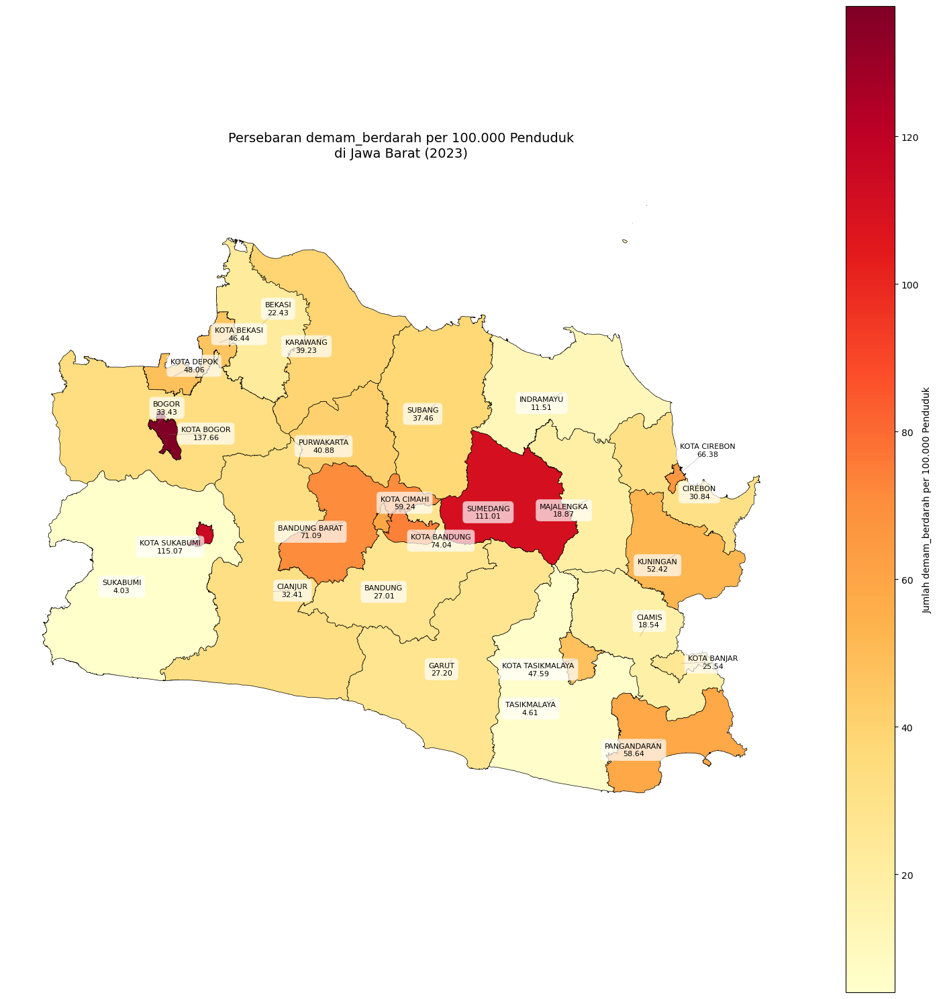

In [126]:
show_map_penyakit('demam_berdarah',2023)

Berdasarkan plot tersebut kami mengambil beberapa analisis, yaitu :

1. Kota Tasikmalaya mengalami kenaikan yang signifikan di tahun 2020 dan terus berada di tingkat tinggi sampai 2023. Sedangkan Kota Sumedang mengalami kenaikan di tahun 2021 dan stagnan sampai tahun 2023. Ini kemungkinan kurangnya kesadaran masyarakat akan kebersihan dan kesehatan. 
2. Kota Depok sempat mengalami kenaikan yang tinggi di tahun 2021 yang mana ketika Pandemi. Sedangkan kota Ciamis mengalami kenaikan yang tinggi di tahun 2020 lalu ada penurunan kembali di tahun setelahnya. 
3. Kota Sukabumi stagnan di persentase tinggi sejak 2019-2023. Ini mungkin karena kesadaran masyarakat yang kurang atau memang jumlah penduduk dan kasusnya tidak ada penurunan sehingga persentase stagnan.

#### 6. Malaria

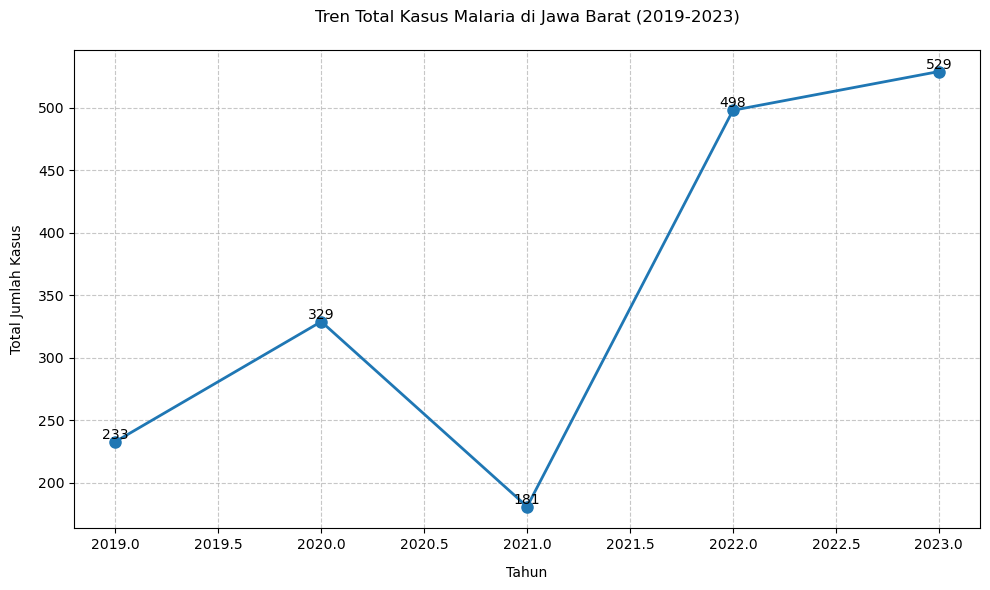


Tren Tahunan:
Jumlah kasus per tahun:
2019: 233 kasus
2020: 329 kasus
2021: 181 kasus
2022: 498 kasus
2023: 529 kasus

Persentase perubahan dari tahun sebelumnya:
2020: +41.2%
2021: -45.0%
2022: +175.1%
2023: +6.2%


In [127]:
show_tren_penyakit_jawa_barat_2019_2023('malaria')

Berikut analisis dari grafik tersebut:

1. Terjadi peningkatan kasus malaria dari 233 kasus pada 2019 menjadi 329 kasus pada 2020. Ini mungkin dipengaruhi oleh kondisi lingkungan atau faktor kesehatan yang belum tertangani secara optimal.
2. Penurunan Signifikan pada 2021: Pada 2021, jumlah kasus malaria turun drastis menjadi 48 kasus. Penurunan besar ini bisa jadi hasil dari kebijakan kesehatan masyarakat yang lebih efektif atau perubahan lingkungan yang menekan penyebaran malaria.
3. Setelah penurunan tajam pada 2021, kasus malaria naik tajam menjadi 508 kasus pada 2022. Kemudian Pada 2023, kasus meningkat sedikit menjadi 539 kasus, atau naik sebesar 6,2% dari tahun 2022. Ini menunjukkan bahwa kasus malaria tetap berada pada tingkat yang tinggi tanpa penurunan signifikan.

Dari analisis tersebut kamis simpulkan penurunan besar di tahun 2021 namun kembali meningkat tajam setelahnya. Kenaikan ini bisa disebabkan oleh adanya kondisi lingkungan yang mendukung penyebaran nyamuk pembawa malaria atau lemahnya program pencegahan. Ini mungkin menjadi indikasi perlunya program pengendalian malaria yang lebih stabil dan berkelanjutan, serta pemantauan terhadap faktor lingkungan yang mempengaruhi persebaran malaria di wilayah tersebut.

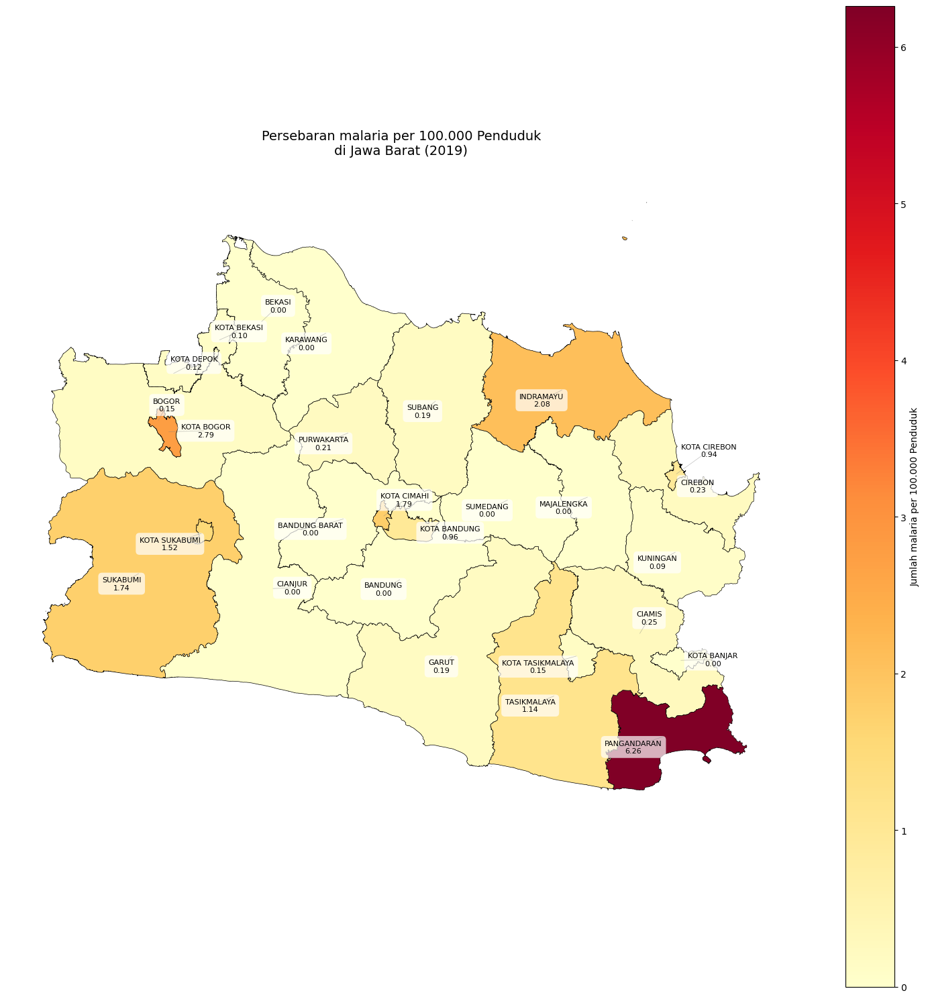

In [128]:
show_map_penyakit('malaria',2019)

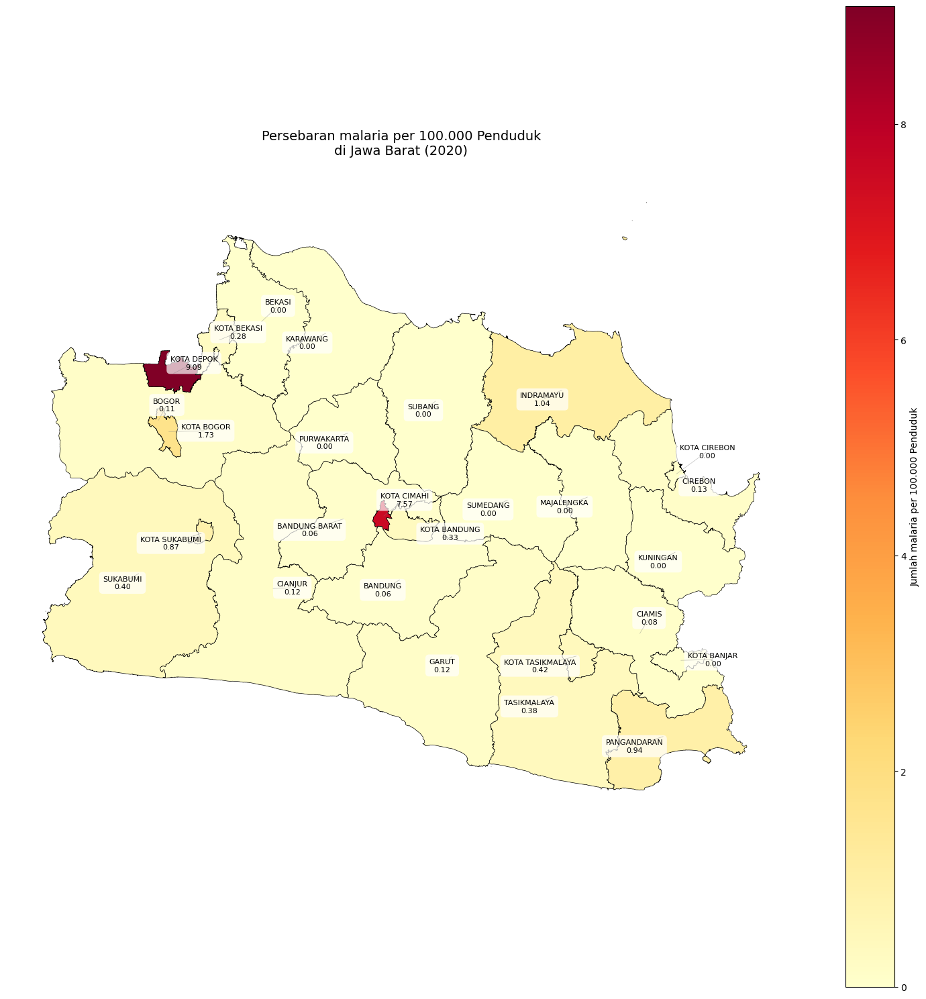

In [129]:
show_map_penyakit('malaria',2020)

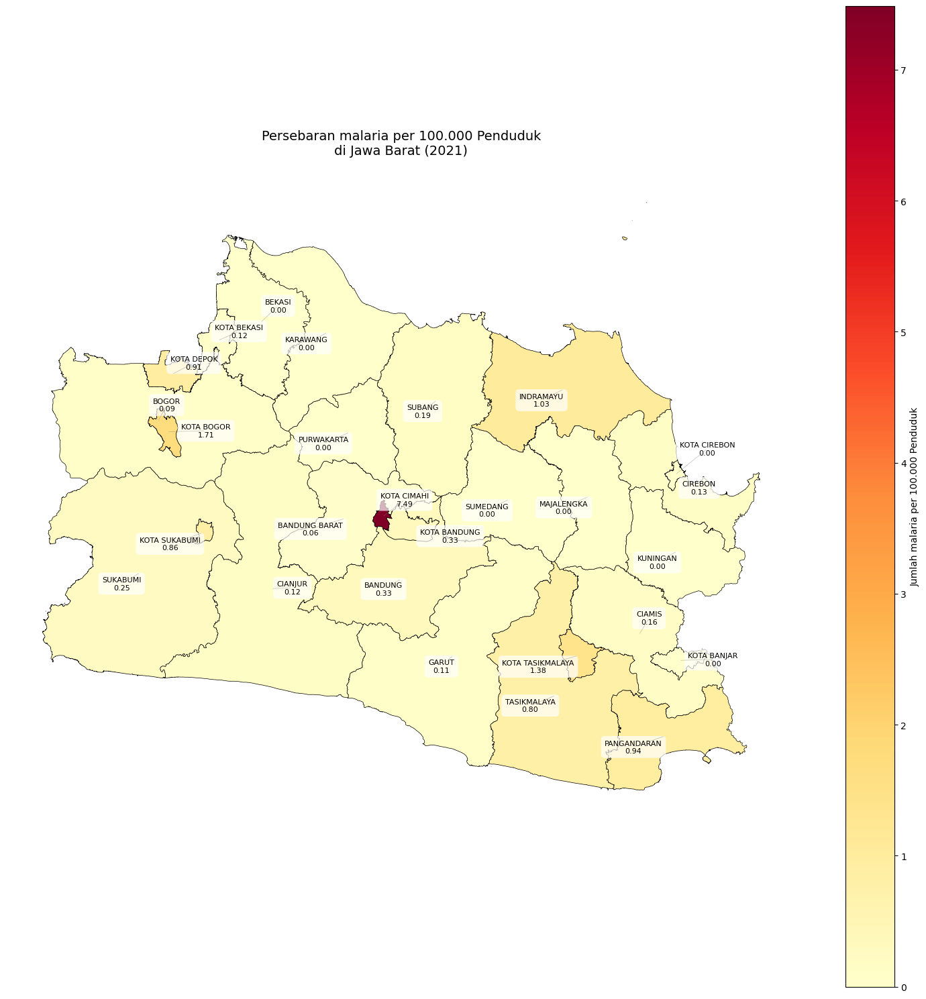

In [130]:
show_map_penyakit('malaria',2021)

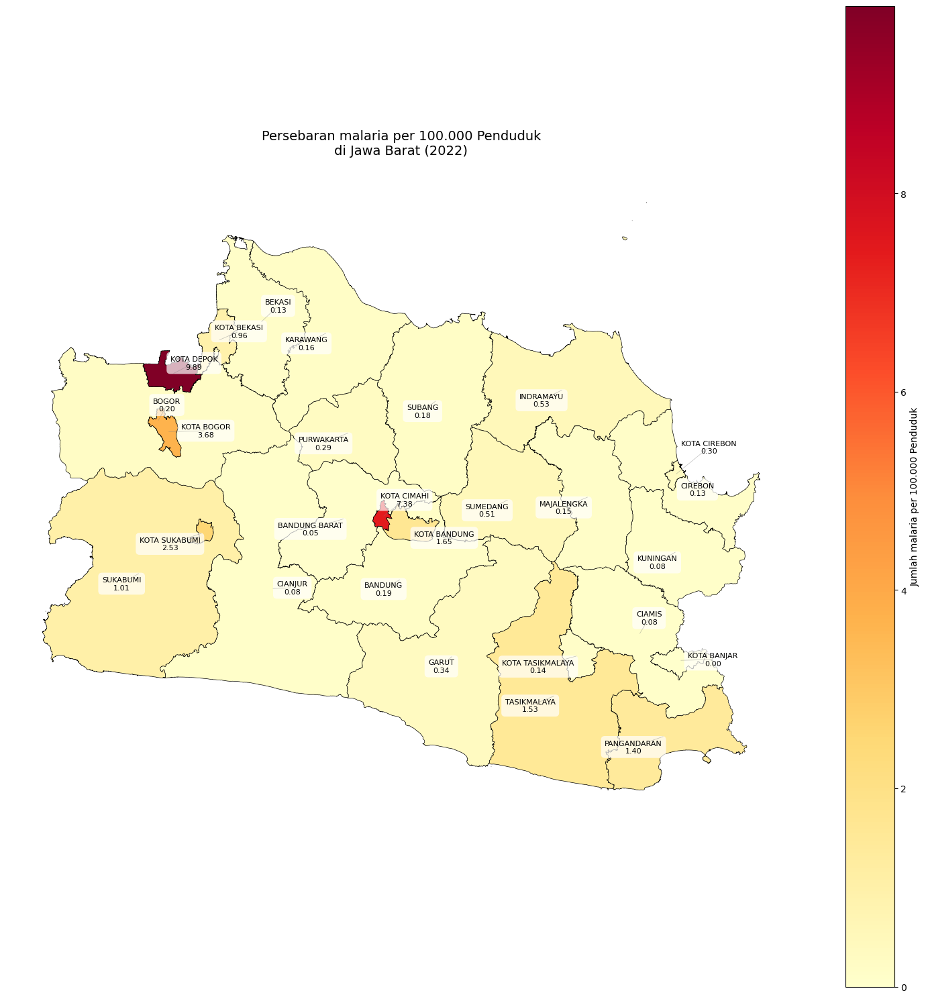

In [131]:
show_map_penyakit('malaria',2022)

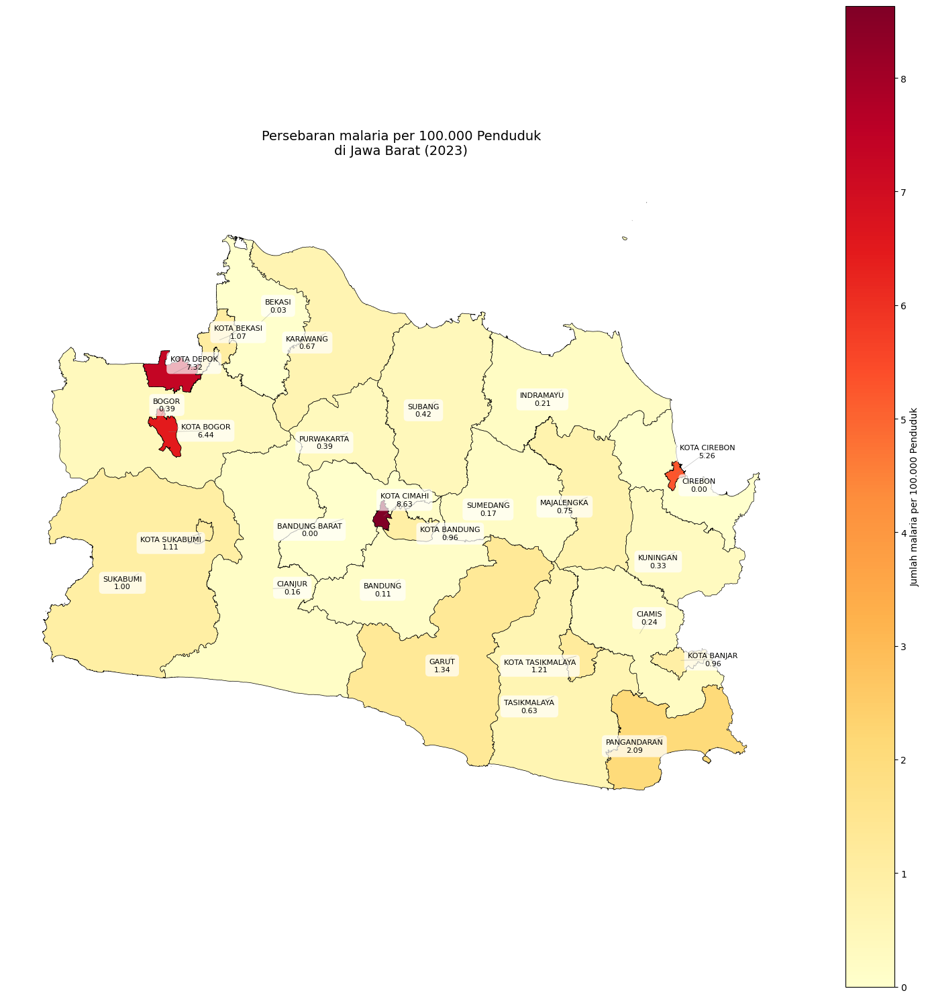

In [132]:
show_map_penyakit('malaria',2023)

Dari hasil plot map tersebut dapat kita ambil analisis :
1. Kabupaten Pangandaran mengalami lonjakan di tahun 2019 dan langsung mengalami penurunan signifikan di tahun setelahnya. Daat kita katakan evaluasi peningkatan kesehatan di daerah ini berhasil. 
2. Kota Cimahi sejak 2020-2023 stagnan di persentase tinggi. Kemudian Kabupaten Bogor juga stagnan dari 2019-2023. Ini berarti mungkin tidak ada perbaikan layanan kesehatan atau evaluasi kesehatan masyarakat 
3. Kota Depok sempat mengalami penurunan di tahun 2021. Ini mungkin ketika masa pasca pandemi yang berpengaruh ke gaya hidup. Namun, tahun setelahnya mengalami lonjakan lagi.

#### 7. Diabetes

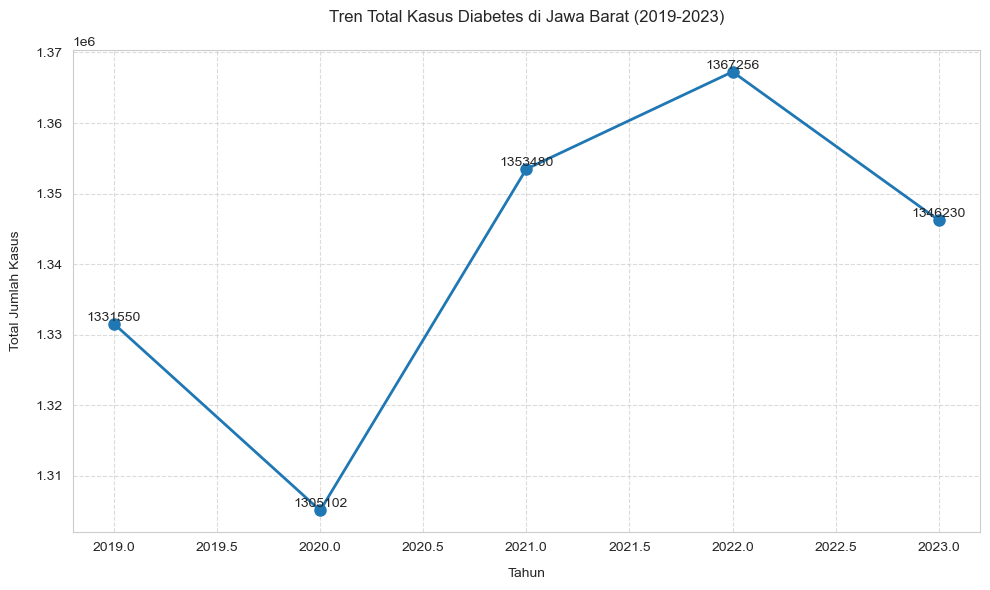


Tren Tahunan:
Jumlah kasus per tahun:
2019: 1331550 kasus
2020: 1305102 kasus
2021: 1353480 kasus
2022: 1367256 kasus
2023: 1346230 kasus

Persentase perubahan dari tahun sebelumnya:
2020: -2.0%
2021: +3.7%
2022: +1.0%
2023: -1.5%


In [158]:
show_tren_penyakit_jawa_barat_2019_2023('diabetes')

Analisis tren:

1. Terjadi peningkatan kasus malaria dari 233 kasus pada 2019 menjadi 329 kasus pada 2020. Ini mungkin dipengaruhi oleh kondisi lingkungan atau faktor kesehatan yang belum tertangani secara optimal.
2. Penurunan Signifikan pada 2021: Pada 2021, jumlah kasus malaria turun drastis menjadi 48 kasus. Penurunan besar ini bisa jadi hasil dari kebijakan kesehatan masyarakat yang lebih efektif atau perubahan lingkungan yang menekan penyebaran malaria.
3. Setelah penurunan tajam pada 2021, kasus malaria naik tajam menjadi 508 kasus pada 2022. Kemudian Pada 2023, kasus meningkat sedikit menjadi 539 kasus, atau naik sebesar 6,2% dari tahun 2022. Ini menunjukkan bahwa kasus malaria tetap berada pada tingkat yang tinggi tanpa penurunan signifikan.

Dari analisis tersebut kamis simpulkan penurunan besar di tahun 2021 namun kembali meningkat tajam setelahnya. Kenaikan ini bisa disebabkan oleh adanya kondisi lingkungan yang mendukung penyebaran nyamuk pembawa malaria atau lemahnya program pencegahan. Ini mungkin menjadi indikasi perlunya program pengendalian malaria yang lebih stabil dan berkelanjutan, serta pemantauan terhadap faktor lingkungan yang mempengaruhi persebaran malaria di wilayah tersebut.

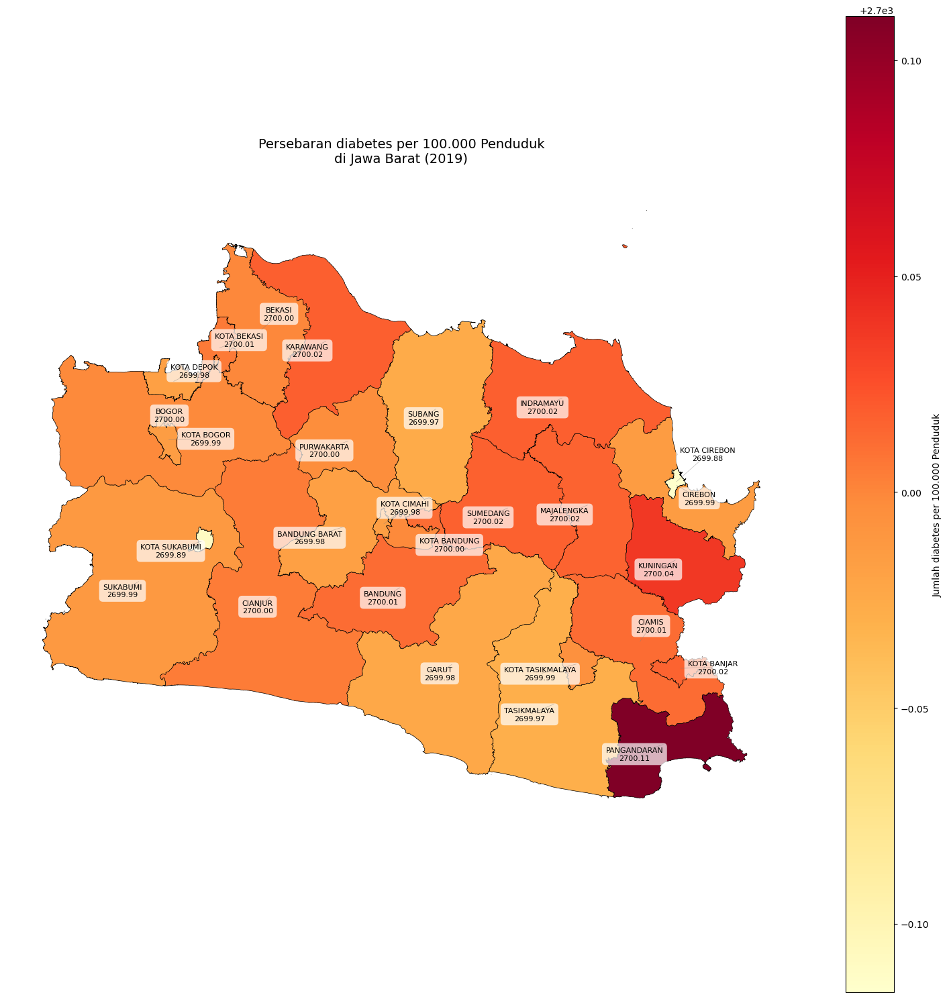

In [134]:
show_map_penyakit('diabetes',2019)

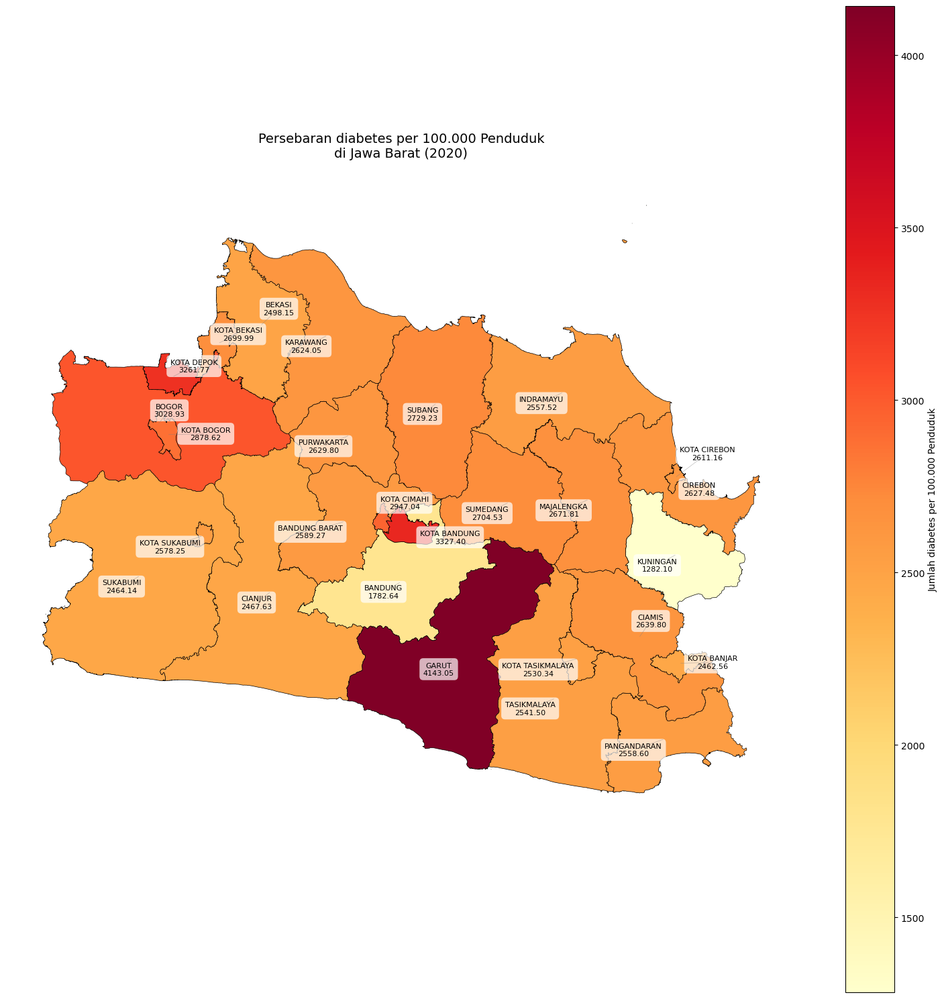

In [135]:
show_map_penyakit('diabetes',2020)

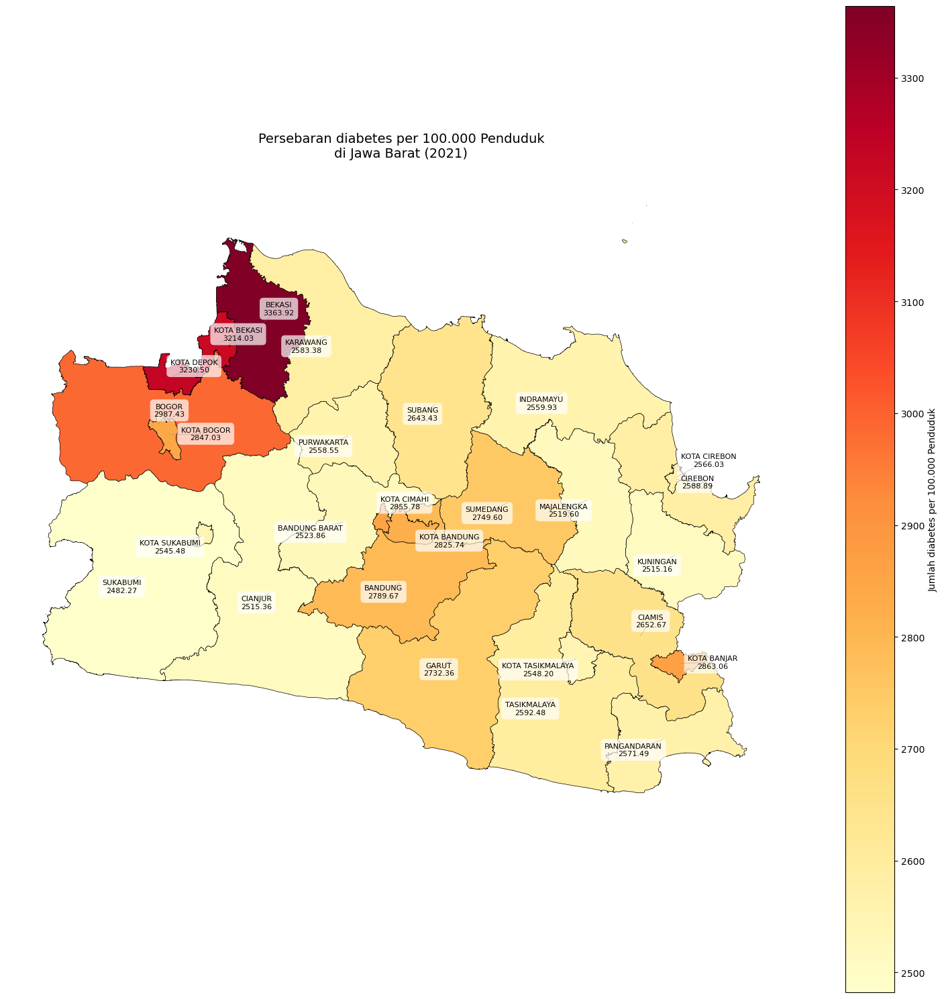

In [136]:
show_map_penyakit('diabetes',2021)

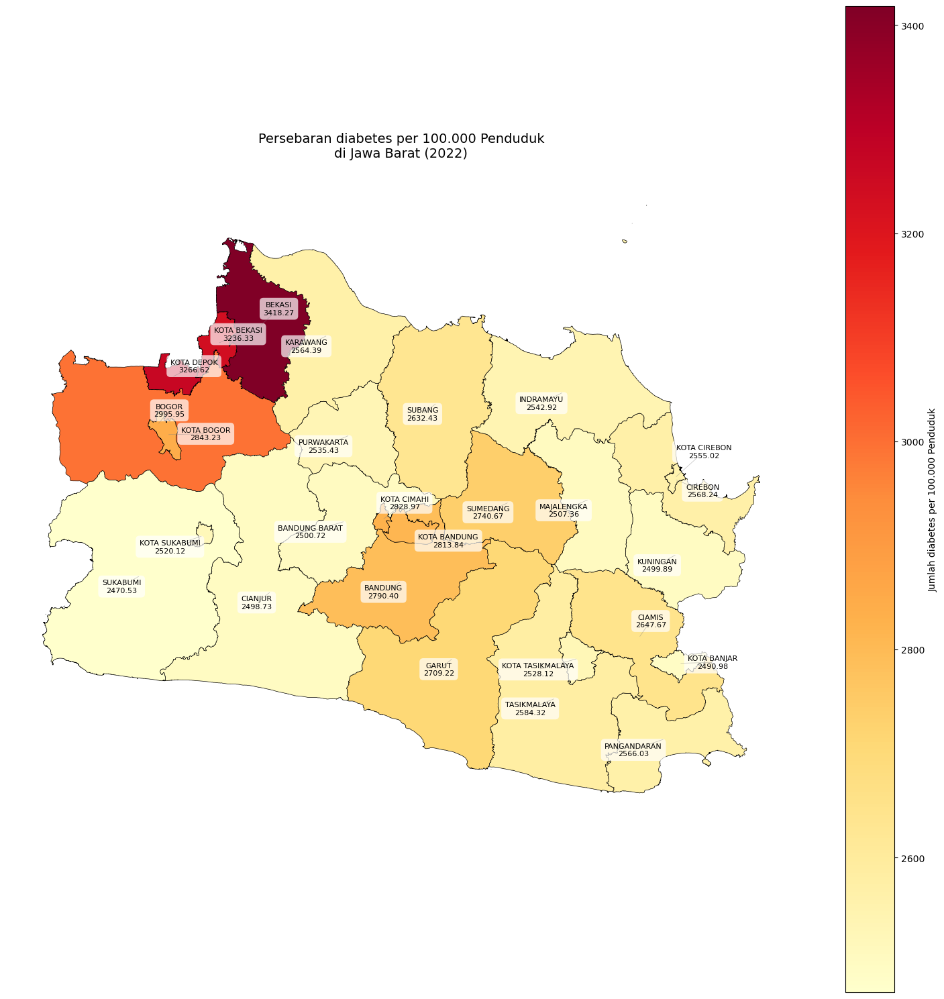

In [137]:
show_map_penyakit('diabetes',2022)

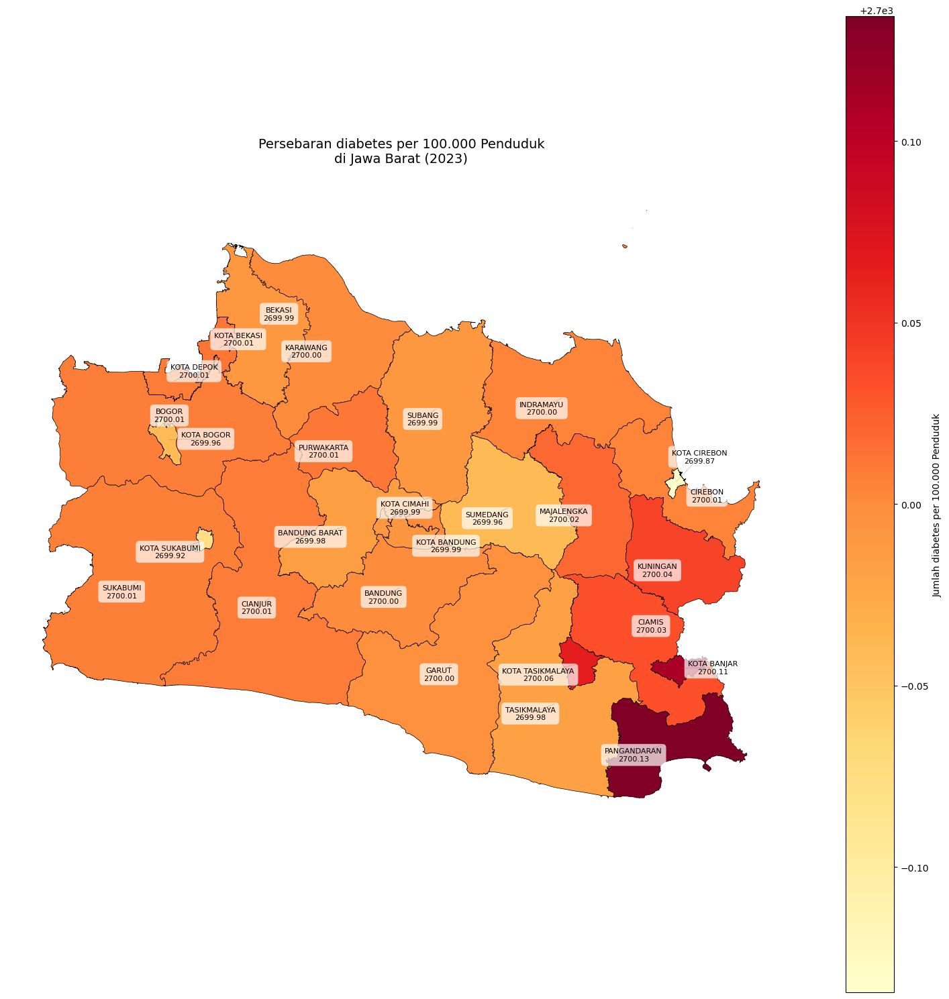

In [138]:
show_map_penyakit('diabetes',2023)

Berdasarkan plot tersebut, kami menyimpulkan beberapa analisis sebagai berikut:

1. Daerah-daerah yang berwarna lebih gelap (oranye-merah) menunjukkan tingkat kasus diabetes per 100.000 penduduk yang lebih tinggi dibandingkan dengan daerah yang berwarna lebih terang (kuning pucat).

2. Hampir di seluruh wilayah Jawa Barat terdapat cukup banyak kasus diabetes. Hal ini dapat mengindikasikan bahwa masyarakat di Jawa Barat mengonsumsi cukup banyak makanan instan seperti burger, pizza, dan sejenisnya.

3. Pada tahun 2021, saat lonjakan pandemi COVID-19 terjadi, masyarakat dianjurkan untuk tidak keluar rumah. Hal ini menyebabkan berkurangnya konsumsi makanan cepat saji karena banyak restoran yang tutup atau membatasi layanan.

4. Lonjakan kasus diabetes terjadi setelah pandemi COVID-19 mereda, ketika banyak toko makanan dan minuman manis mulai beroperasi kembali.

Dari analisis tersebut berarti hampir seluruh wilayah yang ada di Jawa Barat cukup banyak terjadi kasus diabetes. Plot map ini dapat membantu menyadarkan pemerintah atau dinas kesehatan Jawa Barat untuk dapat meningkatkan kesadaran masyarakat mengenai konsumsi gula berlebih dan konsumsi makanan cepat saji.

#### 8. Tetanus

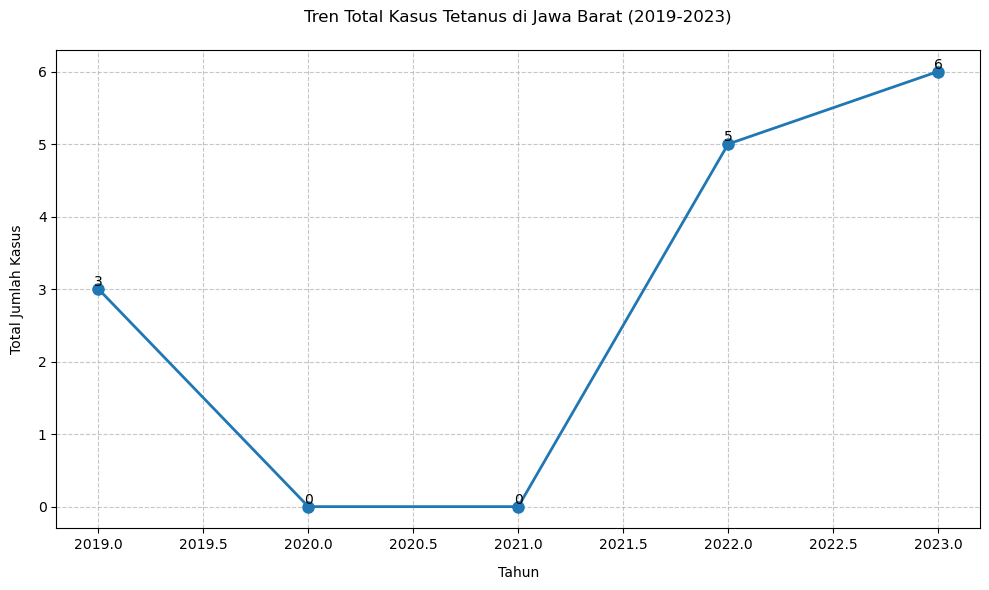


Tren Tahunan:
Jumlah kasus per tahun:
2019: 3 kasus
2020: 0 kasus
2021: 0 kasus
2022: 5 kasus
2023: 6 kasus

Persentase perubahan dari tahun sebelumnya:
2020: -100.0%
2022: +inf%
2023: +20.0%


In [139]:
show_tren_penyakit_jawa_barat_2019_2023('tetanus')

Berikut analisis tren dari grafik tersebut:

1. Pada tahun 2020 hingga 2021, tidak tercatat adanya kasus tetanus di Jawa Barat. Hal ini kemungkinan disebabkan oleh peningkatan layanan kesehatan terkait vaksinasi dan imunisasi di Jawa Barat.
2. Pada tahun 2022, tercatat 5 kasus tetanus di Jawa Barat, yang kemudian meningkat menjadi 6 kasus pada tahun 2023. Peningkatan ini mungkin terjadi akibat menurunnya cakupan vaksinasi di Jawa Barat, seiring dengan meredanya pandemi yang menyebabkan penurunan prioritas pada program vaksinansi.

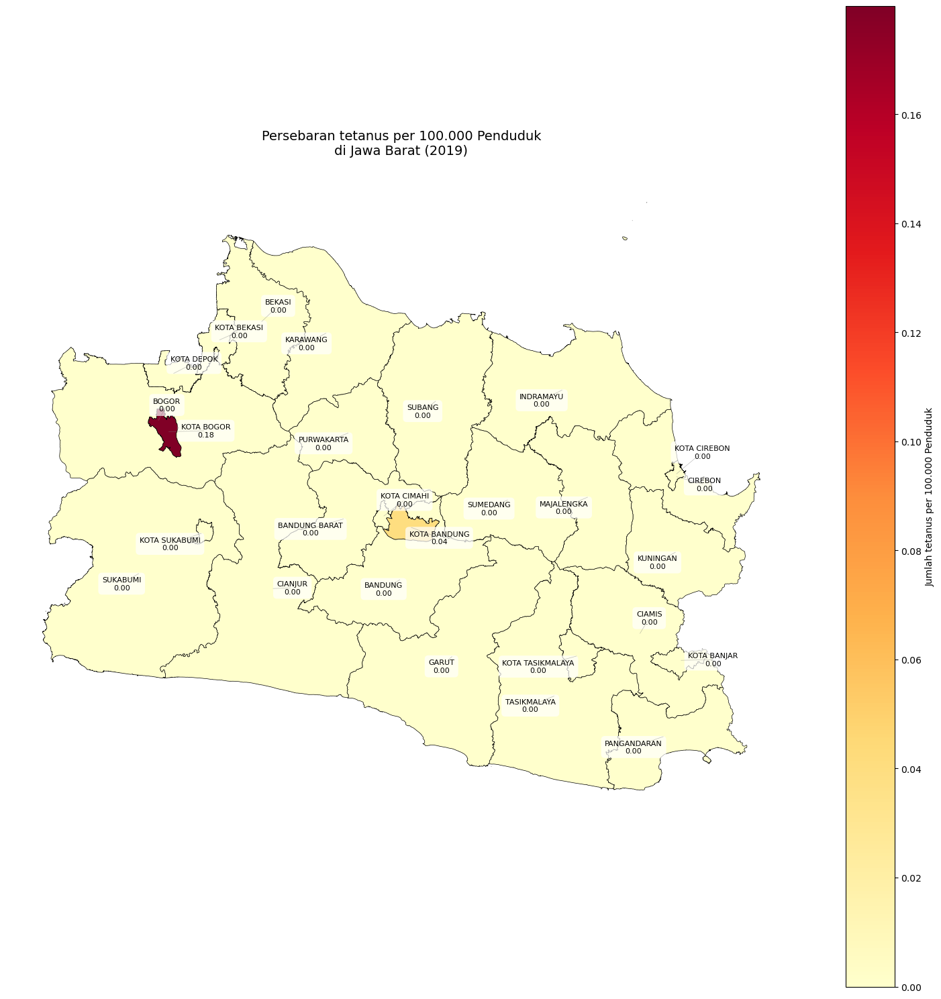

In [140]:
show_map_penyakit('tetanus',2019)

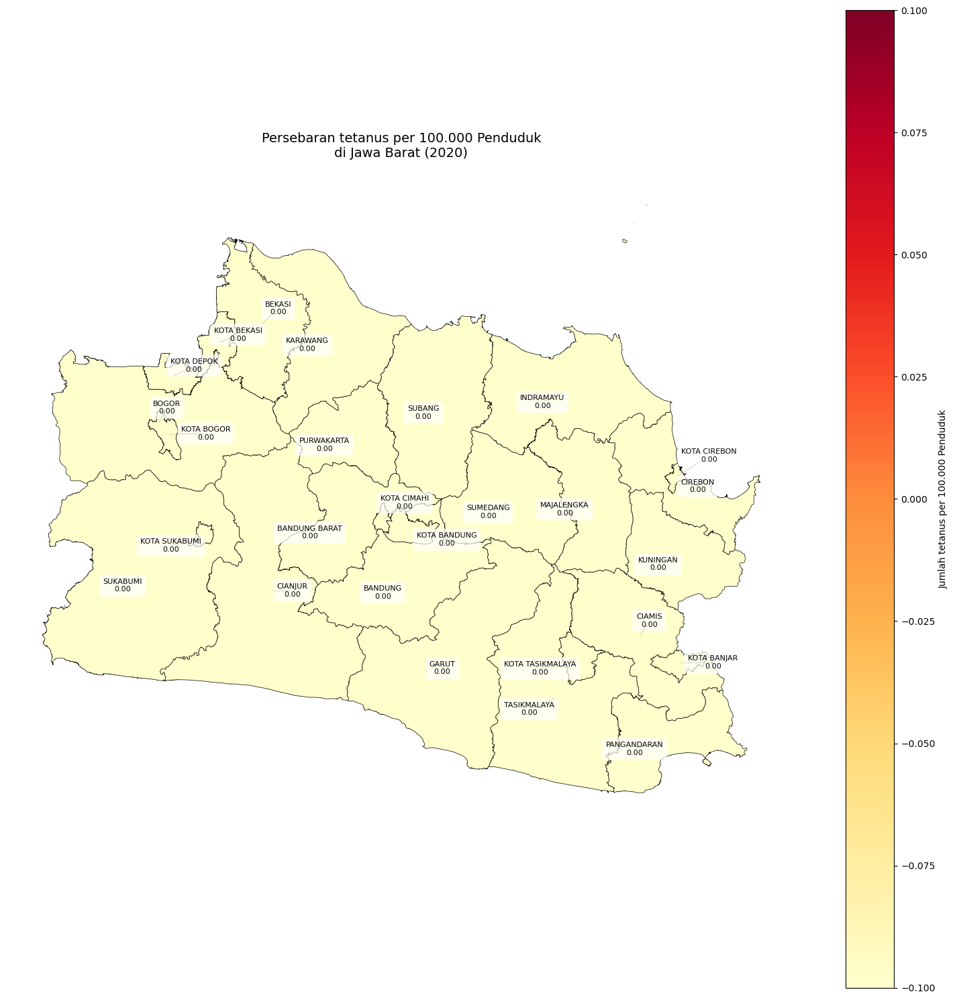

In [141]:
show_map_penyakit('tetanus',2020)

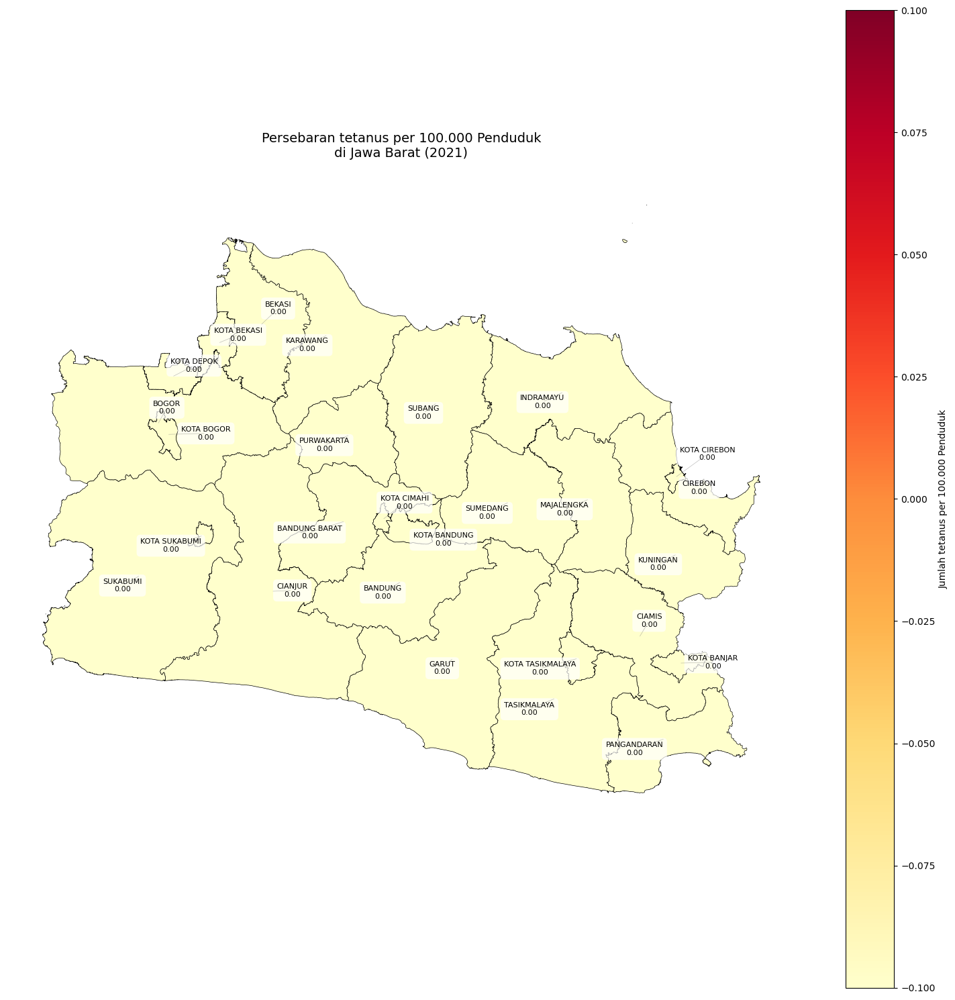

In [142]:
show_map_penyakit('tetanus',2021)

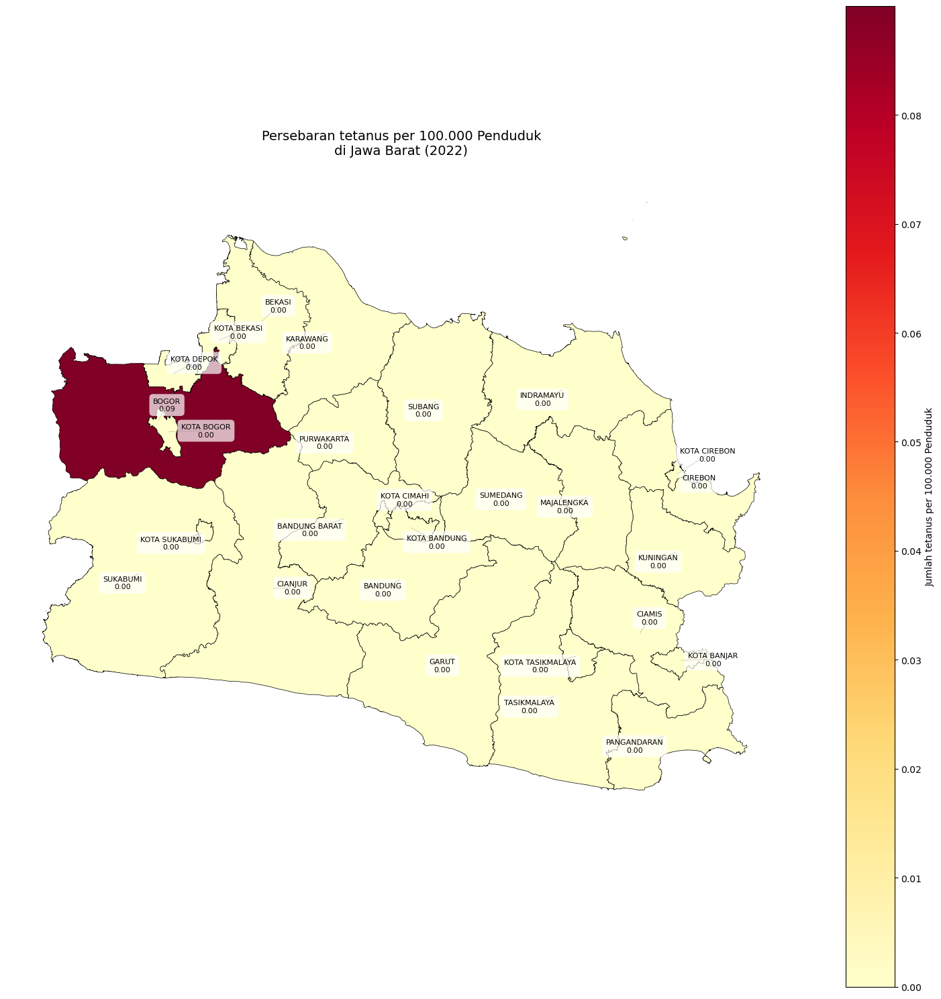

In [143]:
show_map_penyakit('tetanus',2022)

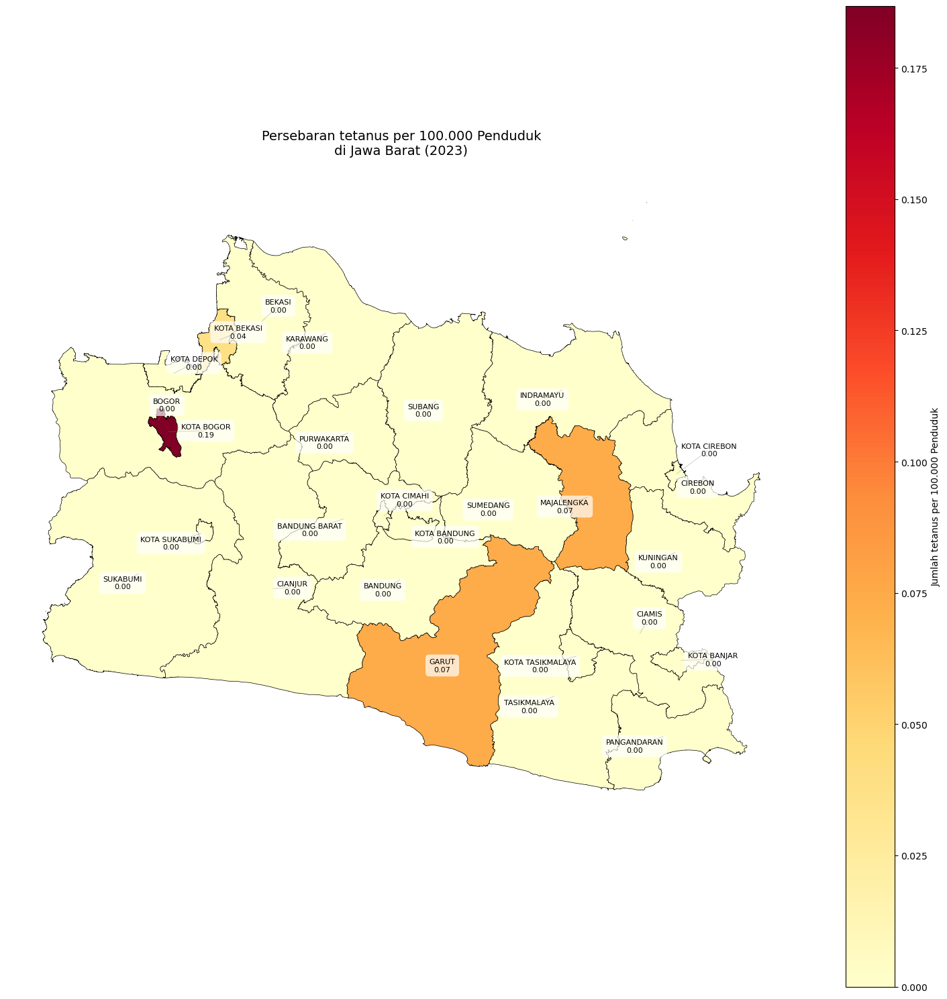

In [144]:
show_map_penyakit('tetanus',2023)

Berdasarkan plot tersebut, kami melakukan beberapa analisis sebagai berikut:

1. Daerah-daerah dengan warna yang lebih gelap (oranye-merah) menunjukkan tingkat kasus tetanus per 100.000 penduduk yang lebih tinggi dibandingkan dengan daerah yang berwarna lebih terang (kuning pucat).

2. Terlihat bahwa kasus penyakit tetanus jarang terjadi, terlihat dari dominasi warna putih dan angka 0 pada peta tersebut. Hal ini menunjukkan bahwa faktor-faktor pemicu tetanus, seperti tertusuk paku atau benda logam, jarang terjadi. Ini juga mengindikasikan bahwa masyarakat di Jawa Barat cenderung berhati-hati dalam pekerjaan fisik mereka.

#### 9. Tuberkulosis

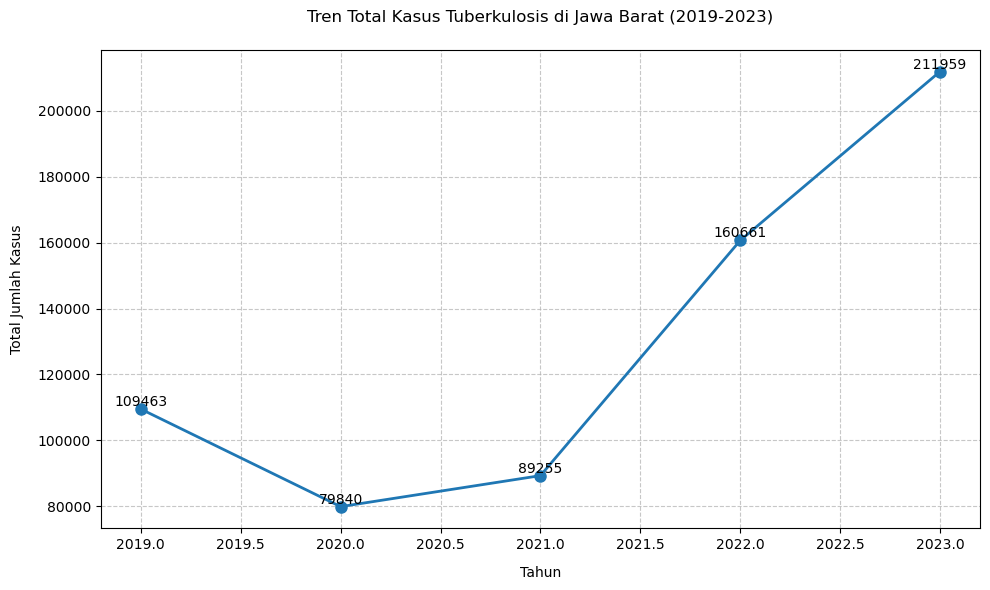


Tren Tahunan:
Jumlah kasus per tahun:
2019: 109463 kasus
2020: 79840 kasus
2021: 89255 kasus
2022: 160661 kasus
2023: 211959 kasus

Persentase perubahan dari tahun sebelumnya:
2020: -27.1%
2021: +11.8%
2022: +80.0%
2023: +31.9%


In [145]:
show_tren_penyakit_jawa_barat_2019_2023('tuberkulosis')

Berikut analisis tren dari grafik tersebut:

1. Pada tahun 2020 terjadi penurunan sebesar -27,1% dibandingkan tahun 2019. Penurunan ini bisa jadi disebabkan oleh akses terhadap layanan kesehatan selama pandemi COVID-19, yang mana lebih memprioritaskan penanganan pasien COVID-19, sehingga layanan untuk penyakit tuberkulosis, bisa saja terganggu atau berkurang.

2. Pada tahun 2021 jumlah kasus masih lebih rendah dibandingkan 2019, tetapi mengalami kenaikan 11,8% dibandingkan 2020. Kenaikan ini mungkin mengindikasikan pemulihan akses ke layanan kesehatan setelah pembatasan ketat akibat pandemi.

3. Terjadi peningkatan yang signifikan sebesar 80,0% pada tahun 2022, dibandingkan tahun 2021, mencapai 160.661 kasus. Peningkatan ini dapat disebabkan oleh upaya intensifikasi dalam deteksi dan pelaporan kasus TB.

4. Kenaikan berlanjut pada tahun 2023, dengan peningkatan sebesar 31,9%, mencapai 211.959 kasus. Hal ini menunjukkan adanya peningkatan konsistensi dalam deteksi atau pelaporan, atau peningkatan insiden TB di masyarakat.

5. Kenaikan tajam setelah tahun 2020 bisa jadi terkait dengan pemulihan layanan kesehatan pascapandemi, sehingga memungkinkan lebih banyak kasus terdeteksi. Selain itu, bisa juga ada faktor lain seperti penurunan kepatuhan terhadap pengobatan atau peningkatan faktor risiko yang menyebabkan TB lebih mudah menyebar di masyarakat.

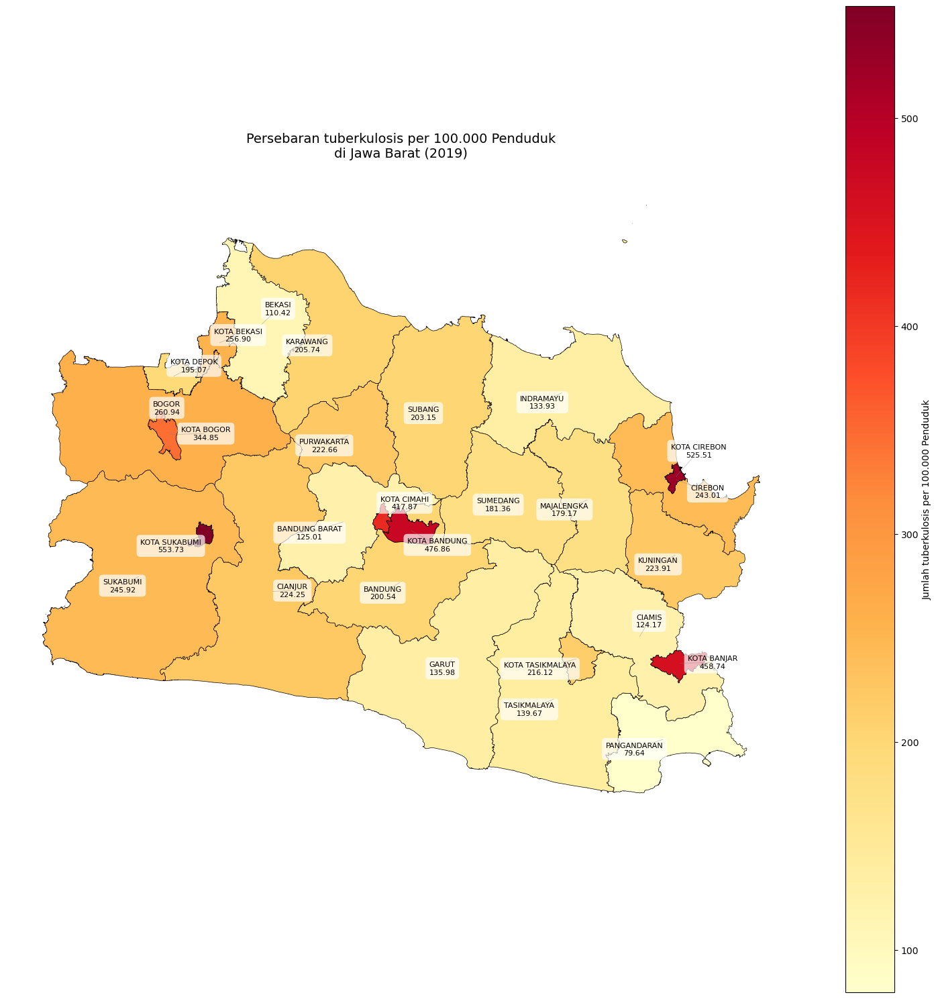

In [146]:
show_map_penyakit('tuberkulosis',2019)

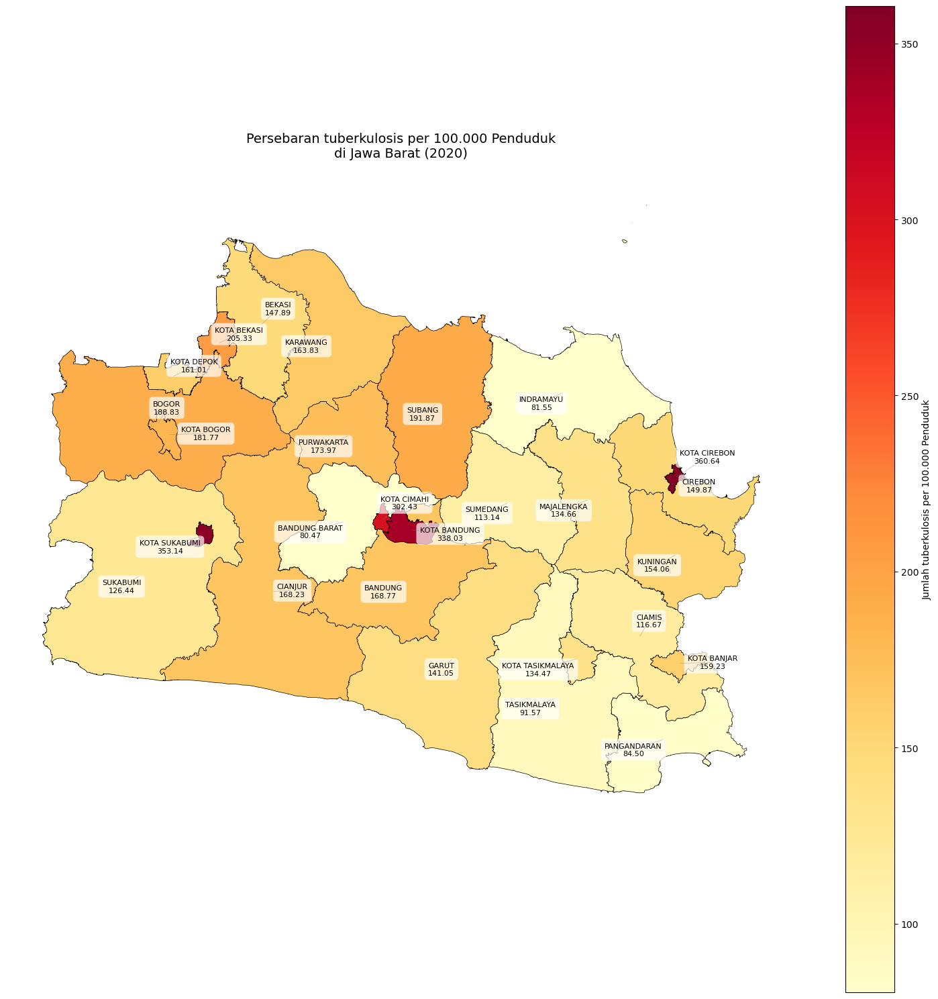

In [147]:
show_map_penyakit('tuberkulosis',2020)

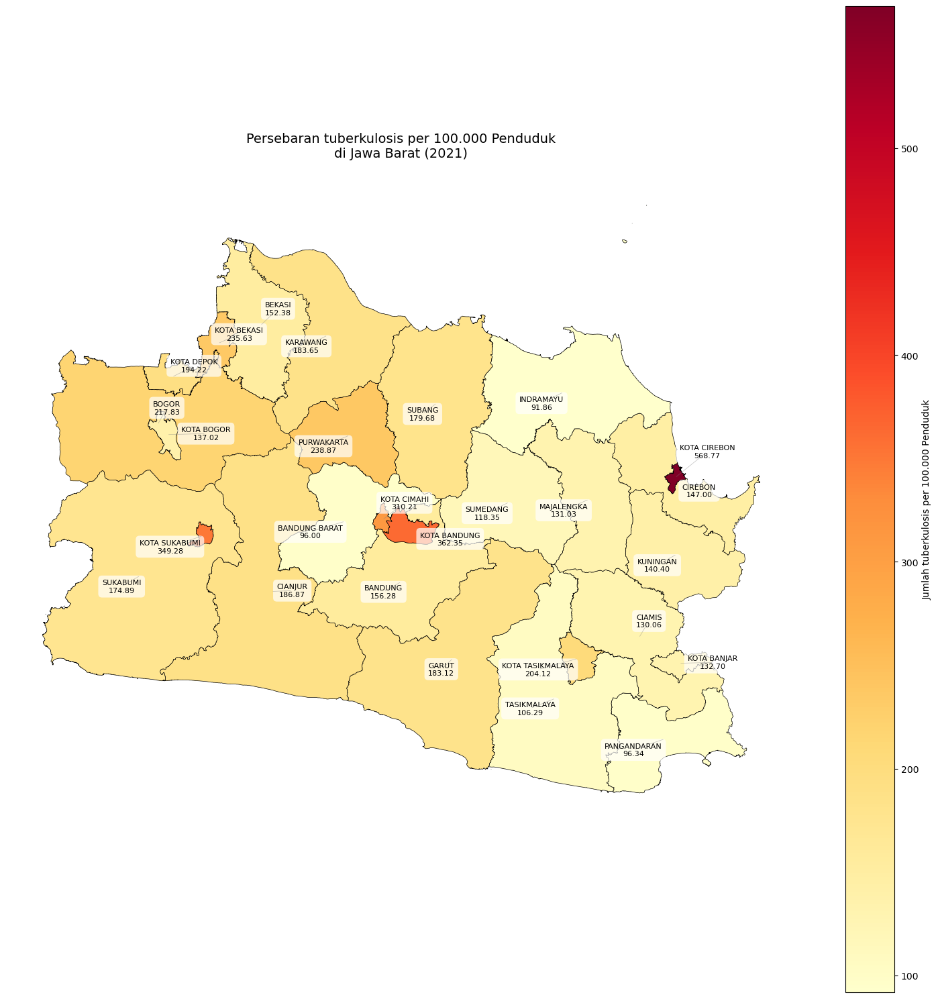

In [148]:
show_map_penyakit('tuberkulosis',2021)

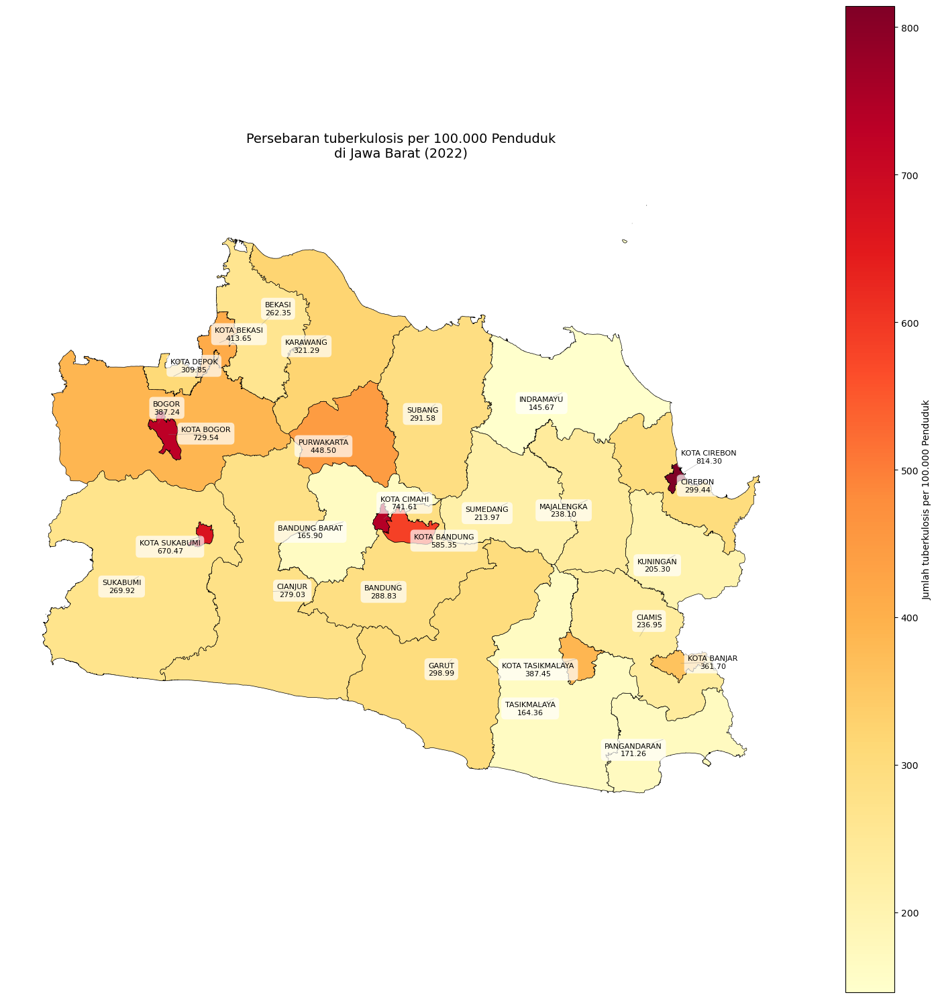

In [149]:
show_map_penyakit('tuberkulosis',2022)

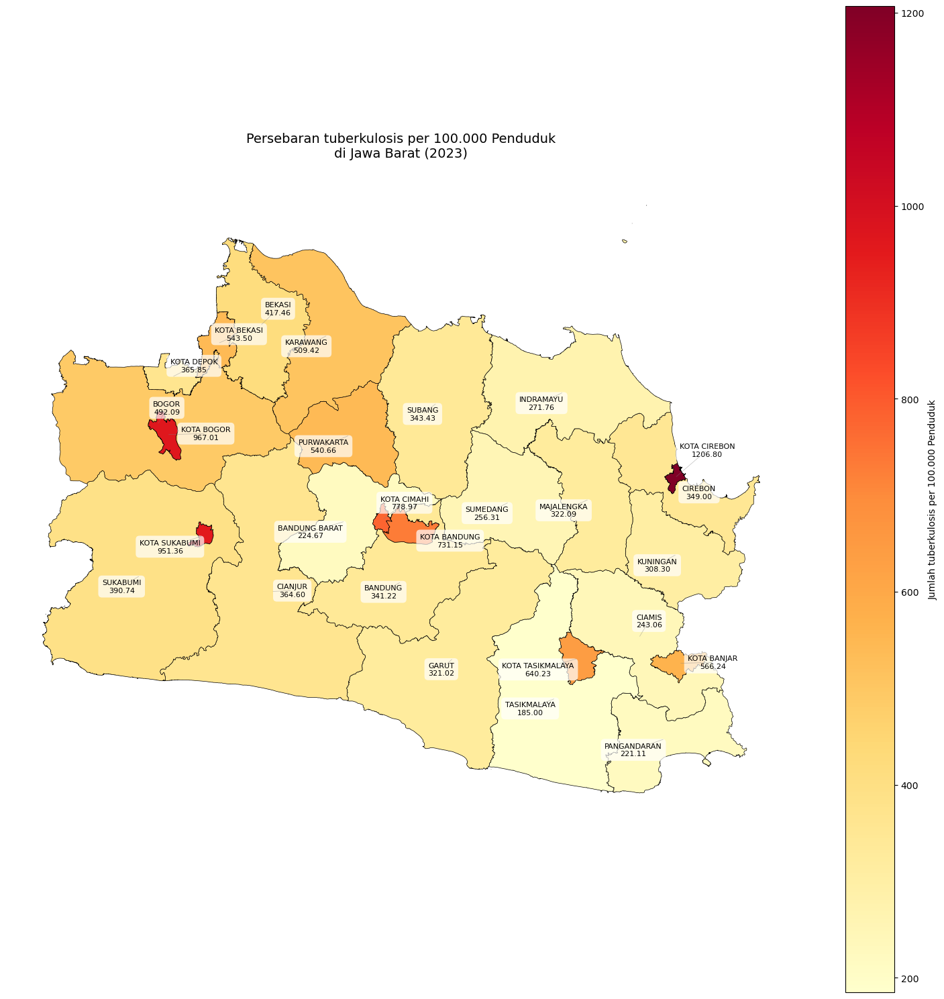

In [150]:
show_map_penyakit('tuberkulosis',2023)

Berdasarkan plot tersebut kami mengambil beberapa analisis, yaitu :

1. Daerah-daerah yang berwarna lebih gelap (oranye-merah) menunjukkan tingkat kasus TBC yang lebih tinggi per 100.000 penduduk dibandingkan dengan daerah yang berwarna lebih terang (kuning pucat).

2. Terlihat bahwa wilayah Kota dan Kabupaten Cirebon, Kota Sukabumi, Kabupaten Cimahi dan Kota Bandung memiliki jumlah kasus TBC yang tinggi dan stagnan dari tahun 2019-2023 dibanding wilayah lainnya. 

3. Mayoritas Kabupaten atau Kota yang bertanda gelap (merah-oranye) dalam plot tersebut, yaitu Kota Sukabumi, Kota Cirebon dan Cimahi, Kota Bandun dan Kota Bogor merupakan daerah dengan padat penduduk dan perkotaan yang mana memiliki jumlah polusi yang tinggi. Plot map ini dapat membantu pemerintah atau dinas kesehatan Jawa Barat untuk melakukan survei lebih lanjut, seperti melihat faktor risiko di daerah tertentu atau meningkatkan kesadaran masyarakat mengenai vaksinasi TBC di wilayah dengan angka kasus tinggi sehingga upaya pencegahan lebih terfokus sesuai dengan kebutuhan tiap daerah di Jawa Barat.

### Pesebaran Fasilitas Kesehatan dari Tahun 2019 - 2023

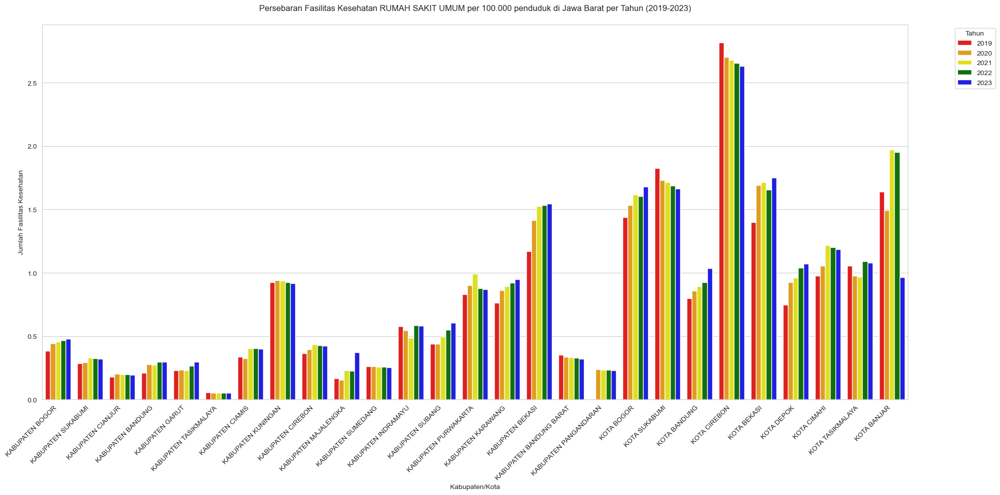

In [151]:
show_plot_faskes('RUMAH SAKIT UMUM')

Berikut analisis dari plot tersebut:

1. Terdapat perbedaan signifikan dalam jumlah rumah sakit umum per 100.000 penduduk di berbagai kota dan kabupaten di Jawa Barat. Kota-kota seperti Kota Cirebon memiliki jumlah rumah sakit umum yang lebih tinggi per kapita dibandingkan wilayah lainnya.

2. Kota Cirebon menempati peringkat teratas dalam jumlah rumah sakit umum per kapita. Tingginya jumlah rumah sakit di kota-kota ini menunjukkan tingkat akses layanan kesehatan sekunder yang lebih baik bagi penduduk.

3. Sebagian besar daerah menunjukkan pertumbuhan jumlah rumah sakit umum dari tahun 2019 hingga 2023, yang kemungkinan merupakan respons terhadap kebutuhan akan fasilitas kesehatan yang lebih banyak dan lebih baik, terutama setelah pandemi COVID-19.

4. Beberapa kabupaten seperti Kabupaten Tasikmalaya, Kabupaten Pangandaran, dan Kabupaten Cianjur memiliki jumlah rumah sakit umum yang relatif rendah per kapita. Ini menunjukkan adanya ketimpangan dalam distribusi fasilitas kesehatan, yang dapat menyebabkan akses yang terbatas terhadap layanan kesehatan bagi masyarakat di daerah tersebut.

5. Kota-kota besar dengan populasi tinggi seperti Bandung cenderung memiliki lebih banyak rumah sakit umum per kapita, kemungkinan karena kebutuhan yang lebih besar akan layanan kesehatan dan daya tarik investasi kesehatan di kota-kota tersebut.

Daerah dengan jumlah rumah sakit umum rendah per kapita mungkin mengalami keterbatasan dalam menyediakan layanan kesehatan yang mencukupi, terutama dalam penanganan penyakit yang memerlukan perawatan intensif atau fasilitas kesehatan yang lebih canggih.
Chart ini menunjukkan bahwa meskipun terdapat peningkatan jumlah rumah sakit umum di Jawa Barat, masih terdapat ketimpangan dalam distribusi fasilitas ini. Kota-kota seperti Kota Cirebon memiliki akses yang lebih baik terhadap layanan rumah sakit umum, sementara beberapa kabupaten lain masih membutuhkan perhatian lebih untuk meningkatkan ketersediaan rumah sakit demi memastikan akses yang lebih merata bagi seluruh penduduk di Jawa Barat.


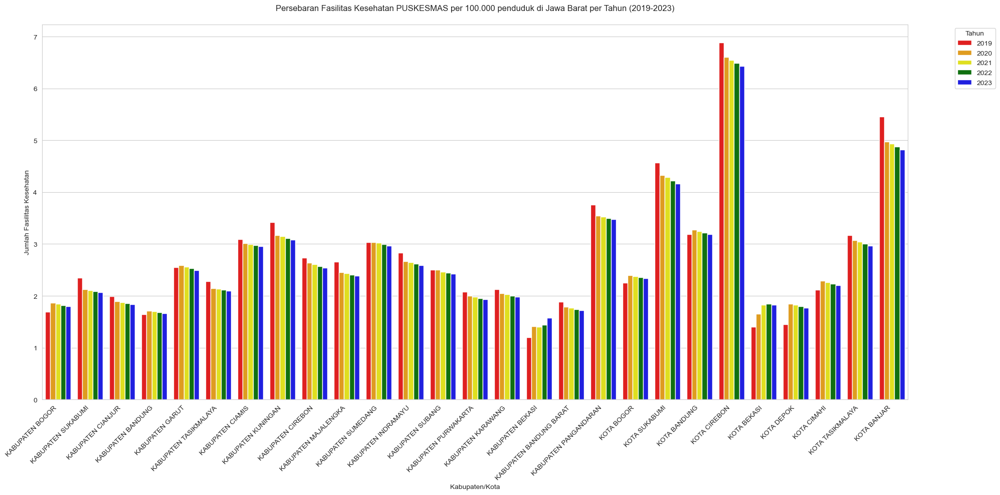

In [152]:
show_plot_faskes('PUSKESMAS')

Berikut analisis dari bar plot tersebut:

1. Chart menunjukkan variasi yang signifikan dalam jumlah PUSKESMAS per 100.000 penduduk di berbagai kota dan kabupaten di Jawa Barat. Beberapa kota seperti Kota Cirebon, Kota Banjar, Kota Sukabumi dan Kota Bekasi memiliki jumlah PUSKESMAS per kapita yang lebih tinggi dibandingkan daerah lain, menunjukkan perhatian lebih pada penyediaan fasilitas kesehatan di daerah tersebut.

2. Kota Cirebon menempati posisi teratas dalam hal jumlah PUSKESMAS per 100.000 penduduk. Hal ini bisa diindikasikan sebagai upaya daerah-daerah tersebut dalam memberikan akses kesehatan yang lebih baik kepada warganya.
3. Beberapa kabupaten seperti Kabupaten Tasikmalaya, Kabupaten Cianjur, dan Kabupaten Pangandaran memiliki jumlah PUSKESMAS yang relatif rendah per kapita. Hal ini menunjukkan adanya ketimpangan dalam distribusi fasilitas kesehatan di Jawa Barat, yang mungkin membuat masyarakat di daerah tersebut memiliki akses yang lebih terbatas terhadap layanan kesehatan.
4. Dari tahun 2019 hingga 2023, grafik menunjukkan peningkatan jumlah PUSKESMAS di sebagian besar daerah, mengindikasikan adanya penambahan fasilitas kesehatan setiap tahunnya. Peningkatan ini kemungkinan didorong oleh kebutuhan untuk memperkuat layanan kesehatan, terutama setelah pandemi COVID-19.
5. Daerah-daerah dengan jumlah PUSKESMAS rendah kemungkinan mengalami tantangan dalam menyediakan layanan kesehatan yang memadai. Keterbatasan ini dapat berdampak pada aksesibilitas masyarakat terhadap layanan kesehatan, terutama di daerah terpencil atau dengan penduduk padat, yang mungkin menyebabkan antrian panjang dan kualitas pelayanan yang menurun.

Secara keseluruhan, chart ini menunjukkan bahwa meskipun ada peningkatan jumlah PUSKESMAS di Jawa Barat dari tahun ke tahun, terdapat ketimpangan distribusi yang cukup signifikan. Beberapa kota memiliki rasio fasilitas kesehatan yang tinggi, sementara kabupaten lain masih kekurangan. Upaya untuk menyeimbangkan distribusi PUSKESMAS akan sangat penting untuk memastikan akses yang merata terhadap layanan kesehatan bagi seluruh masyarakat di Jawa Barat.


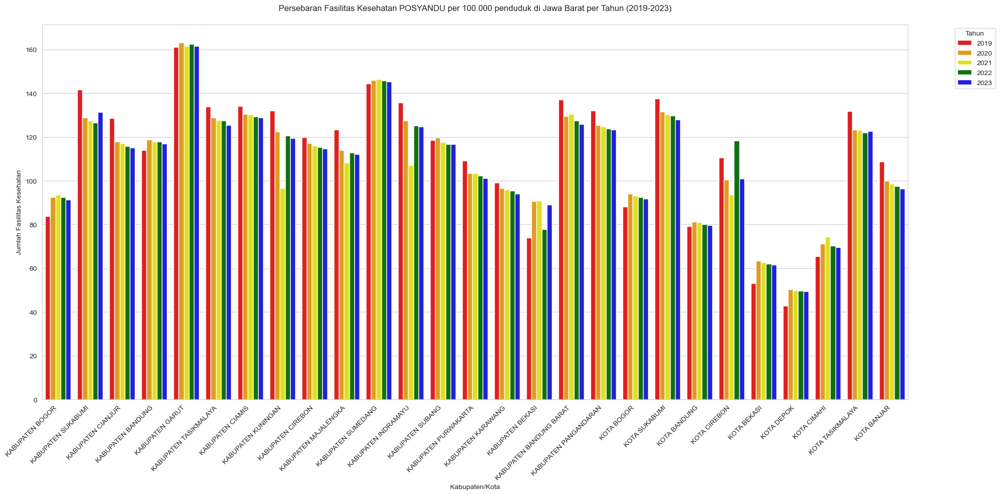

In [153]:
show_plot_faskes('POSYANDU')

Analisis yang dapat kami simpulkan, yaitu:
1. Pada tahun 2021 mayoritas kabupaten atau kota di Jawa Barat tidak mengalami kenaikan dari tahun sebelumnya bahkan ada yang turun. Penurunan ini mungkin karena pandemi COVID-19 beberapa posyandu tidak beroperasi sehingga persebaran posyandu berkurang. Penurunan yang signifikan ini misalnya di daerah Kuningan.
2. Tahun 2023 tidak ada peningkatan persebaran posyandu di tiap daerah di Jawa Barat. Ini kemungkinan pembangunan posyandu yang sudah dirasa cukup.

## Pesebaran Fasilitas Kesehatan Pada Tahun 2023

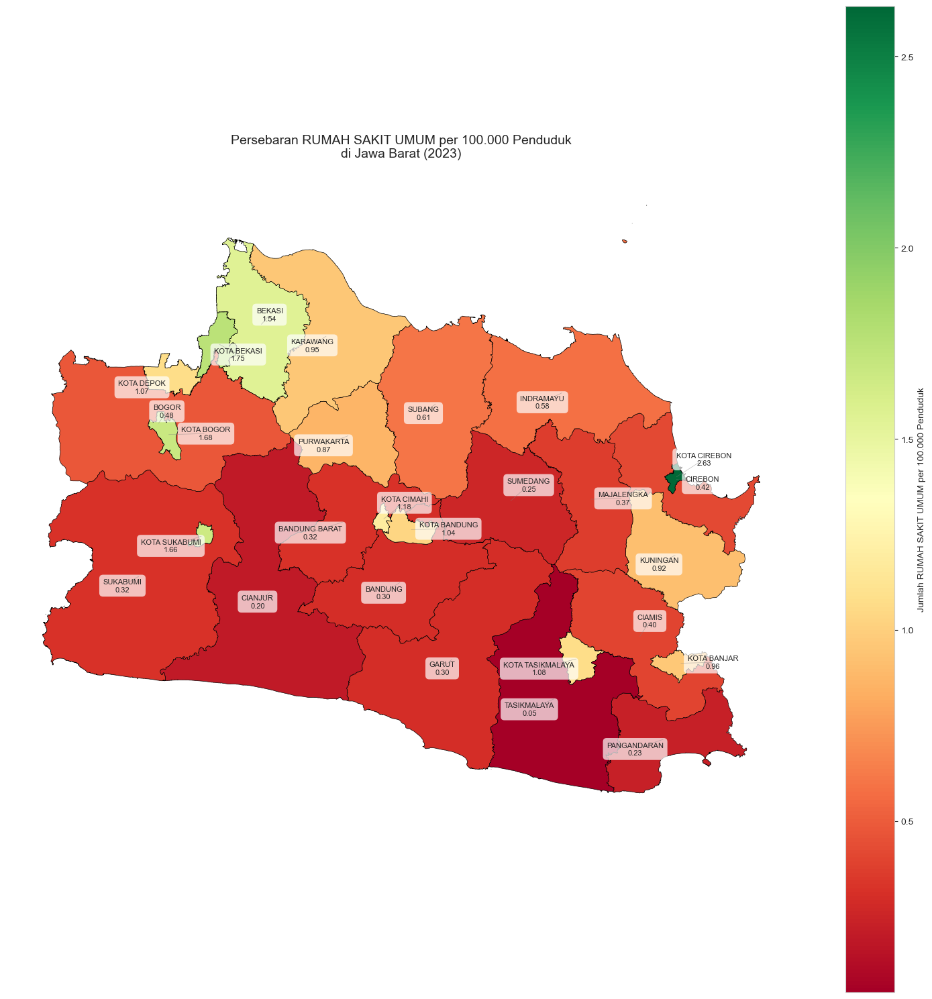

In [154]:
show_map_faskes('RUMAH SAKIT UMUM', 2023)

Dari plot map tersebut menunjukkan:

1. Kota Cirebon memiliki persebaran rumah sakit yang sangat memadai dengan perbandingan jumlah penduduk yang tidak terlalu banyak. 
2. Selain itu kota Bekasi, Kabupaten Bekasi dan Kabupaten Bogor juga memiliki persebaran rumah sakit yang cukup. Hal ini mungkin karena pemerintah daerah yang cekatan terhadap kesehatan maupun banyaknya pabrik yang mendukung pembangunan faskes. 
3. Kota Tasikmalaya dan Kota Cianjur memiliki persebaran yang rendah jika dibandingkan dengan jumlah penduduknya. Ini mungkin karena akses pembangunan yang sulit.

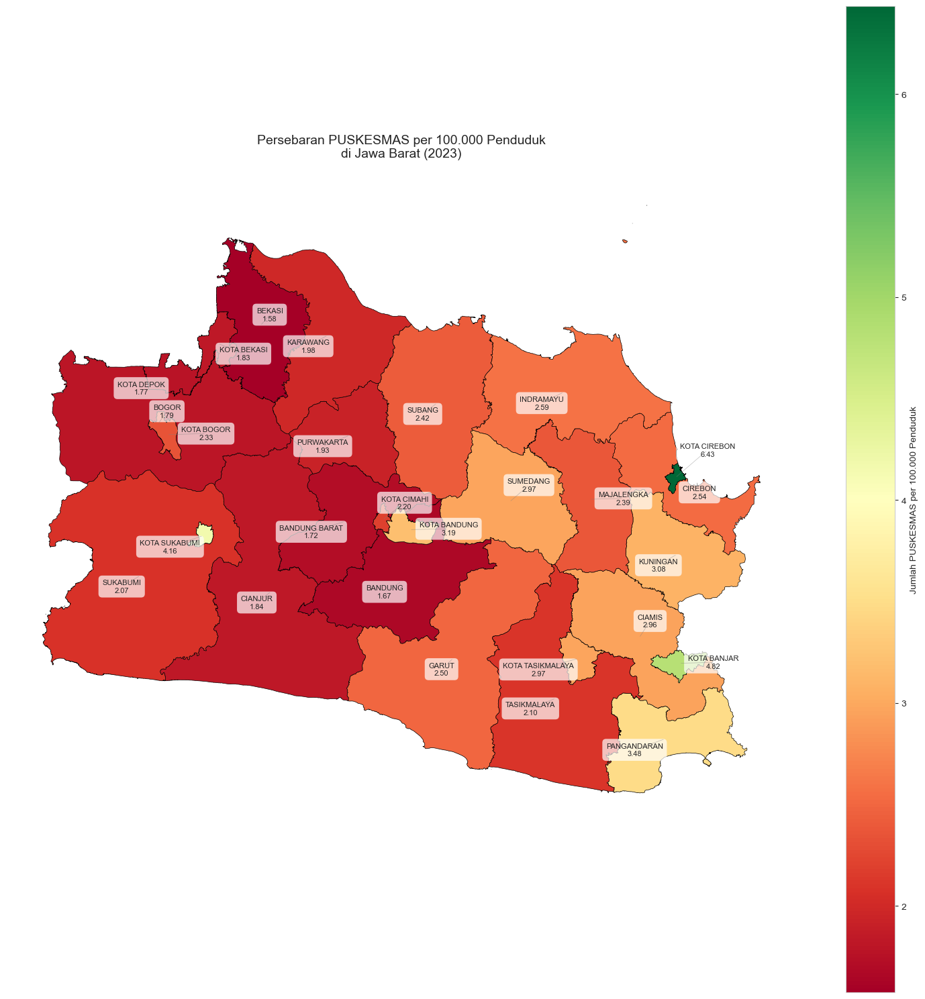

In [155]:
show_map_faskes('PUSKESMAS', 2023)

Berikut analisi dari plot tersebut:

1. Kota Cirebon memiliki fasilitas kesehatan dalam hal ini PUSKESMAS yang sangat cukup melihat perbandingannya dengan jumlah penduduknya. Ini mungkin sebagai salah satu penanganan pemerintah terhadap kasus penyakit yang seringkali terjadi. 
2. Kota Banjar, Kota Sukabumi,  dan Kota Bandung berada di tahap aman menyesuaikan dengan jumlah penduduk dan persebaran puskesmas di daerahnya. 
3. Kota Bekasi, Daerah Bandung, serta kota atau kabupaten di sekitarnya terlihat kurang memenuhi persebaran fasilitasnya. Ini mungkin karena jumlah penduduk yang terlalu padat atau wilayah yang luas tidak sebanding dengan persebaran puskesmas di daerah tersebut.

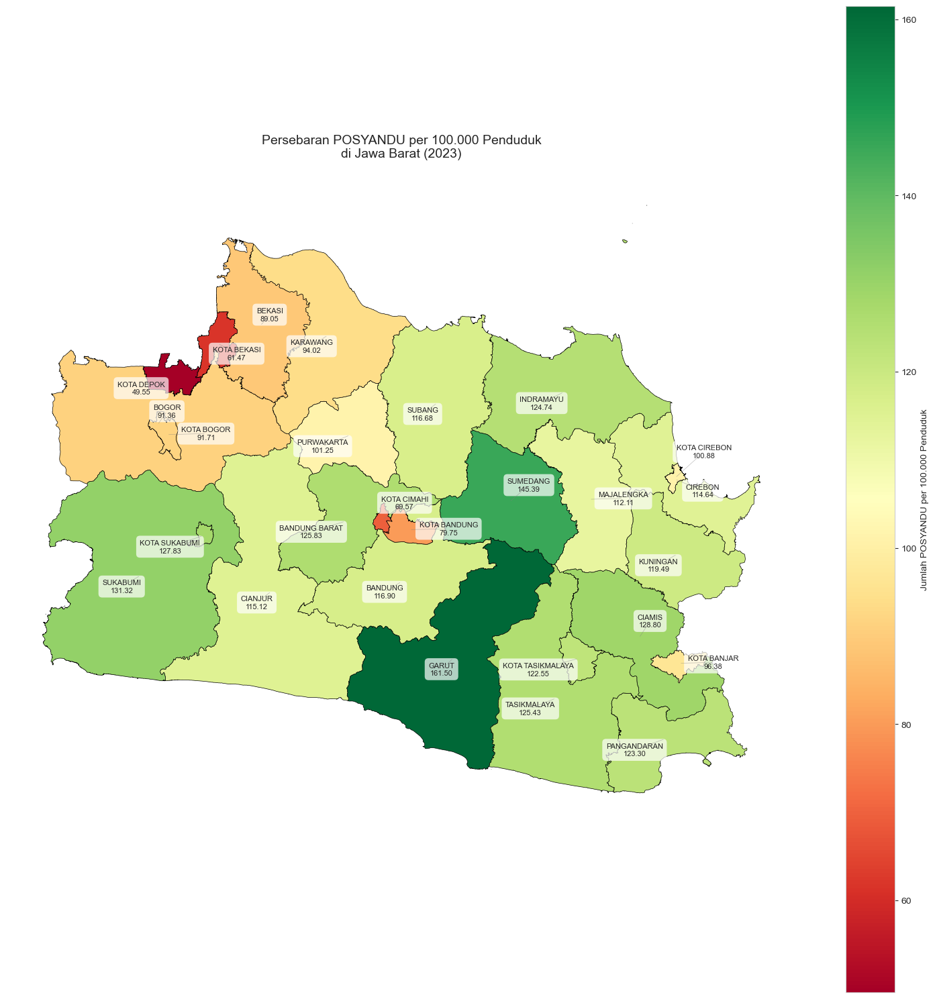

In [156]:
show_map_faskes('POSYANDU', 2023)

Berikut analisis dari plot tersebut:

1. Mayoritas kabupaten atau kota di Jawa Barat memiliki persebaran posyandu yang cukup terutama di Garut.
2. Kota Bekasi, Kota Depok, dan Kota Cimahi memiliki persebaran yang kurang. Ini mungkin karena daerah yang kecil dengan banyak penduduk sehingga persebaran posyandu tidak merata.

### Kesimpulan

1. Daerah di perkotaan pada umumnya memiliki akses terhadap fasilitas kesehatan yang lebih baik daripada daerah kabupaten
2.  Perbandingan posyandu dengan jumlah penduduk di wilayah Jawa Barat terlihat seimbang, hal ini dapat dilihat dari warna wilayah yang umumnya berwarna hijau
3. Perbandingan Rumah Sakit Umum dengan penduduk cenderung baik di wilayah sekitar jabodetabek, hal ini tentunya wajar mengingat daerah tersebut merupakan daerah maju dan padat penduduk
4. Perbandingan puskesmas dengan jumlah penduduk terlihat cukup baik untuk daerah bagian timur Jawa Barat, hal ini karena penduduk di bagian timur Jawa Barat tidak sepadat bagian Barat
5. Di beberapa penyakit tertentu Kota Cirebon memiliki rate penyakit yang tinggi dibandingkan wilayah lain, tetapi hal tersebut diimbangi dengan rate Fasilitas kesehatan yang tinggi juga
6. Terlihat beberapa penyakit yang tren persebarannya menurun ketika memasuku masa pandemi, hal tersebut berkaitan dengan adanya isolasi mandiri sehingga menekan penyebaran di beberapa penyakit
7. Perlu ada perhatian khusus untuk wilayah di bagian timur Jawa Barat terutama daerah Priangan Timur dalam pembangunan Rumah Sakit Umum, karena di daerah tersebut akses ke RS Umum bergantung kepada Kota Tasikmalaya dan Kota Banjar